In [142]:
import pandas as pd
import os
from datetime import datetime, timedelta
import numpy as np

# Load the elections data
elections_df = pd.read_csv('DATA/Initial Data.csv')

# Function to normalize dates relative to an election date
def normalize_dates(df, election_date):
    df['NormalizedDate'] = (df['Date'] - election_date).dt.days
    return df[(df['NormalizedDate'] >= -180) & (df['NormalizedDate'] <= 180)]

# Function to clean price data
def clean_price(price):
    if isinstance(price, str):
        return np.log(float(price.replace(',', '')))
    return np.log(price)

# Function to load and process index data
def process_index(file_path, election_date, index_name, election_name):
    df = pd.read_csv(file_path)
    df['Date'] = pd.to_datetime(df['Date'])
    df['Price'] = df['Price'].apply(clean_price)
    df = df.sort_values('Date')
    
    normalized_df = normalize_dates(df, election_date)
    if not normalized_df.empty:
        column_name = f"{election_name}_{index_name}"
        return normalized_df[['NormalizedDate', 'Price']].rename(columns={'Price': column_name})
    return None

# Main processing
all_dfs = []
csv_directory = 'DATA/INDICES/'

In [143]:
for _, election in elections_df.iterrows():
    index_name = election['Index']
    election_date = pd.to_datetime(election['Date 1'])
    election_name = f"{election['Year']}_{election['Elections']}"
    filep = csv_directory +  index_name + ".csv"
    file_path = os.path.abspath(filep)
    print(file_path)
    if os.path.exists(file_path):
        processed_df = process_index(file_path, election_date, index_name, election_name)
        if processed_df is not None:
            all_dfs.append(processed_df)
    else:
        print(f"Warning: File not found for index {index_name}")

c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\NLFIN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\BNKI.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FTATBNK.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\N3020PI.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FTITLMS30.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\NYK.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political 

In [144]:
if all_dfs:
    merged_df = all_dfs[0]
    for df in all_dfs[1:]:
        merged_df = pd.merge(merged_df, df, on='NormalizedDate', how='outer')
    
    # Sort by NormalizedDate
    merged_df = merged_df.sort_values('NormalizedDate')
    
    # Fill NaN values using forward fill and then backward fill
    merged_df = merged_df.fillna(method='ffill').fillna(method='bfill')
    
    # Save the final dataframe to a CSV file
    merged_df.to_csv('log_norm_election_data.csv', index=False)
    print("Processing complete. Data saved to 'log_norm_election_data.csv'")
else:
    print("No data processed. Check your input files and paths.")

Processing complete. Data saved to 'log_norm_election_data.csv'


<Axes: >

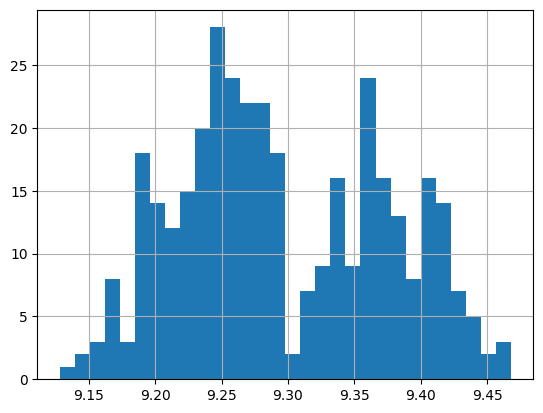

In [145]:
merged_df['2013_Italian general election_FTITLMS30'].hist(bins=30)

In [146]:
brexit_column = '2016_United Kingdom Brexit_TRINMX302020'
print(merged_df[brexit_column].head())
print(merged_df[brexit_column].isnull().sum())
print(merged_df[brexit_column].describe())

0    8.347228
1    8.347228
2    8.347228
3    8.347228
4    8.340582
Name: 2016_United Kingdom Brexit_TRINMX302020, dtype: float64
0
count    361.000000
mean       8.295208
std        0.056865
min        8.111892
25%        8.260224
50%        8.296629
75%        8.346540
max        8.393008
Name: 2016_United Kingdom Brexit_TRINMX302020, dtype: float64



Interrupted Time Series Analysis for 2024_French Senate election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.626
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     199.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           6.48e-76
Time:                        17:31:19   Log-Likelihood:                 874.66
No. Observations:                 361   AIC:                            -1741.
Df Residuals:                     357   BIC:                            -1726.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

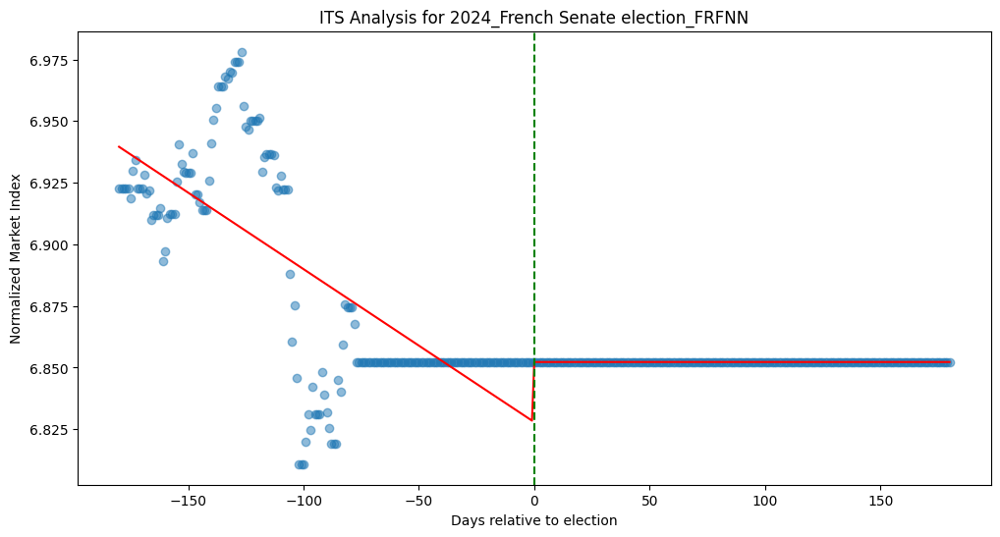


Interrupted Time Series Analysis for 2023_Spanish general election_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.655
Model:                            OLS   Adj. R-squared:                  0.653
Method:                 Least Squares   F-statistic:                     226.4
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           3.08e-82
Time:                        17:31:19   Log-Likelihood:                 659.60
No. Observations:                 361   AIC:                            -1311.
Df Residuals:                     357   BIC:                            -1296.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

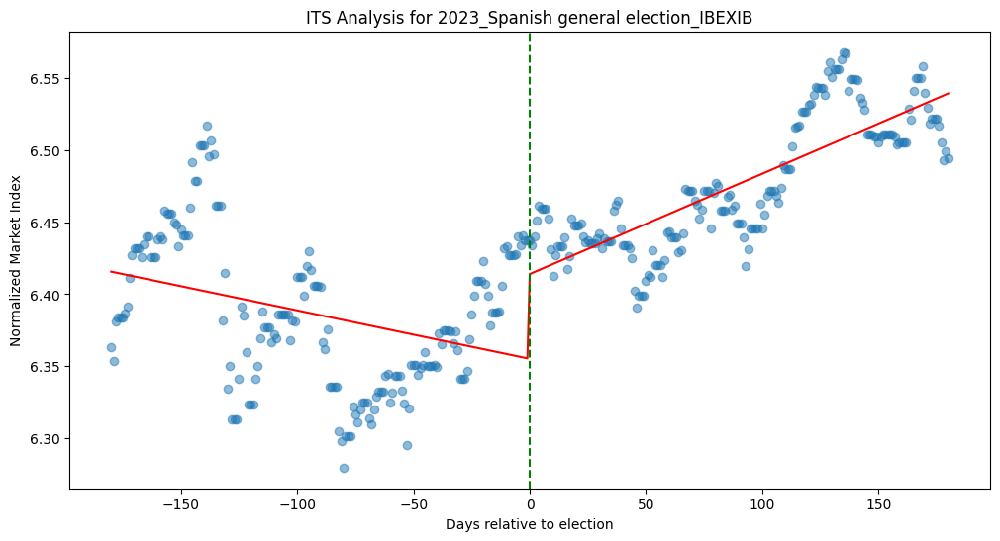


Interrupted Time Series Analysis for 2023_Dutch general election_NLFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.904
Model:                            OLS   Adj. R-squared:                  0.903
Method:                 Least Squares   F-statistic:                     1116.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          6.41e-181
Time:                        17:31:19   Log-Likelihood:                 824.84
No. Observations:                 361   AIC:                            -1642.
Df Residuals:                     357   BIC:                            -1626.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

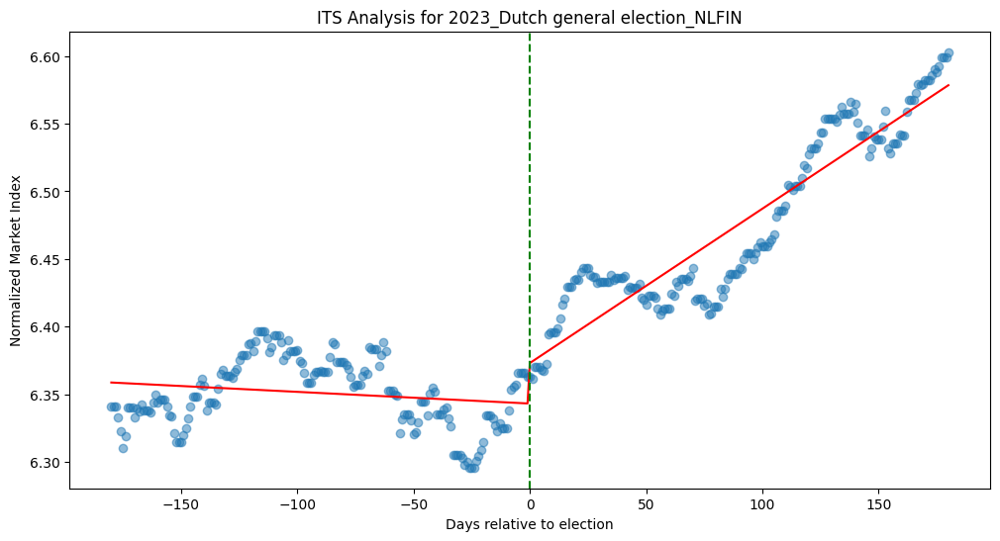


Interrupted Time Series Analysis for 2023_Polish parliamentary election_BNKI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     2088.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          6.25e-226
Time:                        17:31:19   Log-Likelihood:                 582.06
No. Observations:                 361   AIC:                            -1156.
Df Residuals:                     357   BIC:                            -1141.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

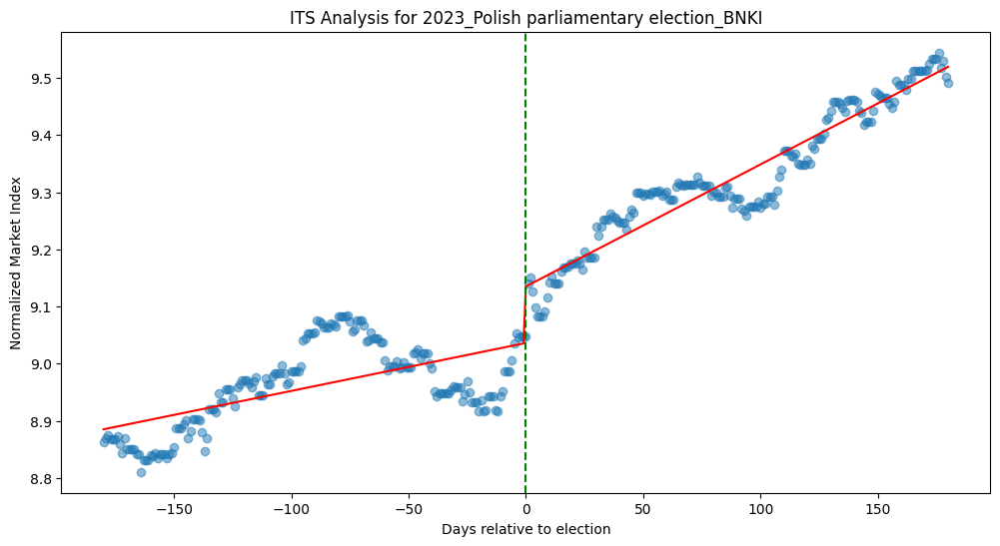


Interrupted Time Series Analysis for 2023_Greek legislative election_FTATBNK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.846
Model:                            OLS   Adj. R-squared:                  0.844
Method:                 Least Squares   F-statistic:                     651.8
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.04e-144
Time:                        17:31:20   Log-Likelihood:                 471.64
No. Observations:                 361   AIC:                            -935.3
Df Residuals:                     357   BIC:                            -919.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

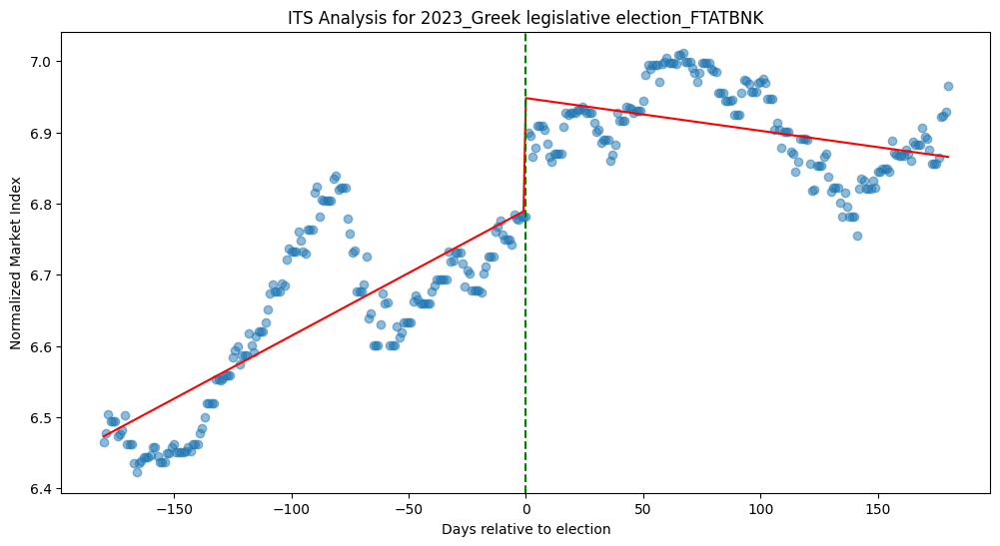


Interrupted Time Series Analysis for 2023_Finnish parliamentary election_N3020PI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.309
Method:                 Least Squares   F-statistic:                     54.54
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           4.83e-29
Time:                        17:31:20   Log-Likelihood:                 645.62
No. Observations:                 361   AIC:                            -1283.
Df Residuals:                     357   BIC:                            -1268.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

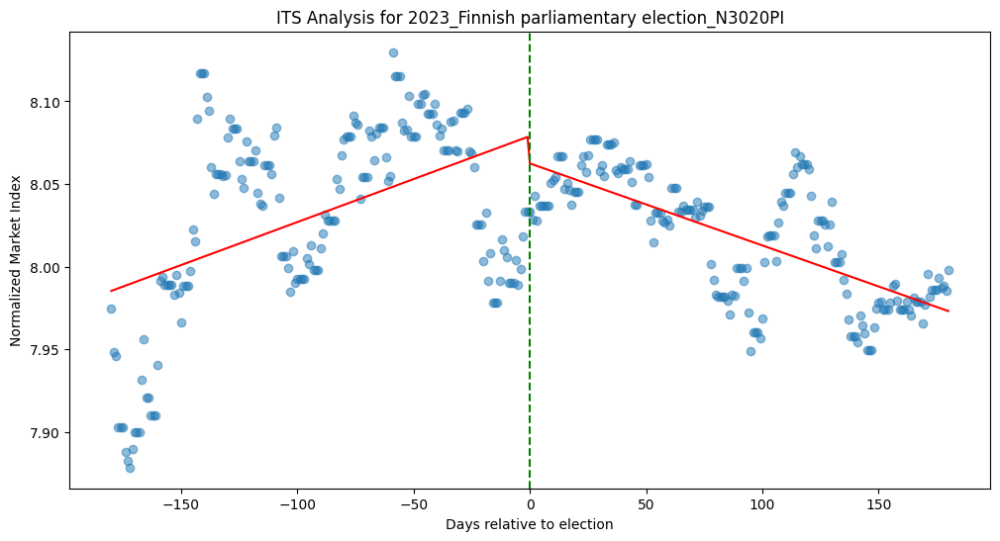


Interrupted Time Series Analysis for 2023_Italian local elections_FTITLMS30
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.809
Method:                 Least Squares   F-statistic:                     507.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.25e-128
Time:                        17:31:20   Log-Likelihood:                 642.71
No. Observations:                 361   AIC:                            -1277.
Df Residuals:                     357   BIC:                            -1262.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

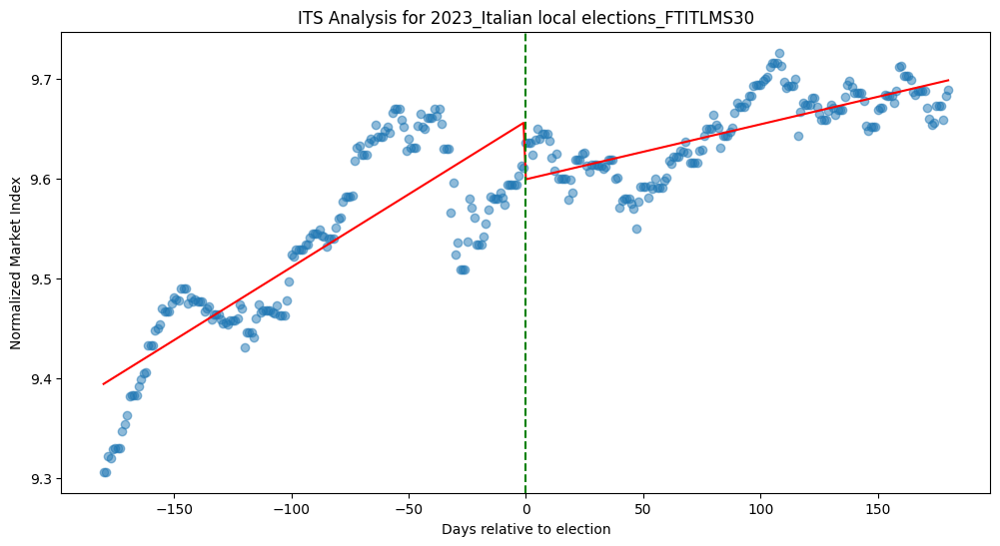


Interrupted Time Series Analysis for 2023_Spanish local elections_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.482
Method:                 Least Squares   F-statistic:                     112.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.37e-51
Time:                        17:31:20   Log-Likelihood:                 556.49
No. Observations:                 361   AIC:                            -1105.
Df Residuals:                     357   BIC:                            -1089.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

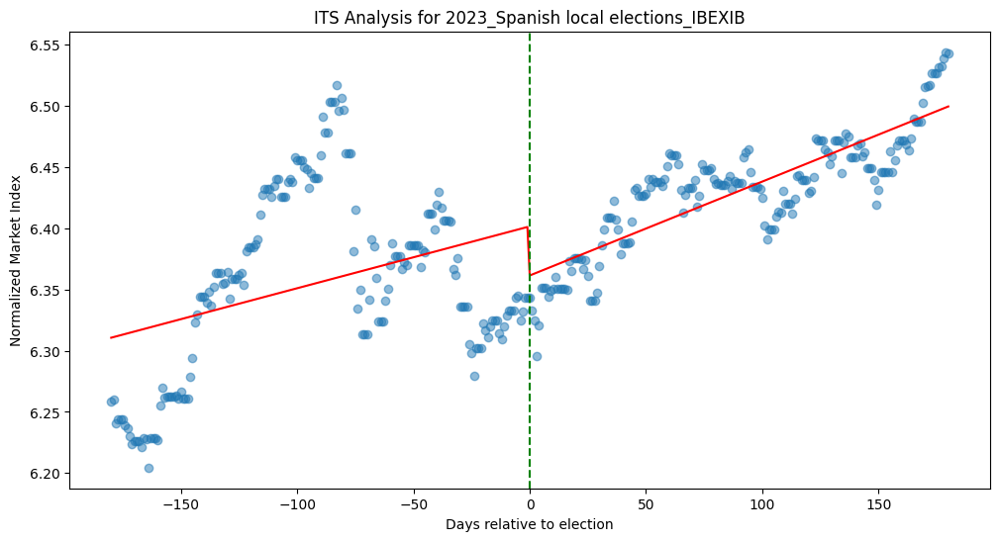


Interrupted Time Series Analysis for 2023_Spanish regional elections_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.482
Method:                 Least Squares   F-statistic:                     112.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.37e-51
Time:                        17:31:21   Log-Likelihood:                 556.49
No. Observations:                 361   AIC:                            -1105.
Df Residuals:                     357   BIC:                            -1089.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

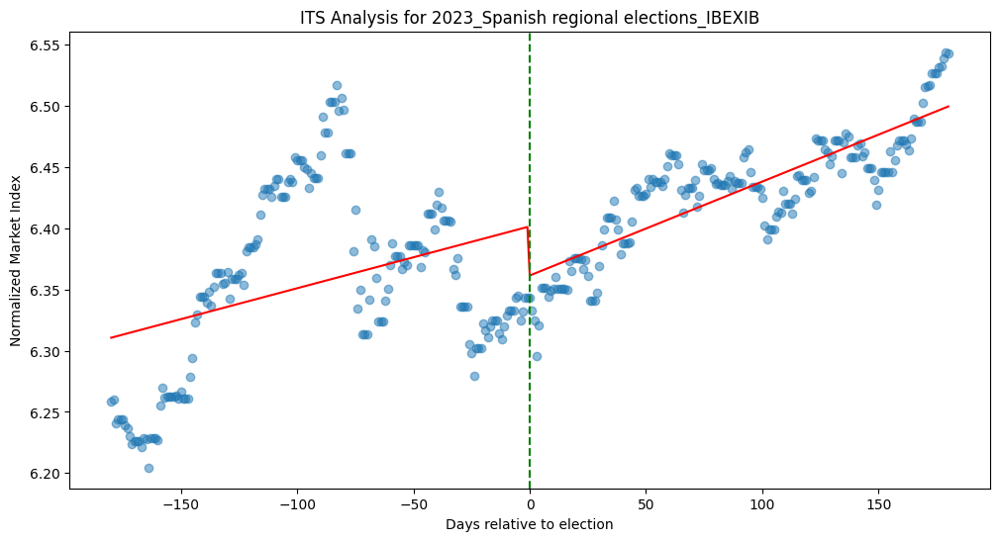


Interrupted Time Series Analysis for 2022_United States elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.280
Model:                            OLS   Adj. R-squared:                  0.274
Method:                 Least Squares   F-statistic:                     46.32
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.62e-25
Time:                        17:31:21   Log-Likelihood:                 638.97
No. Observations:                 361   AIC:                            -1270.
Df Residuals:                     357   BIC:                            -1254.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

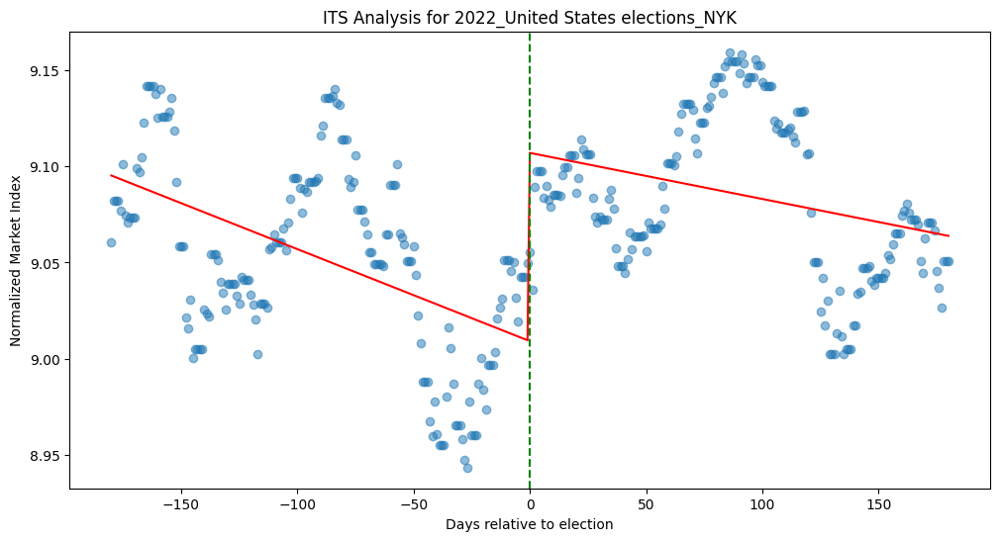


Interrupted Time Series Analysis for 2022_French presidential election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.734
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     328.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.61e-102
Time:                        17:31:21   Log-Likelihood:                 551.09
No. Observations:                 361   AIC:                            -1094.
Df Residuals:                     357   BIC:                            -1079.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

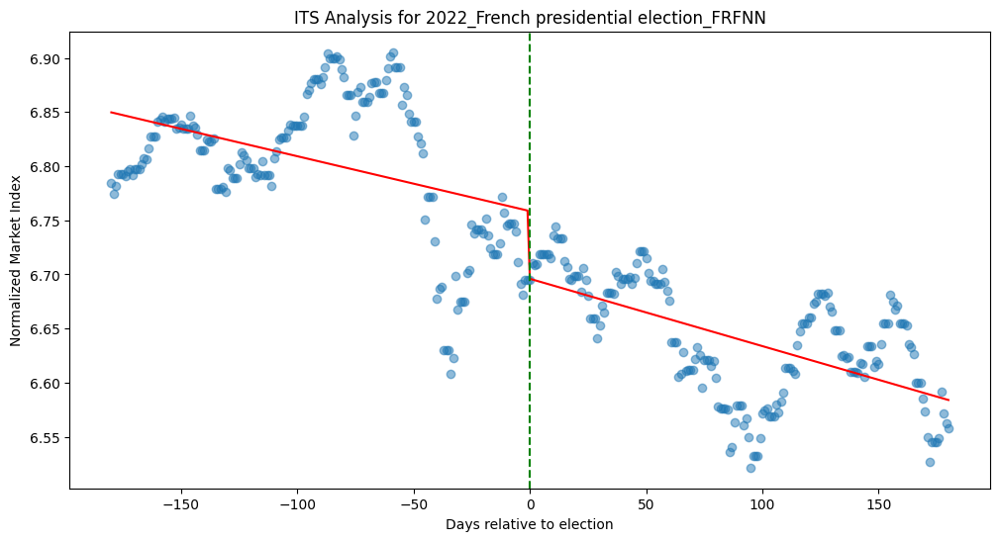


Interrupted Time Series Analysis for 2022_French legislative election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.760
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     376.5
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          3.51e-110
Time:                        17:31:21   Log-Likelihood:                 586.17
No. Observations:                 361   AIC:                            -1164.
Df Residuals:                     357   BIC:                            -1149.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

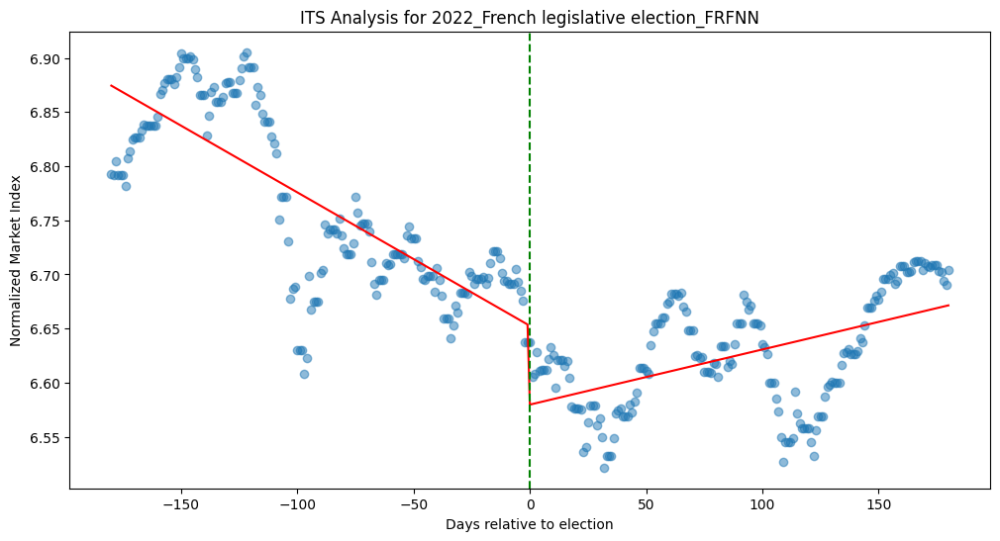


Interrupted Time Series Analysis for 2022_Swedish general election_SX3010GI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.896
Method:                 Least Squares   F-statistic:                     1037.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          7.78e-176
Time:                        17:31:22   Log-Likelihood:                 762.00
No. Observations:                 361   AIC:                            -1516.
Df Residuals:                     357   BIC:                            -1500.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

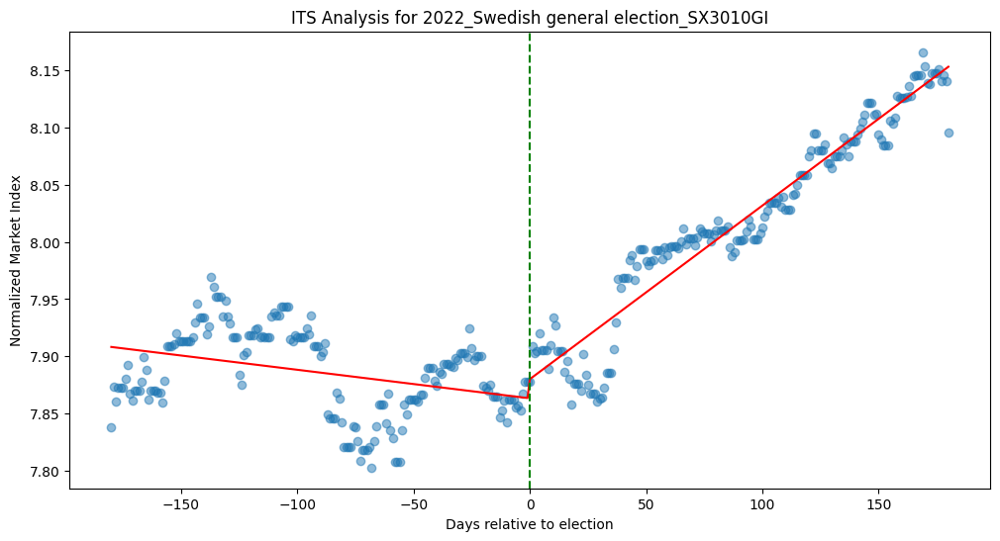


Interrupted Time Series Analysis for 2022_Italian general election_FTITLMS30
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.855
Method:                 Least Squares   F-statistic:                     711.1
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          3.69e-150
Time:                        17:31:22   Log-Likelihood:                 597.07
No. Observations:                 361   AIC:                            -1186.
Df Residuals:                     357   BIC:                            -1171.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

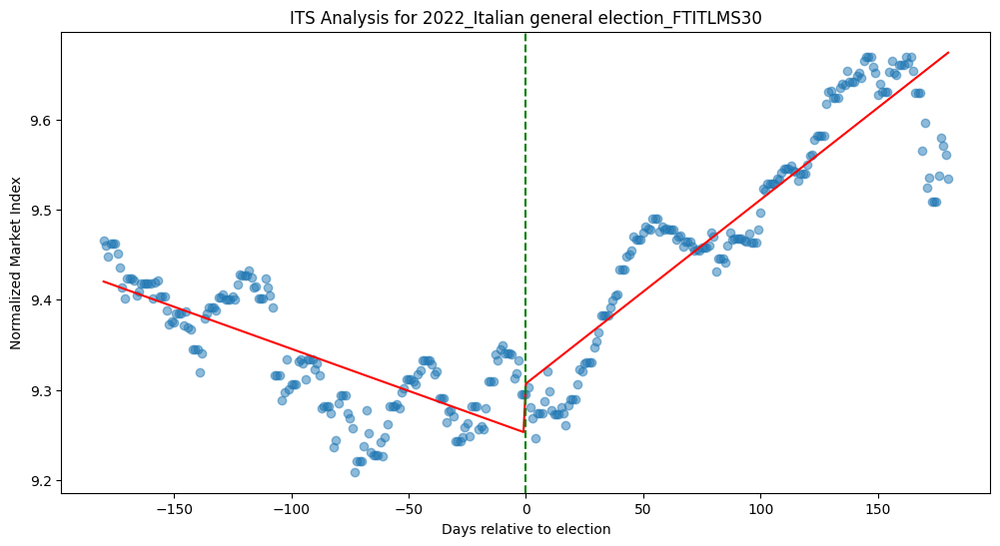


Interrupted Time Series Analysis for 2021_German federal election_CXPVX
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.730
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                     321.1
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          5.18e-101
Time:                        17:31:22   Log-Likelihood:                 836.29
No. Observations:                 361   AIC:                            -1665.
Df Residuals:                     357   BIC:                            -1649.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

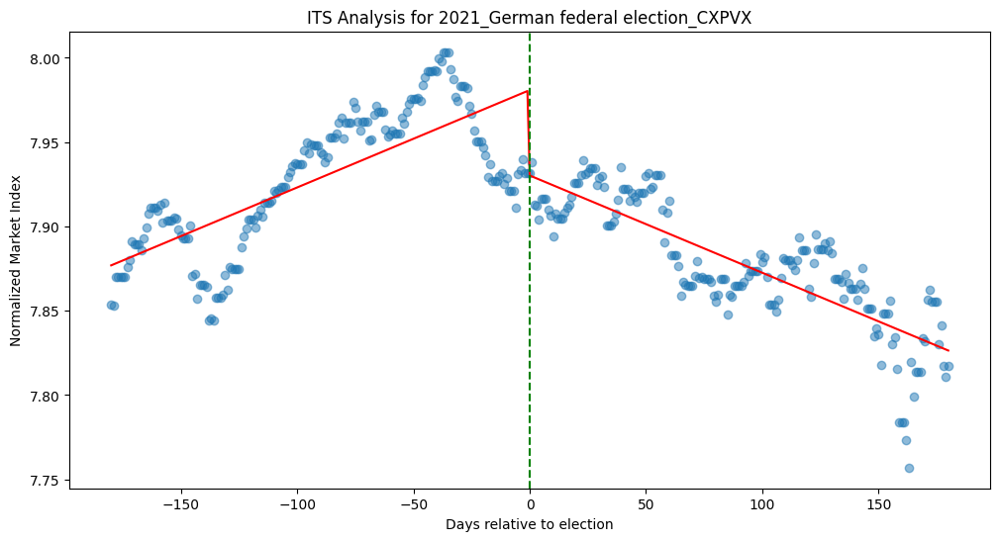


Interrupted Time Series Analysis for 2021_Canadian federal election_TRGSPTS40
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.427
Model:                            OLS   Adj. R-squared:                  0.422
Method:                 Least Squares   F-statistic:                     88.79
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           6.12e-43
Time:                        17:31:23   Log-Likelihood:                 1227.0
No. Observations:                 361   AIC:                            -2446.
Df Residuals:                     357   BIC:                            -2430.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

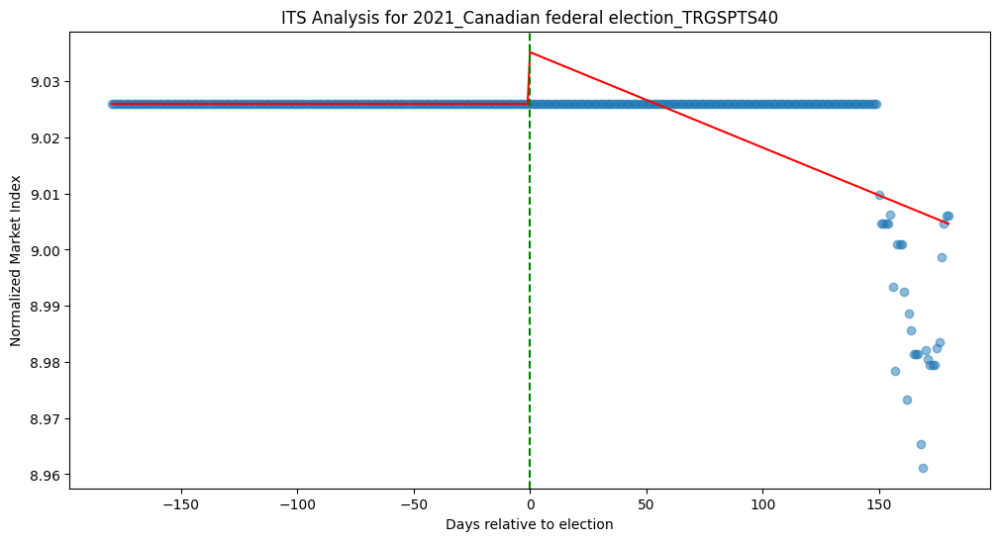


Interrupted Time Series Analysis for 2021_Norwegian parliamentary election_OFING
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     505.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          3.93e-128
Time:                        17:31:23   Log-Likelihood:                 744.19
No. Observations:                 361   AIC:                            -1480.
Df Residuals:                     357   BIC:                            -1465.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

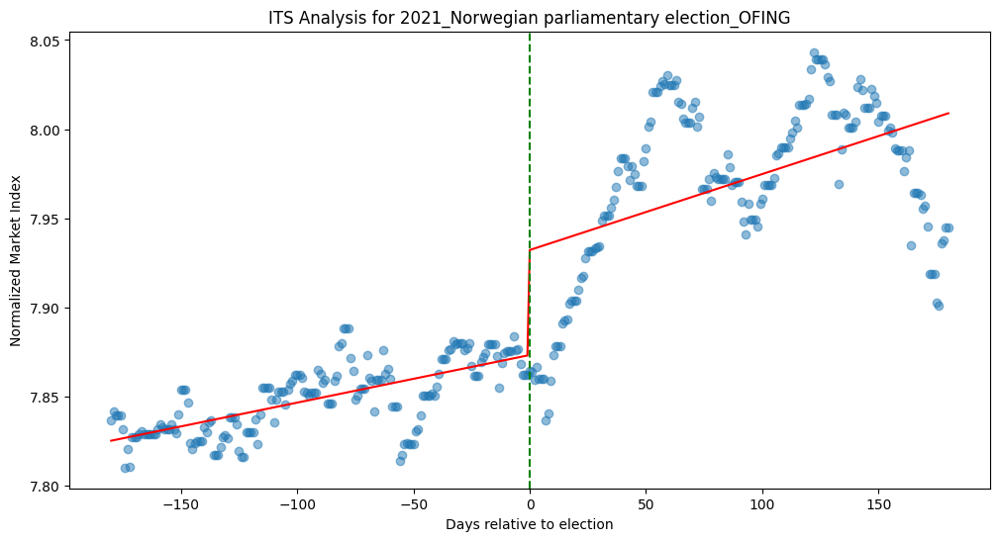


Interrupted Time Series Analysis for 2021_Dutch general election_NLFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.948
Method:                 Least Squares   F-statistic:                     2197.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.12e-229
Time:                        17:31:23   Log-Likelihood:                 732.56
No. Observations:                 361   AIC:                            -1457.
Df Residuals:                     357   BIC:                            -1442.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

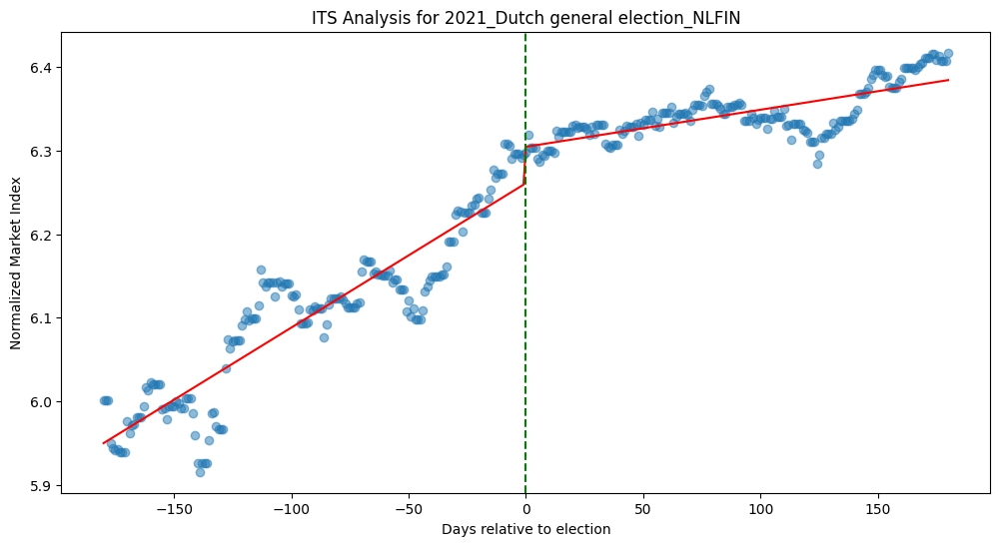


Interrupted Time Series Analysis for 2020_United States presidential election_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     2075.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.67e-225
Time:                        17:31:24   Log-Likelihood:                 749.32
No. Observations:                 361   AIC:                            -1491.
Df Residuals:                     357   BIC:                            -1475.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

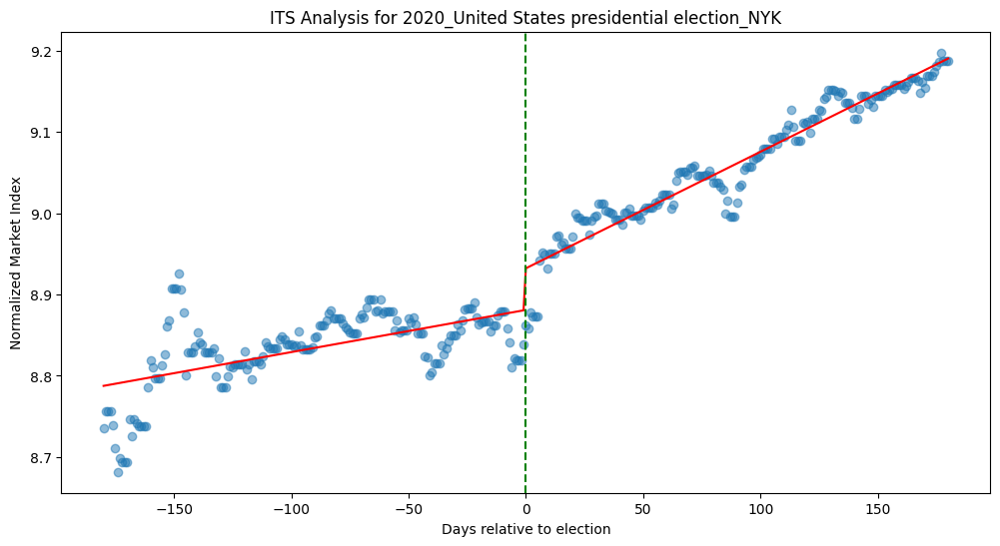


Interrupted Time Series Analysis for 2020_United States Senate elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     2075.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.67e-225
Time:                        17:31:24   Log-Likelihood:                 749.32
No. Observations:                 361   AIC:                            -1491.
Df Residuals:                     357   BIC:                            -1475.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

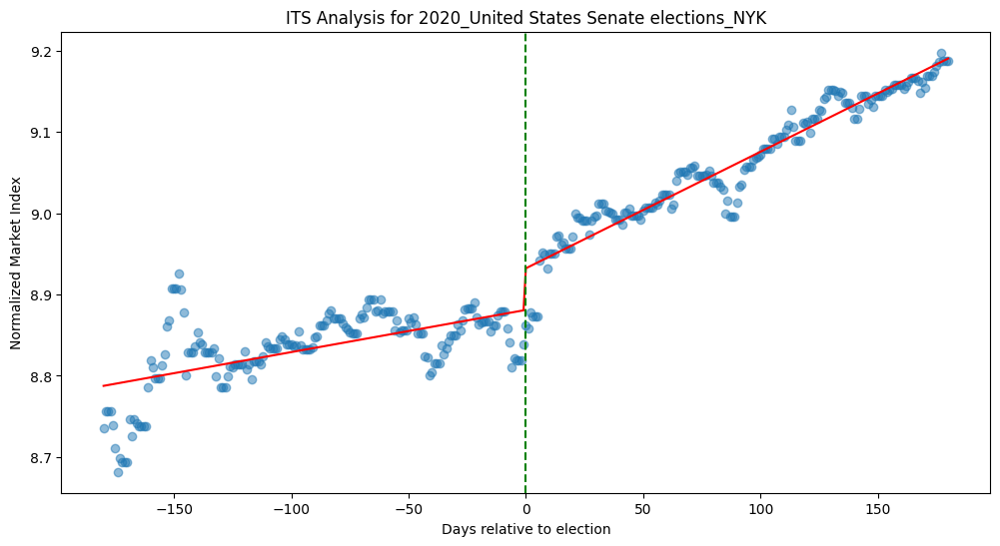


Interrupted Time Series Analysis for 2020_United States House of Representatives elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     2075.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.67e-225
Time:                        17:31:24   Log-Likelihood:                 749.32
No. Observations:                 361   AIC:                            -1491.
Df Residuals:                     357   BIC:                            -1475.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------

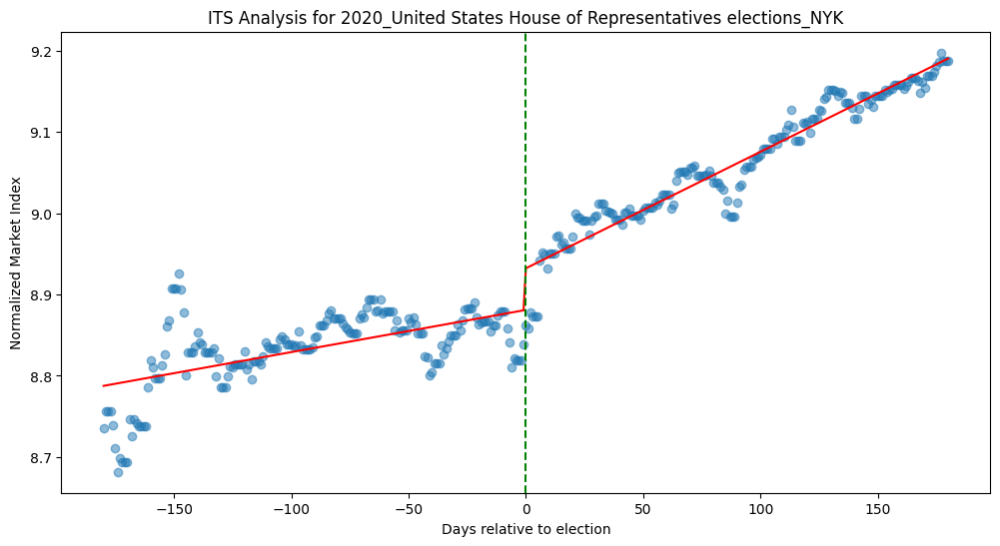


Interrupted Time Series Analysis for 2019_Spanish general election_IBEXIB_x
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.704
Model:                            OLS   Adj. R-squared:                  0.702
Method:                 Least Squares   F-statistic:                     283.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           4.08e-94
Time:                        17:31:24   Log-Likelihood:                 612.13
No. Observations:                 361   AIC:                            -1216.
Df Residuals:                     357   BIC:                            -1201.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

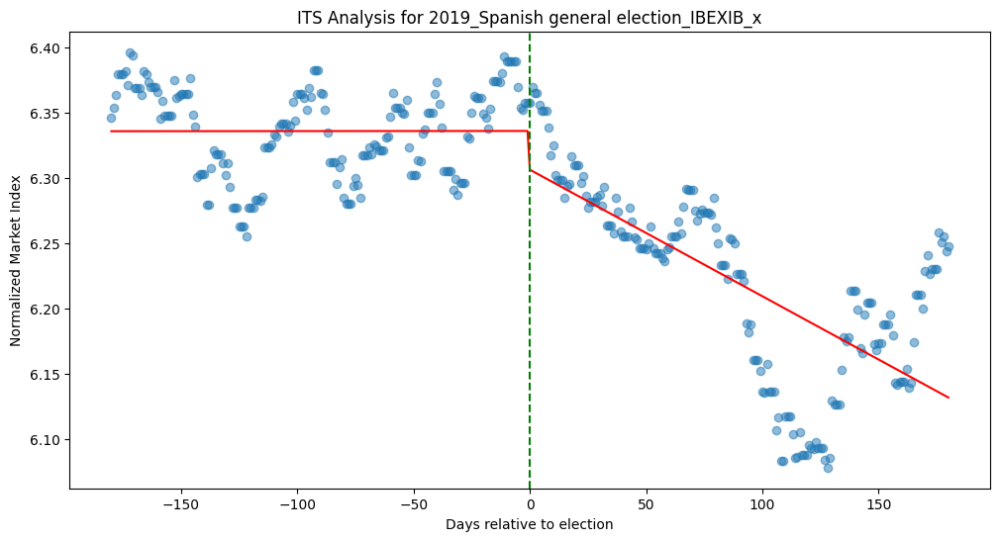


Interrupted Time Series Analysis for 2019_Spanish general election_IBEXIB_y
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.743
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     343.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          7.24e-105
Time:                        17:31:25   Log-Likelihood:                 296.57
No. Observations:                 361   AIC:                            -585.1
Df Residuals:                     357   BIC:                            -569.6
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

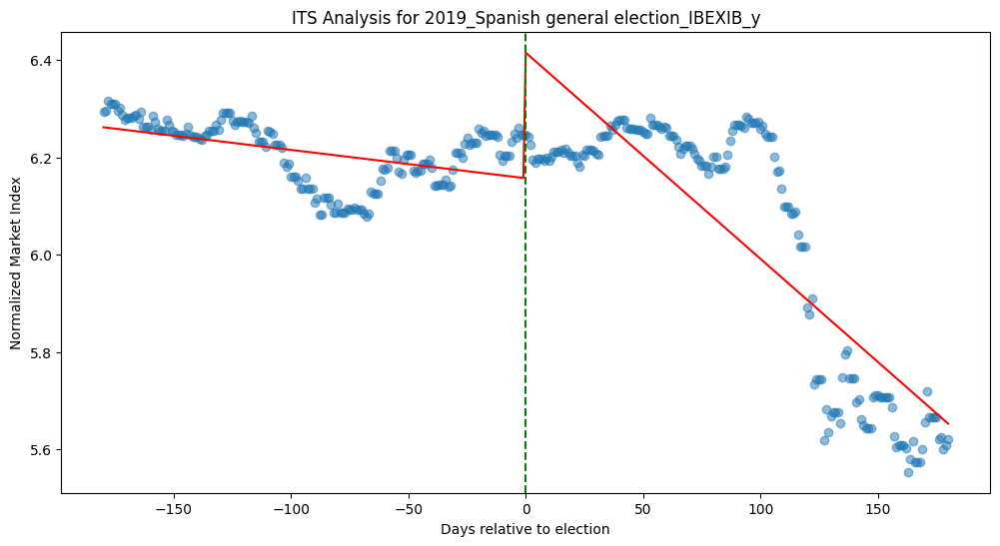


Interrupted Time Series Analysis for 2019_Portuguese legislative election_PTFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.673
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                     245.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.26e-86
Time:                        17:31:25   Log-Likelihood:                 232.33
No. Observations:                 361   AIC:                            -456.7
Df Residuals:                     357   BIC:                            -441.1
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

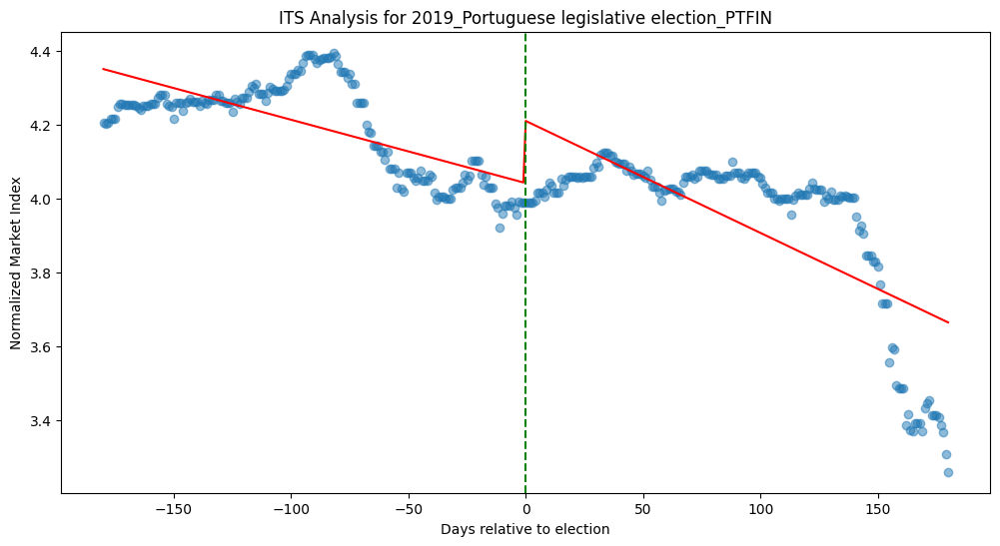


Interrupted Time Series Analysis for 2019_Greek legislative election_FTATBNK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.917
Method:                 Least Squares   F-statistic:                     1326.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.29e-193
Time:                        17:31:25   Log-Likelihood:                 445.16
No. Observations:                 361   AIC:                            -882.3
Df Residuals:                     357   BIC:                            -866.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

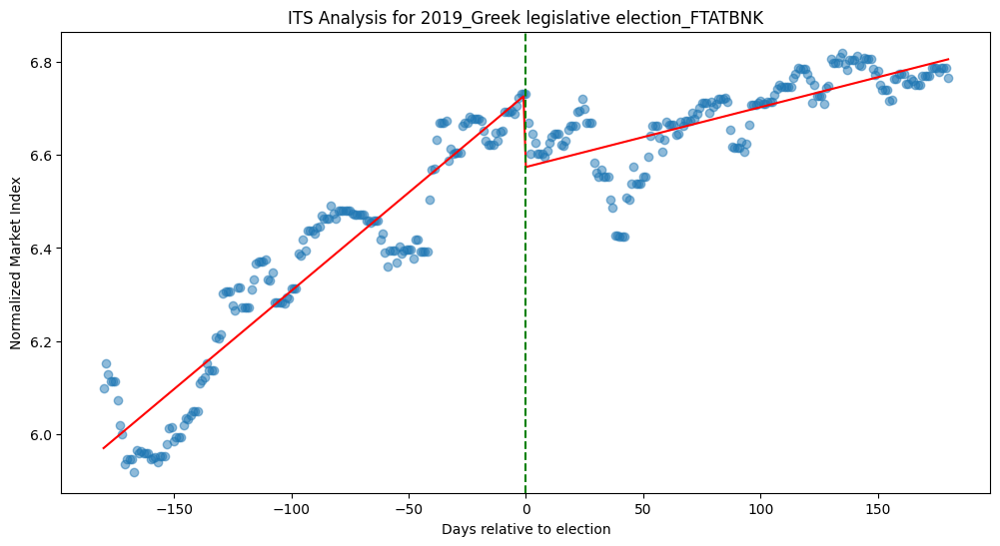


Interrupted Time Series Analysis for 2019_Belgian federal election_BEFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.600
Model:                            OLS   Adj. R-squared:                  0.597
Method:                 Least Squares   F-statistic:                     178.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           9.48e-71
Time:                        17:31:25   Log-Likelihood:                 716.15
No. Observations:                 361   AIC:                            -1424.
Df Residuals:                     357   BIC:                            -1409.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

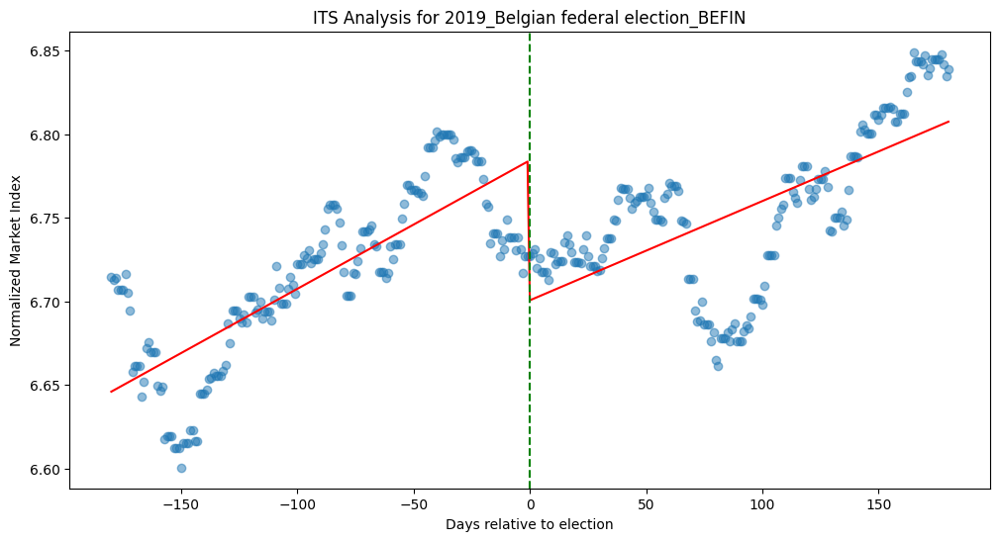


Interrupted Time Series Analysis for 2019_Danish general election_OMXC20
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.784
Method:                 Least Squares   F-statistic:                     436.2
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          5.39e-119
Time:                        17:31:25   Log-Likelihood:                 855.26
No. Observations:                 361   AIC:                            -1703.
Df Residuals:                     357   BIC:                            -1687.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

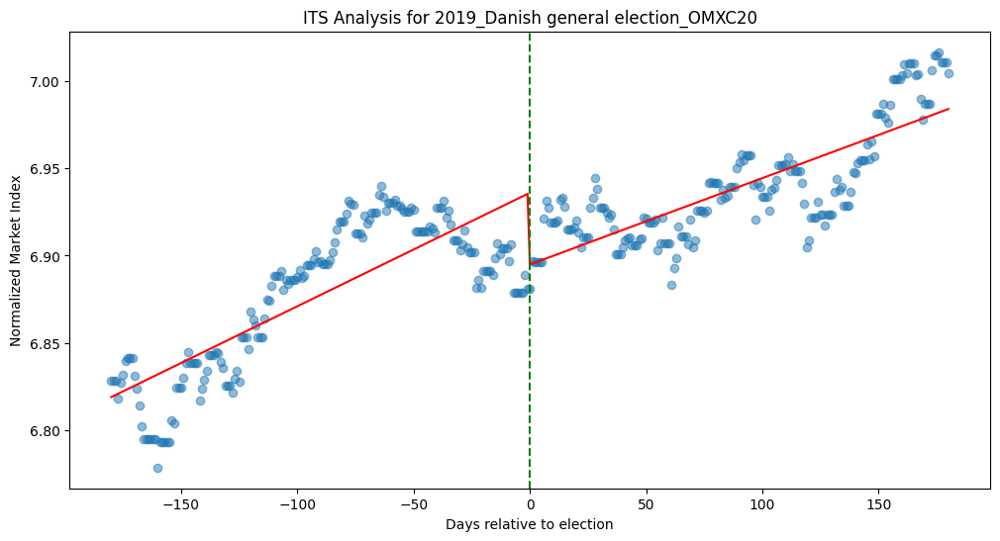


Interrupted Time Series Analysis for 2019_Finnish parliamentary election_N3020PI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.690
Model:                            OLS   Adj. R-squared:                  0.687
Method:                 Least Squares   F-statistic:                     265.0
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           1.94e-90
Time:                        17:31:26   Log-Likelihood:                 801.05
No. Observations:                 361   AIC:                            -1594.
Df Residuals:                     357   BIC:                            -1579.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

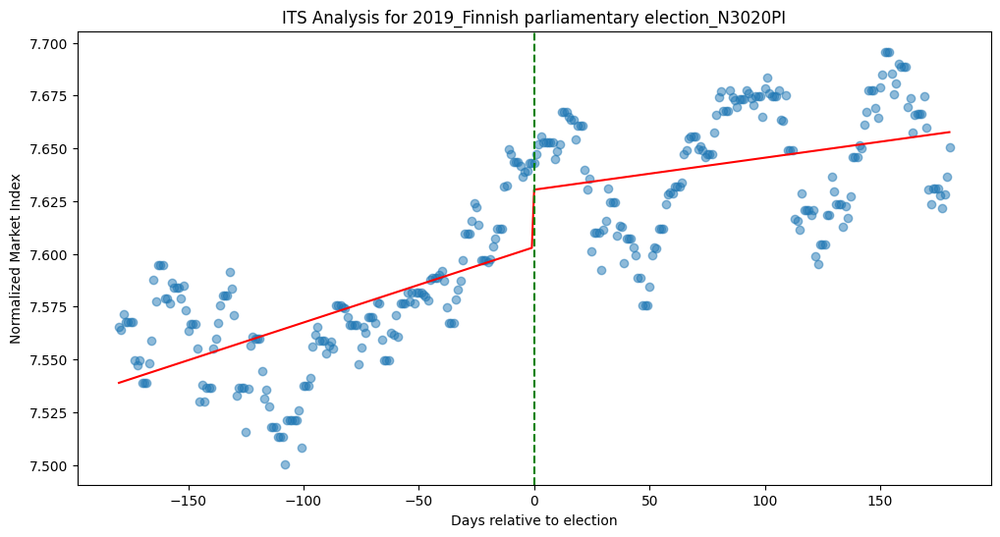


Interrupted Time Series Analysis for 2019_Spanish general election_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.704
Model:                            OLS   Adj. R-squared:                  0.702
Method:                 Least Squares   F-statistic:                     283.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           4.08e-94
Time:                        17:31:26   Log-Likelihood:                 612.13
No. Observations:                 361   AIC:                            -1216.
Df Residuals:                     357   BIC:                            -1201.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

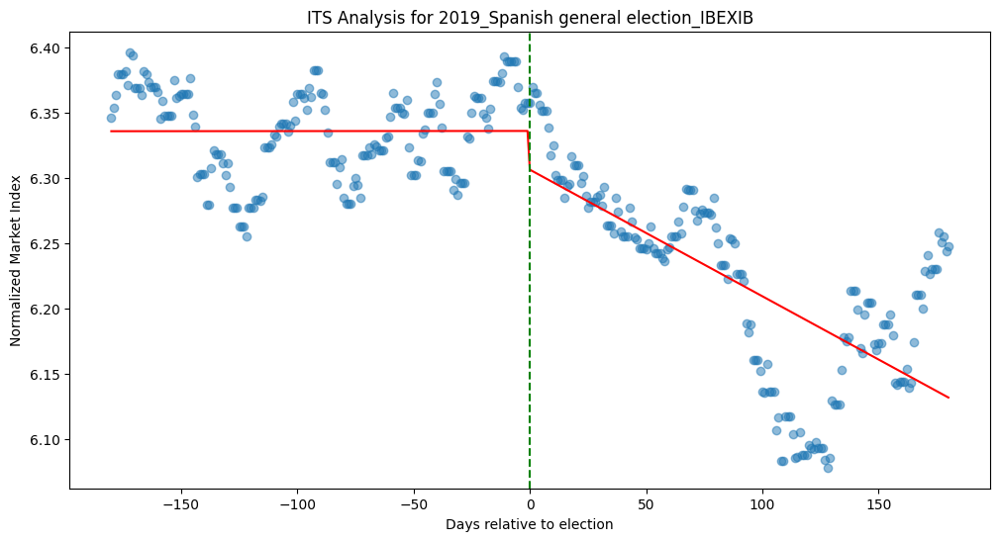


Interrupted Time Series Analysis for 2018_Swedish general election_SX3010GI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.398
Model:                            OLS   Adj. R-squared:                  0.393
Method:                 Least Squares   F-statistic:                     78.61
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           4.63e-39
Time:                        17:31:26   Log-Likelihood:                 700.37
No. Observations:                 361   AIC:                            -1393.
Df Residuals:                     357   BIC:                            -1377.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

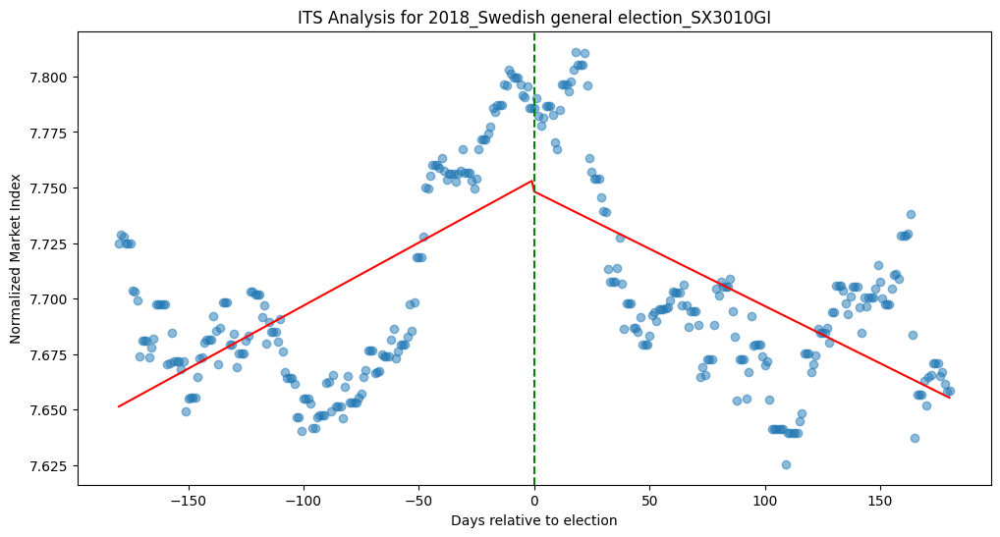


Interrupted Time Series Analysis for 2018_Italian general election_FTITLMS30
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.710
Method:                 Least Squares   F-statistic:                     295.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.49e-96
Time:                        17:31:27   Log-Likelihood:                 668.52
No. Observations:                 361   AIC:                            -1329.
Df Residuals:                     357   BIC:                            -1313.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

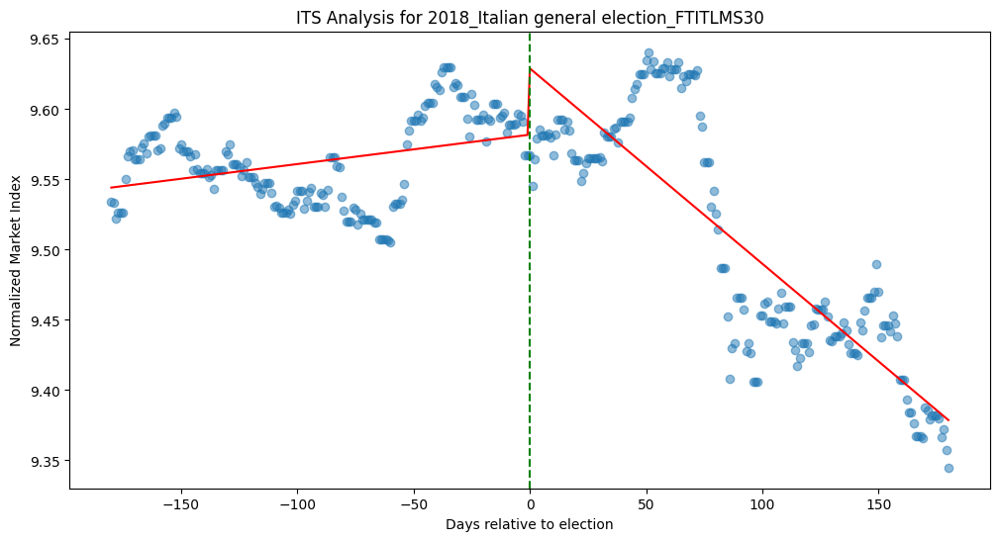


Interrupted Time Series Analysis for 2017_German federal election_CXPVX
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.871
Model:                            OLS   Adj. R-squared:                  0.870
Method:                 Least Squares   F-statistic:                     803.0
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.70e-158
Time:                        17:31:27   Log-Likelihood:                 867.14
No. Observations:                 361   AIC:                            -1726.
Df Residuals:                     357   BIC:                            -1711.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

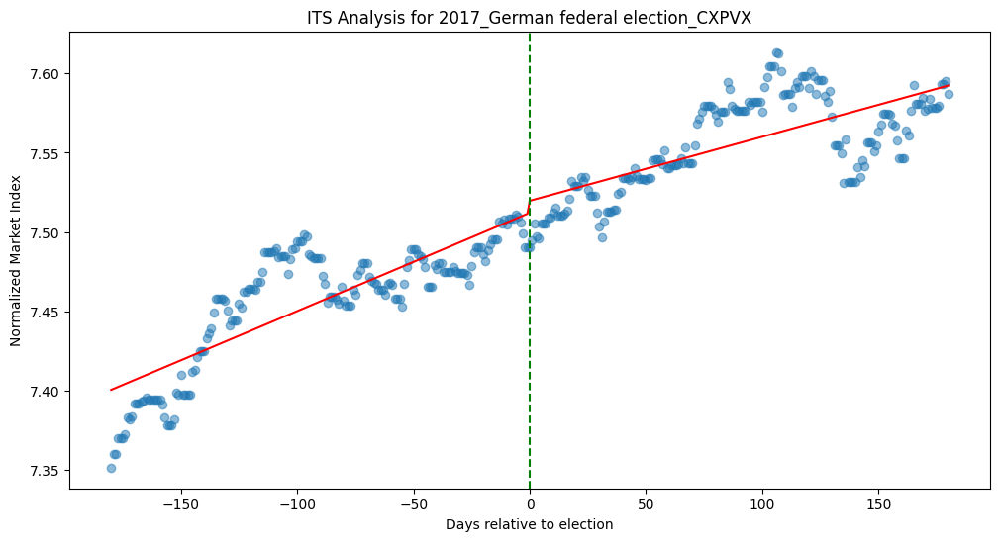


Interrupted Time Series Analysis for 2017_French presidential election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     967.8
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.87e-171
Time:                        17:31:27   Log-Likelihood:                 831.25
No. Observations:                 361   AIC:                            -1654.
Df Residuals:                     357   BIC:                            -1639.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

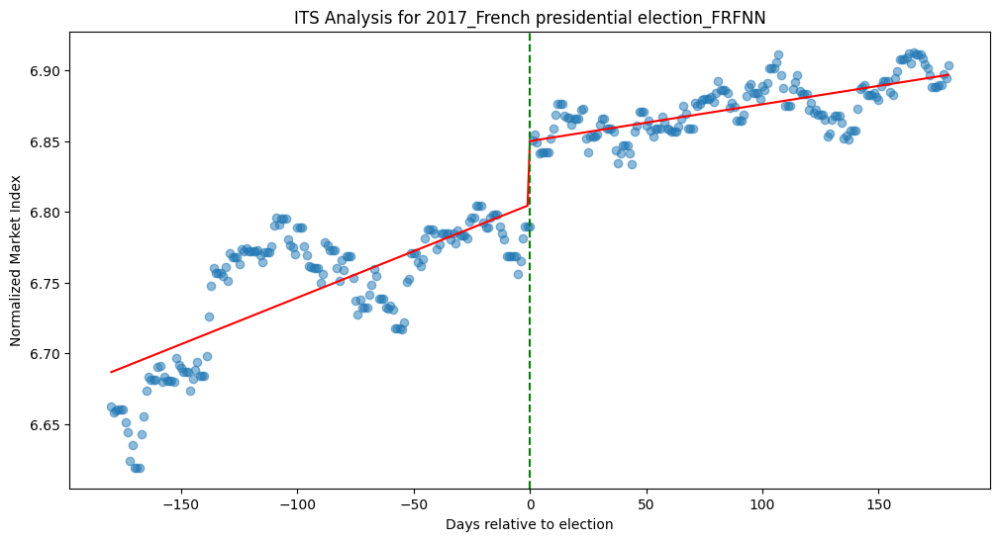


Interrupted Time Series Analysis for 2017_French legislative election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.822
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     550.9
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.53e-133
Time:                        17:31:28   Log-Likelihood:                 849.26
No. Observations:                 361   AIC:                            -1691.
Df Residuals:                     357   BIC:                            -1675.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

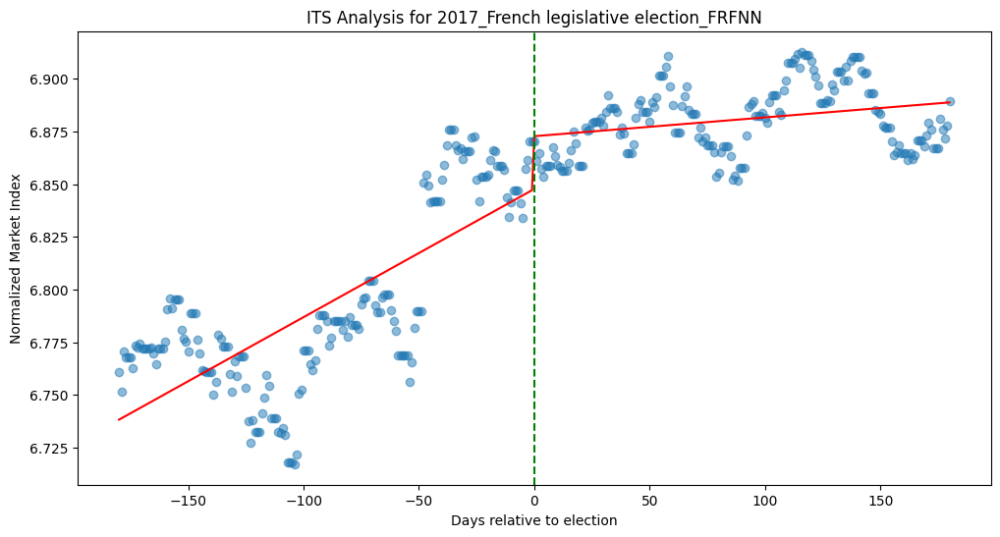


Interrupted Time Series Analysis for 2017_United Kingdom general election_TRINMX302020
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                     1978.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          5.62e-222
Time:                        17:31:28   Log-Likelihood:                 1014.1
No. Observations:                 361   AIC:                            -2020.
Df Residuals:                     357   BIC:                            -2005.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------

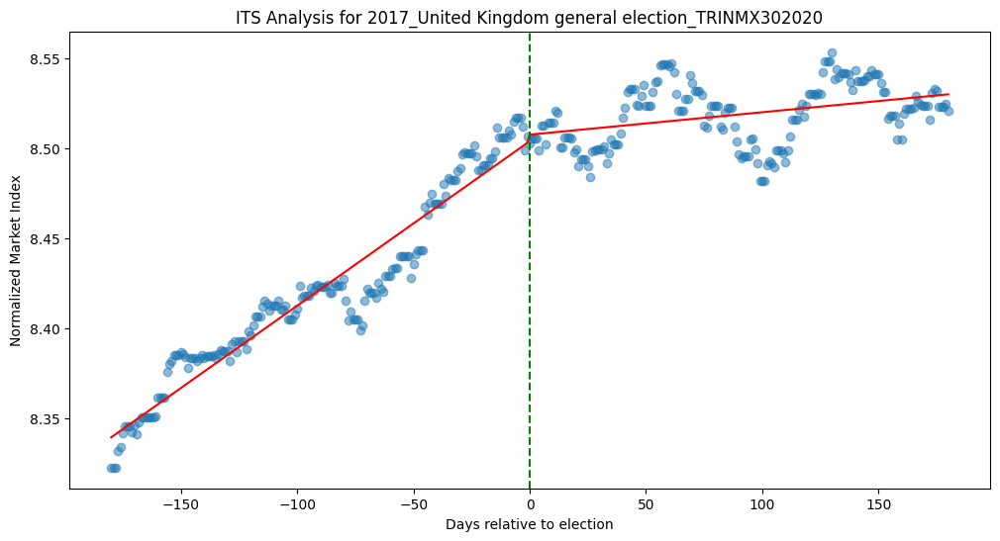


Interrupted Time Series Analysis for 2017_Dutch general election_NLFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.875
Method:                 Least Squares   F-statistic:                     841.8
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.73e-161
Time:                        17:31:29   Log-Likelihood:                 888.97
No. Observations:                 361   AIC:                            -1770.
Df Residuals:                     357   BIC:                            -1754.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

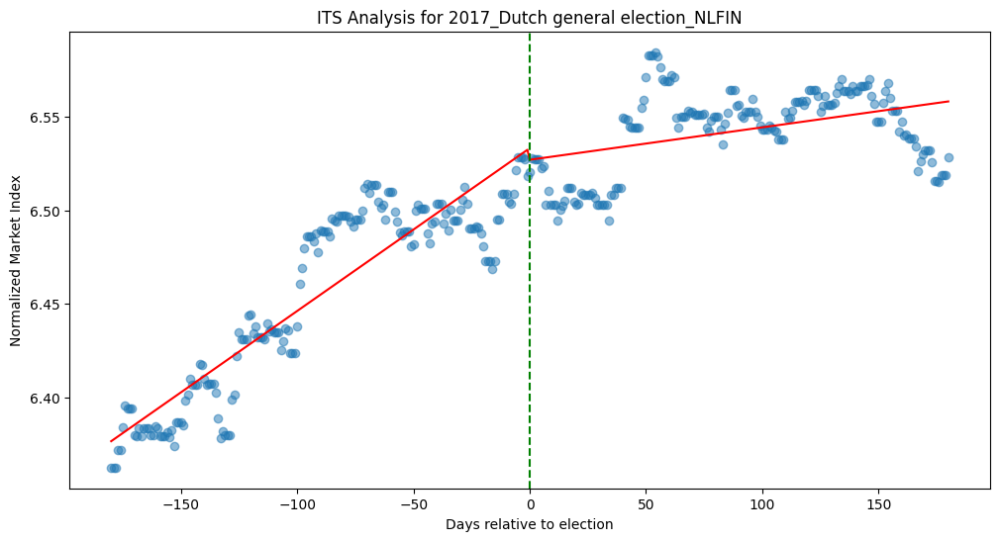


Interrupted Time Series Analysis for 2016_United States presidential election_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     1590.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.13e-206
Time:                        17:31:29   Log-Likelihood:                 894.35
No. Observations:                 361   AIC:                            -1781.
Df Residuals:                     357   BIC:                            -1765.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

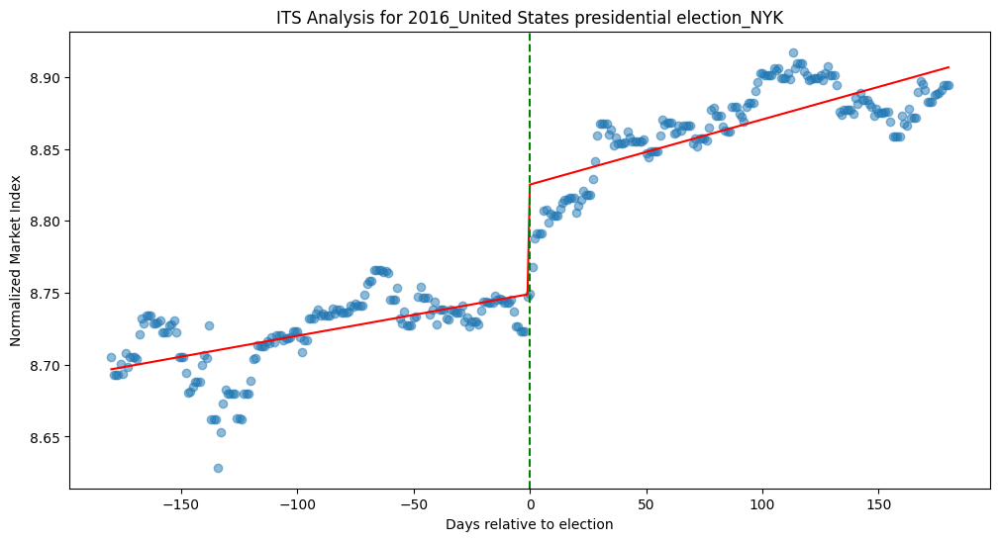


Interrupted Time Series Analysis for 2016_United States Senate elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     1590.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.13e-206
Time:                        17:31:29   Log-Likelihood:                 894.35
No. Observations:                 361   AIC:                            -1781.
Df Residuals:                     357   BIC:                            -1765.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

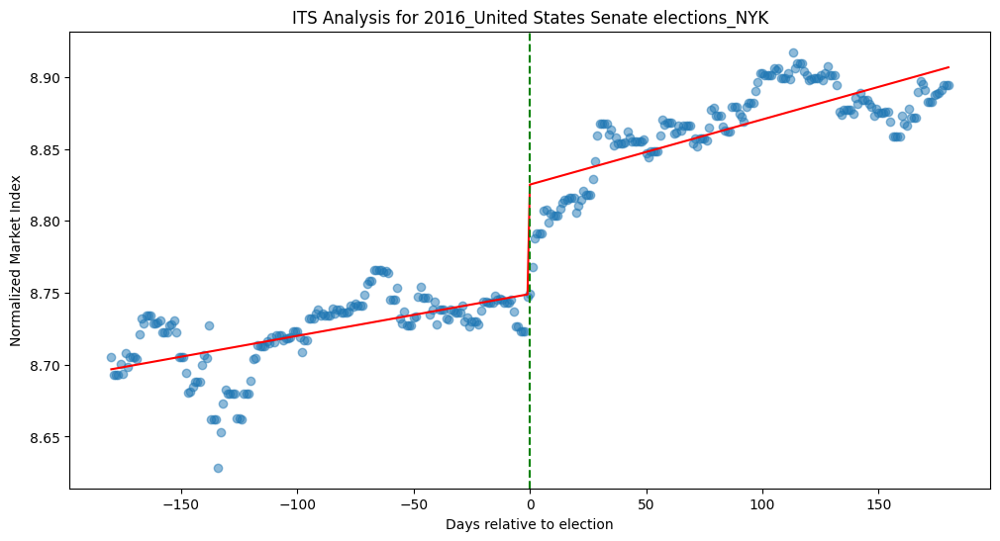


Interrupted Time Series Analysis for 2016_United States House of Representatives elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     1590.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.13e-206
Time:                        17:31:29   Log-Likelihood:                 894.35
No. Observations:                 361   AIC:                            -1781.
Df Residuals:                     357   BIC:                            -1765.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------

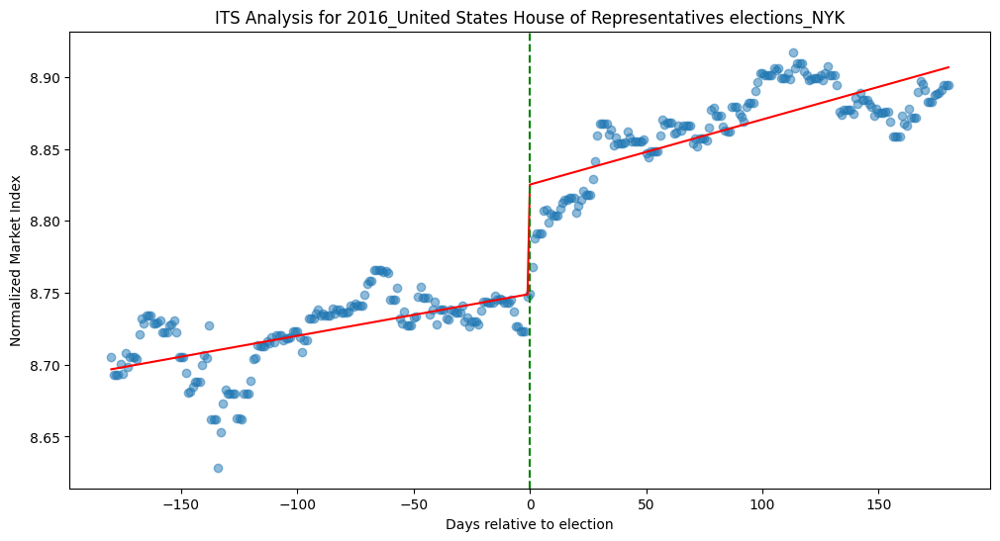


Interrupted Time Series Analysis for 2016_Spanish general election_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.566
Model:                            OLS   Adj. R-squared:                  0.562
Method:                 Least Squares   F-statistic:                     155.0
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.60e-64
Time:                        17:31:30   Log-Likelihood:                 541.56
No. Observations:                 361   AIC:                            -1075.
Df Residuals:                     357   BIC:                            -1060.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

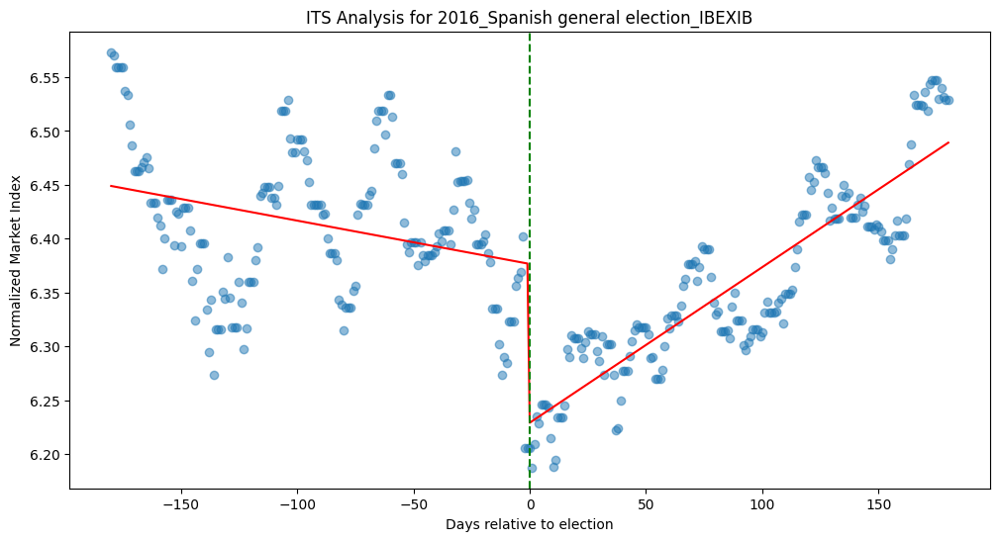


Interrupted Time Series Analysis for 2016_United Kingdom Brexit_TRINMX302020
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.502
Method:                 Least Squares   F-statistic:                     122.0
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.16e-54
Time:                        17:31:30   Log-Likelihood:                 650.64
No. Observations:                 361   AIC:                            -1293.
Df Residuals:                     357   BIC:                            -1278.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

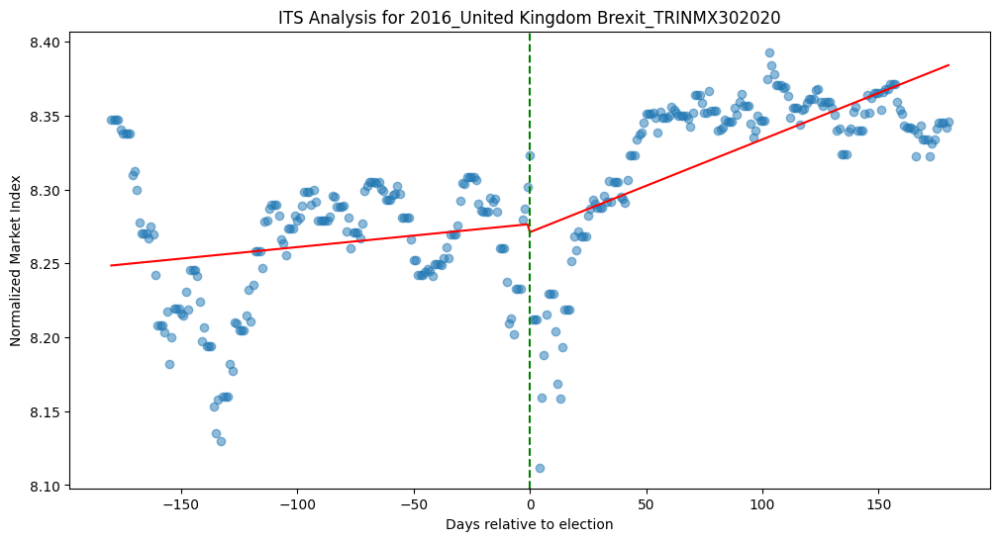


Interrupted Time Series Analysis for 2015_Portuguese legislative election_PTFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     888.4
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          3.69e-165
Time:                        17:31:31   Log-Likelihood:                 450.23
No. Observations:                 361   AIC:                            -892.5
Df Residuals:                     357   BIC:                            -876.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

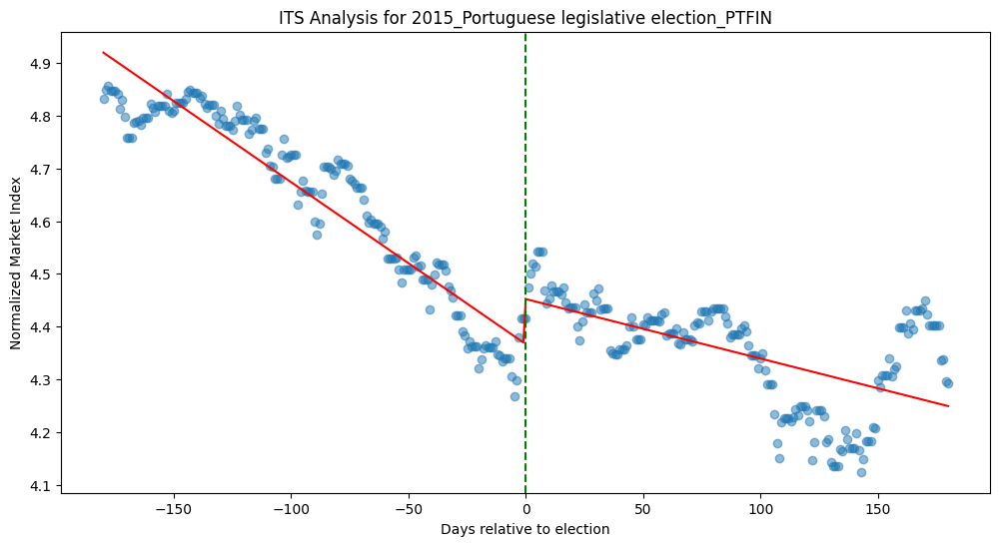


Interrupted Time Series Analysis for 2015_Spanish general election_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.856
Method:                 Least Squares   F-statistic:                     714.2
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.89e-150
Time:                        17:31:31   Log-Likelihood:                 570.77
No. Observations:                 361   AIC:                            -1134.
Df Residuals:                     357   BIC:                            -1118.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

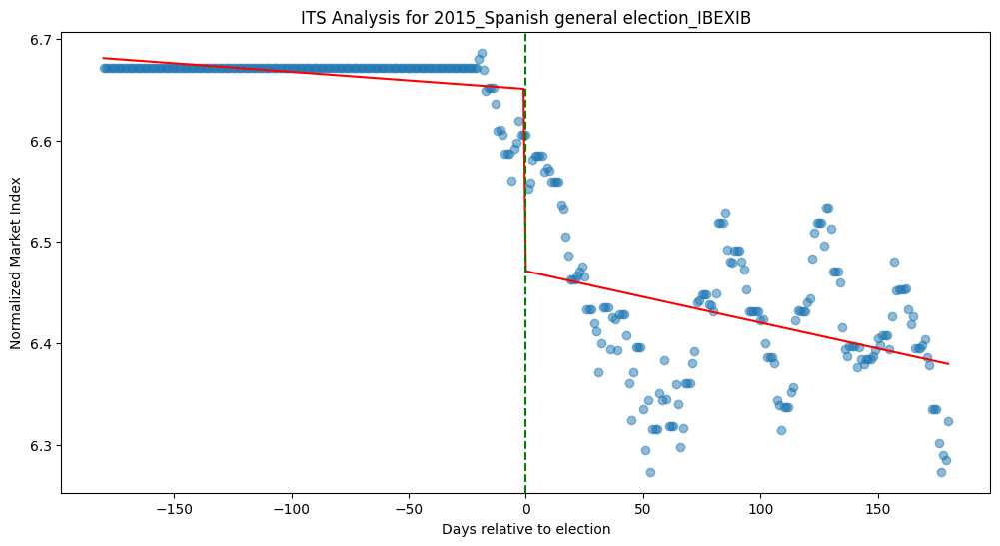


Interrupted Time Series Analysis for 2015_United Kingdom general election_TRINMX302020
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.865
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     765.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.23e-155
Time:                        17:31:31   Log-Likelihood:                 842.00
No. Observations:                 361   AIC:                            -1676.
Df Residuals:                     357   BIC:                            -1660.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------

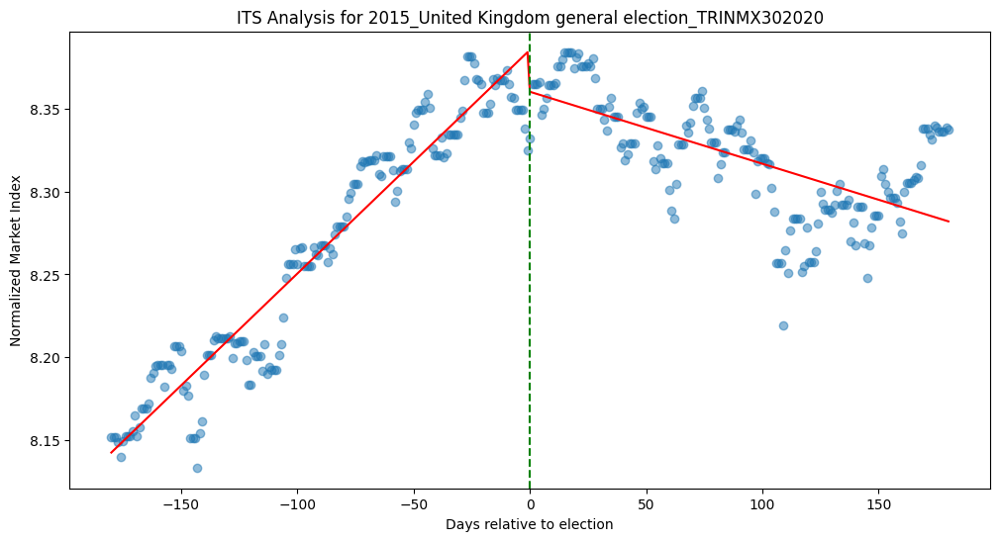


Interrupted Time Series Analysis for 2014_Swedish general election_SX3010GI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     404.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.02e-114
Time:                        17:31:32   Log-Likelihood:                 773.63
No. Observations:                 361   AIC:                            -1539.
Df Residuals:                     357   BIC:                            -1524.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

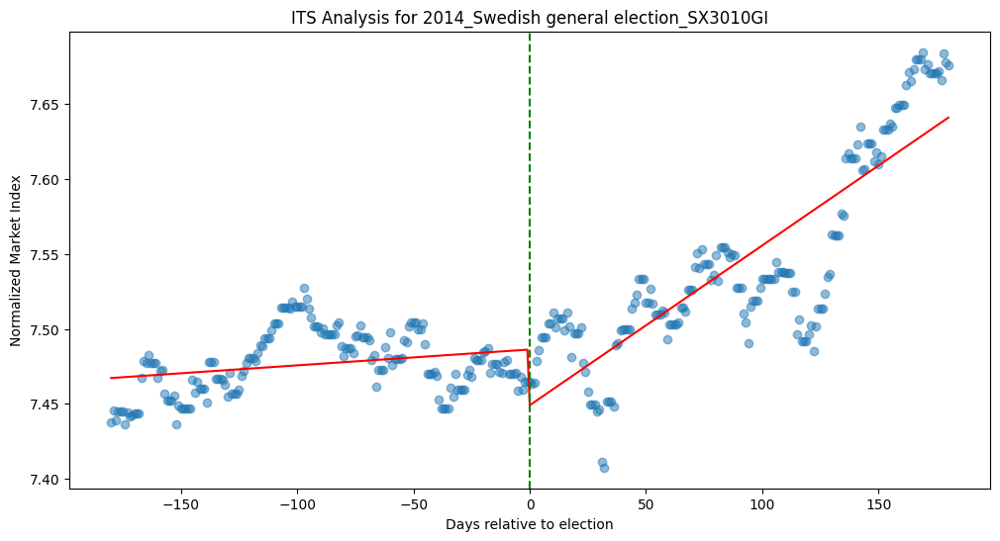


Interrupted Time Series Analysis for 2014_Belgian federal election_BEFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.405
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                     80.89
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           6.00e-40
Time:                        17:31:32   Log-Likelihood:                 799.01
No. Observations:                 361   AIC:                            -1590.
Df Residuals:                     357   BIC:                            -1574.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

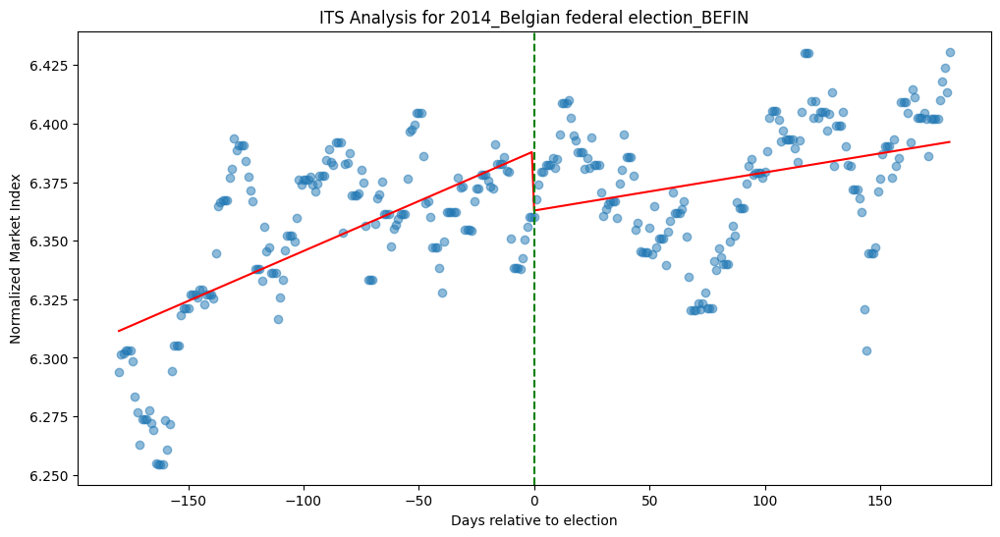


Interrupted Time Series Analysis for 2013_German federal election_CXPVX
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.896
Method:                 Least Squares   F-statistic:                     1034.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.19e-175
Time:                        17:31:33   Log-Likelihood:                 947.25
No. Observations:                 361   AIC:                            -1886.
Df Residuals:                     357   BIC:                            -1871.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

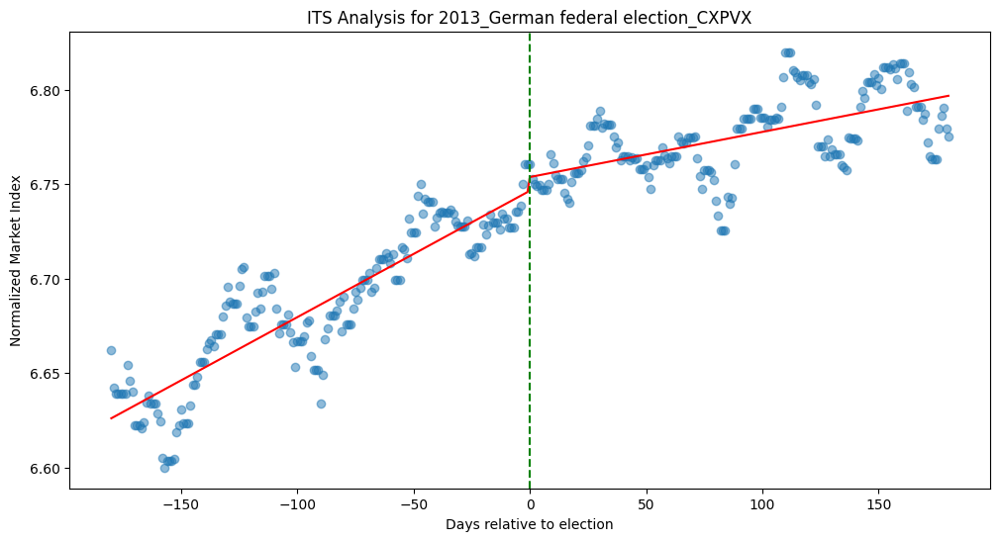


Interrupted Time Series Analysis for 2013_Italian general election_FTITLMS30
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.518
Model:                            OLS   Adj. R-squared:                  0.514
Method:                 Least Squares   F-statistic:                     127.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           3.23e-56
Time:                        17:31:33   Log-Likelihood:                 542.29
No. Observations:                 361   AIC:                            -1077.
Df Residuals:                     357   BIC:                            -1061.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

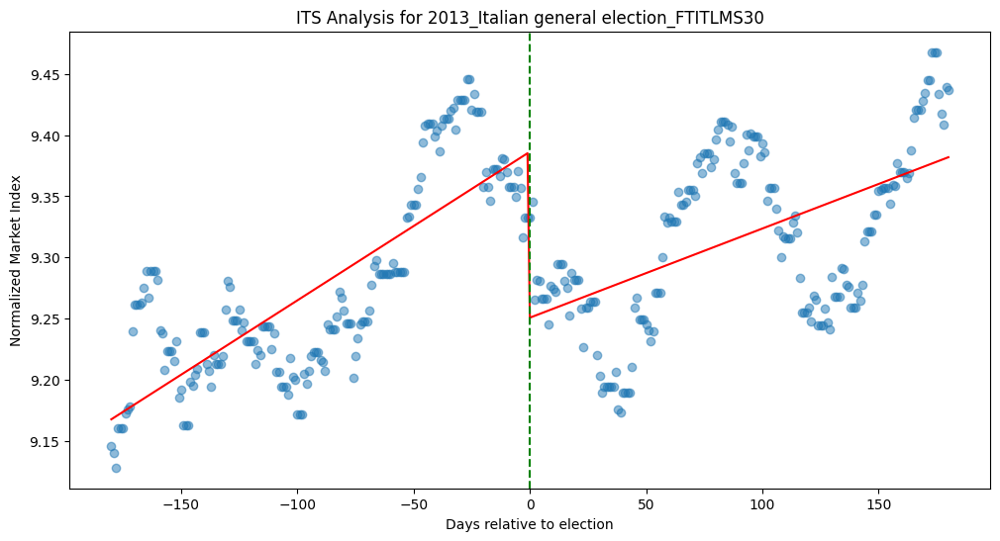


Interrupted Time Series Analysis for 2013_Norwegian parliamentary election_OFING
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.881
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     880.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.57e-164
Time:                        17:31:33   Log-Likelihood:                 767.16
No. Observations:                 361   AIC:                            -1526.
Df Residuals:                     357   BIC:                            -1511.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

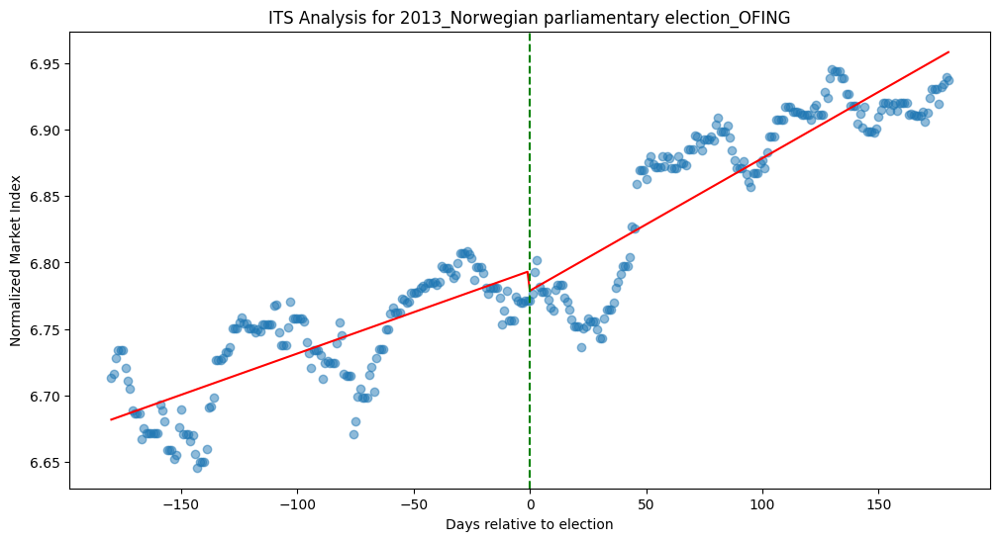


Interrupted Time Series Analysis for 2024_French Senate election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.626
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     199.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           6.48e-76
Time:                        17:31:34   Log-Likelihood:                 874.66
No. Observations:                 361   AIC:                            -1741.
Df Residuals:                     357   BIC:                            -1726.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

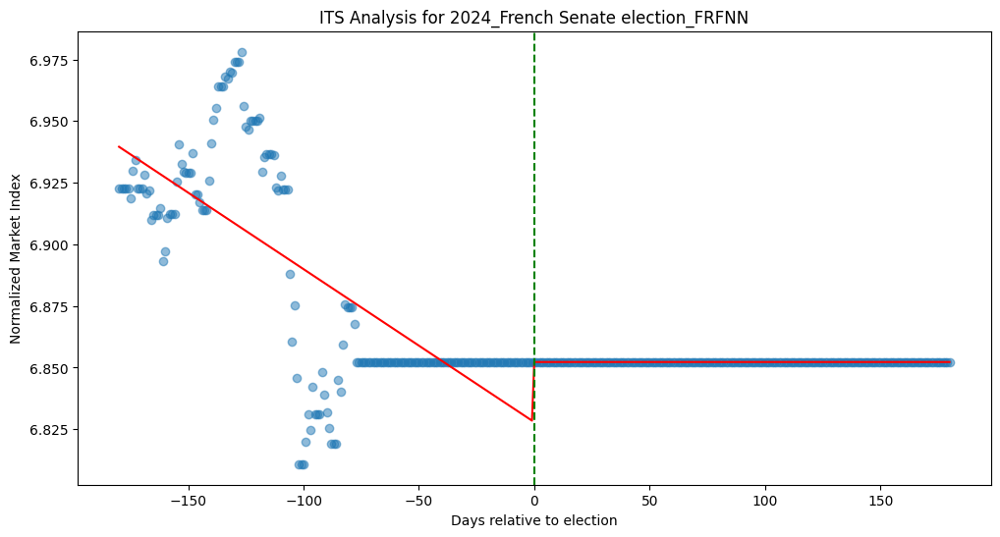


Interrupted Time Series Analysis for 2023_Spanish general election_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.655
Model:                            OLS   Adj. R-squared:                  0.653
Method:                 Least Squares   F-statistic:                     226.4
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           3.08e-82
Time:                        17:31:34   Log-Likelihood:                 659.60
No. Observations:                 361   AIC:                            -1311.
Df Residuals:                     357   BIC:                            -1296.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

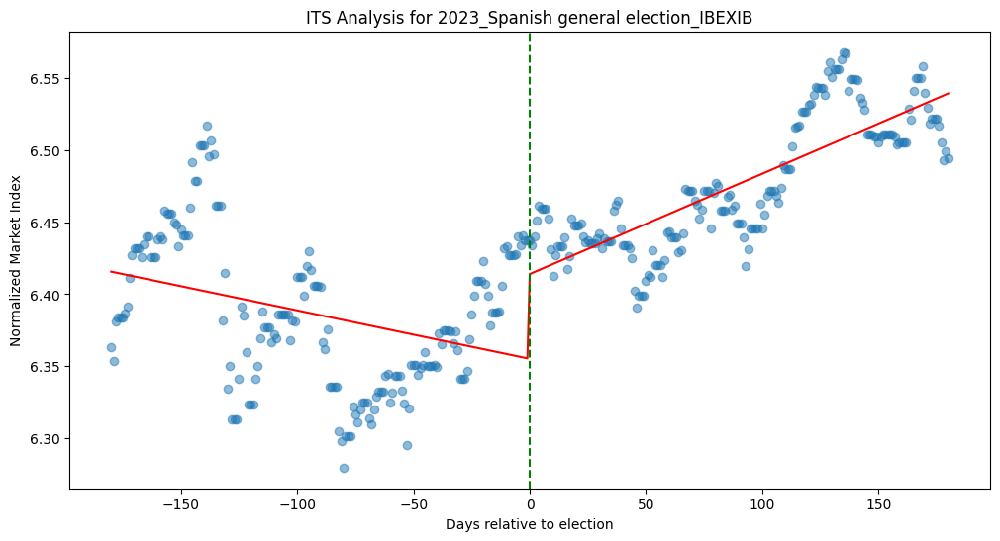


Interrupted Time Series Analysis for 2023_Dutch general election_NLFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.904
Model:                            OLS   Adj. R-squared:                  0.903
Method:                 Least Squares   F-statistic:                     1116.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          6.41e-181
Time:                        17:31:34   Log-Likelihood:                 824.84
No. Observations:                 361   AIC:                            -1642.
Df Residuals:                     357   BIC:                            -1626.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

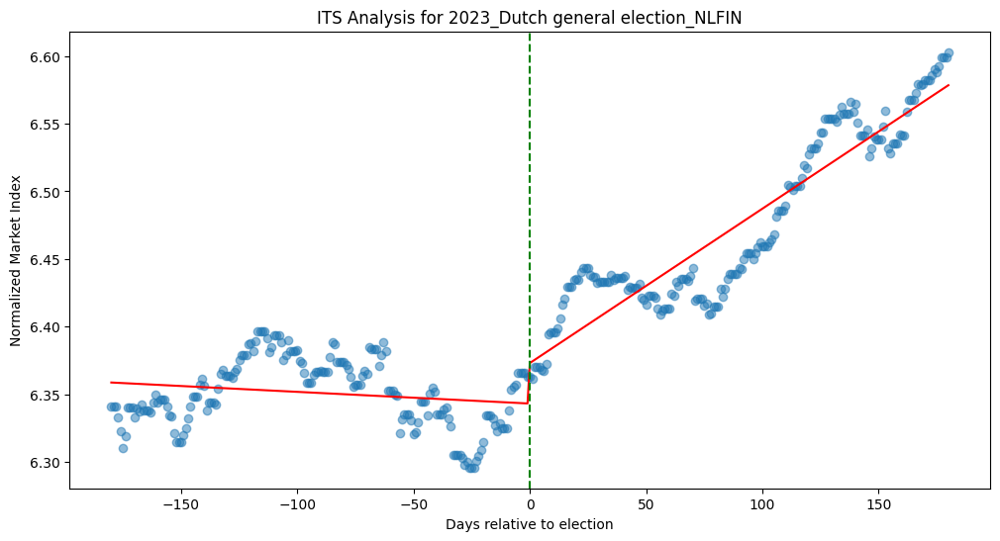


Interrupted Time Series Analysis for 2023_Polish parliamentary election_BNKI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     2088.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          6.25e-226
Time:                        17:31:34   Log-Likelihood:                 582.06
No. Observations:                 361   AIC:                            -1156.
Df Residuals:                     357   BIC:                            -1141.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

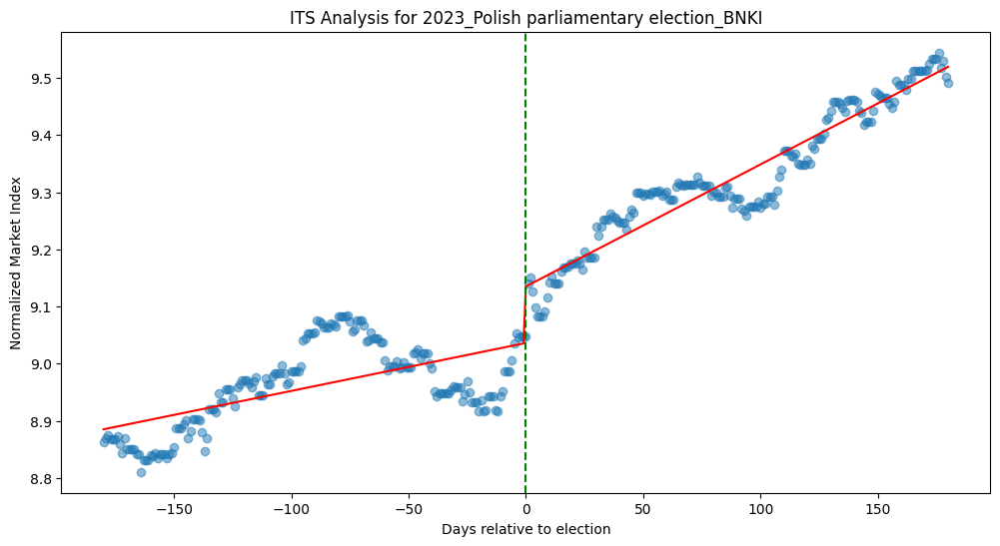


Interrupted Time Series Analysis for 2023_Greek legislative election_FTATBNK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.846
Model:                            OLS   Adj. R-squared:                  0.844
Method:                 Least Squares   F-statistic:                     651.8
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.04e-144
Time:                        17:31:35   Log-Likelihood:                 471.64
No. Observations:                 361   AIC:                            -935.3
Df Residuals:                     357   BIC:                            -919.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

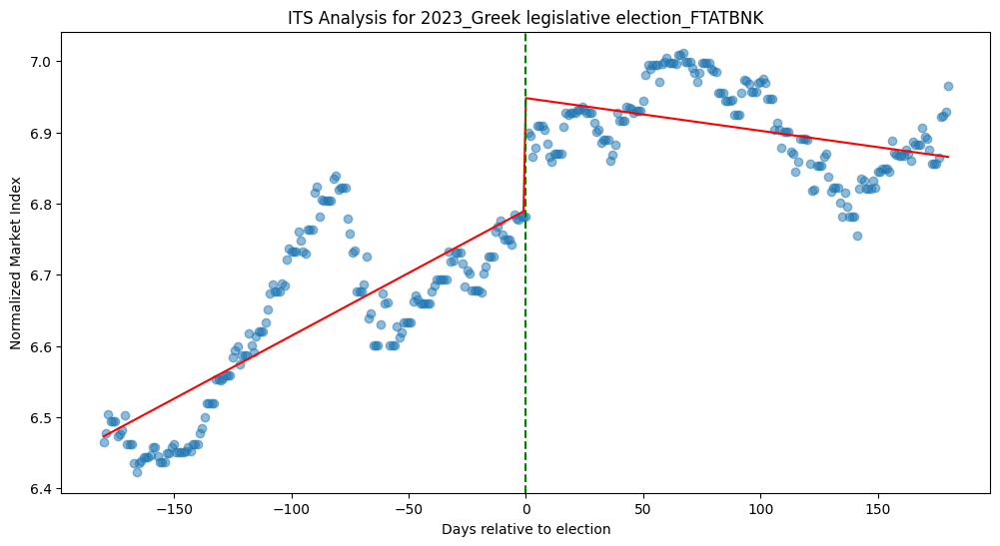


Interrupted Time Series Analysis for 2023_Finnish parliamentary election_N3020PI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.309
Method:                 Least Squares   F-statistic:                     54.54
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           4.83e-29
Time:                        17:31:35   Log-Likelihood:                 645.62
No. Observations:                 361   AIC:                            -1283.
Df Residuals:                     357   BIC:                            -1268.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

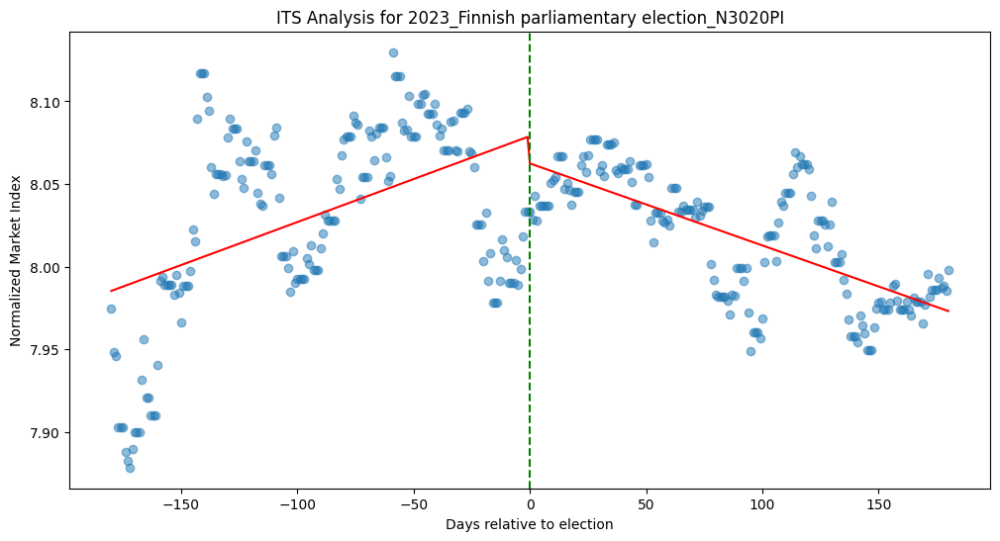


Interrupted Time Series Analysis for 2023_Italian local elections_FTITLMS30
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.809
Method:                 Least Squares   F-statistic:                     507.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.25e-128
Time:                        17:31:35   Log-Likelihood:                 642.71
No. Observations:                 361   AIC:                            -1277.
Df Residuals:                     357   BIC:                            -1262.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

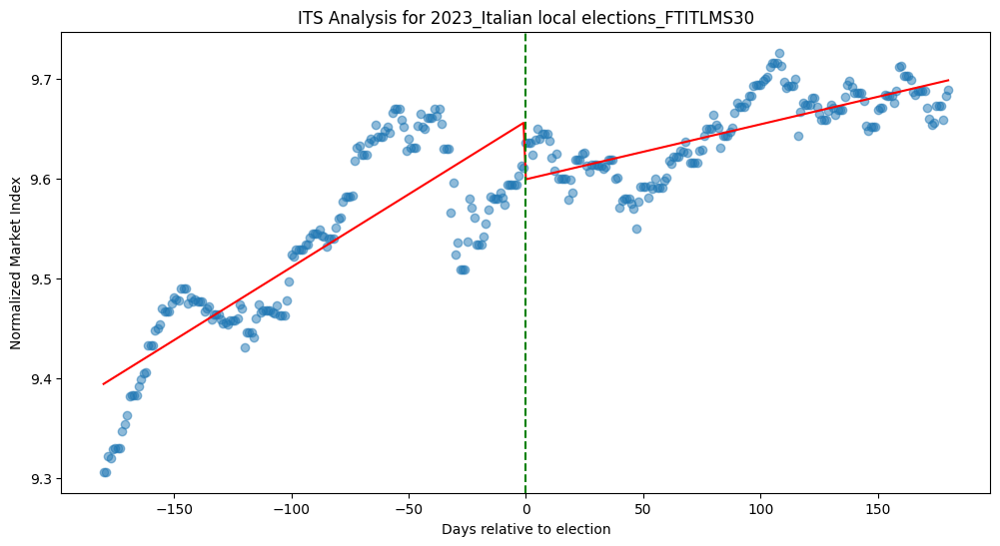


Interrupted Time Series Analysis for 2023_Spanish local elections_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.482
Method:                 Least Squares   F-statistic:                     112.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.37e-51
Time:                        17:31:35   Log-Likelihood:                 556.49
No. Observations:                 361   AIC:                            -1105.
Df Residuals:                     357   BIC:                            -1089.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

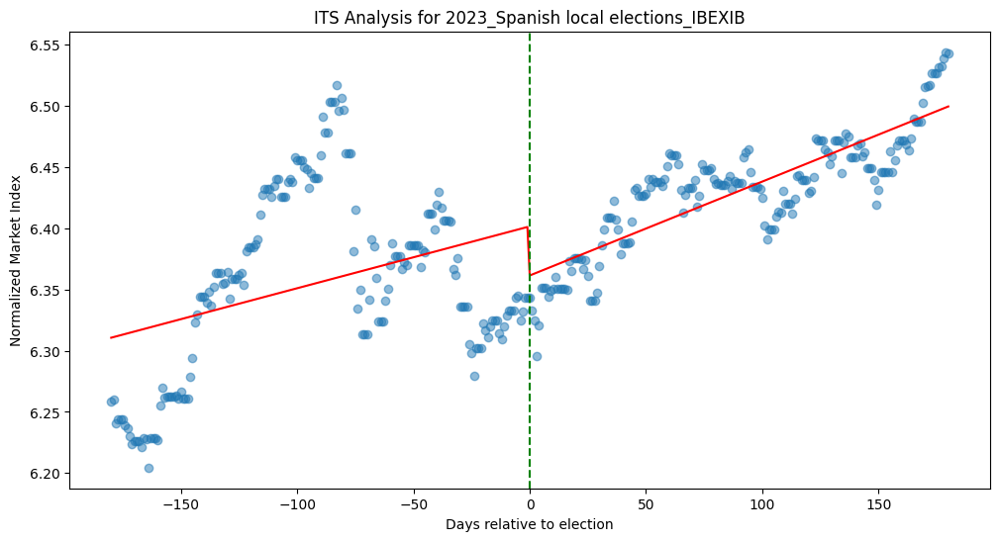


Interrupted Time Series Analysis for 2023_Spanish regional elections_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.482
Method:                 Least Squares   F-statistic:                     112.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.37e-51
Time:                        17:31:36   Log-Likelihood:                 556.49
No. Observations:                 361   AIC:                            -1105.
Df Residuals:                     357   BIC:                            -1089.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

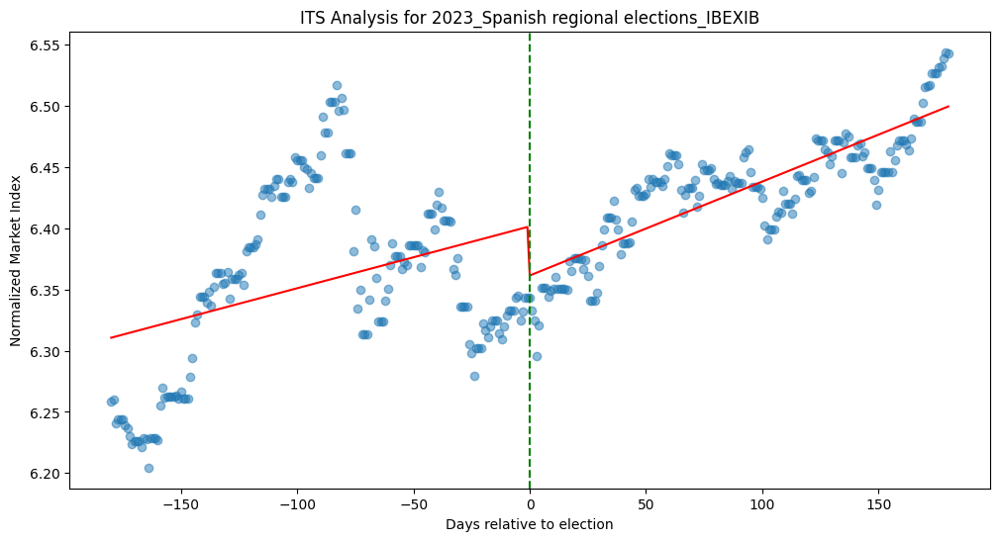


Interrupted Time Series Analysis for 2022_United States elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.280
Model:                            OLS   Adj. R-squared:                  0.274
Method:                 Least Squares   F-statistic:                     46.32
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.62e-25
Time:                        17:31:36   Log-Likelihood:                 638.97
No. Observations:                 361   AIC:                            -1270.
Df Residuals:                     357   BIC:                            -1254.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

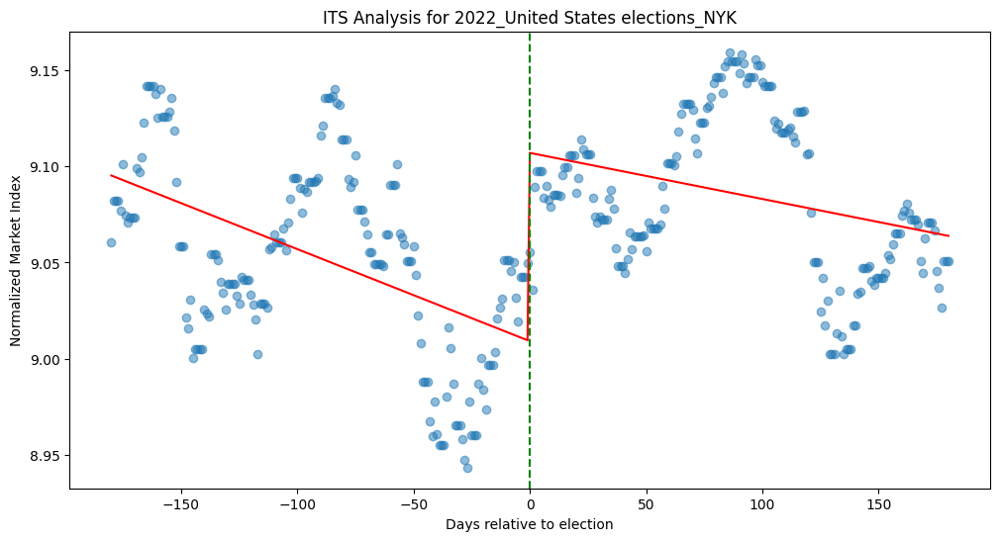


Interrupted Time Series Analysis for 2022_French presidential election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.734
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     328.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.61e-102
Time:                        17:31:36   Log-Likelihood:                 551.09
No. Observations:                 361   AIC:                            -1094.
Df Residuals:                     357   BIC:                            -1079.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

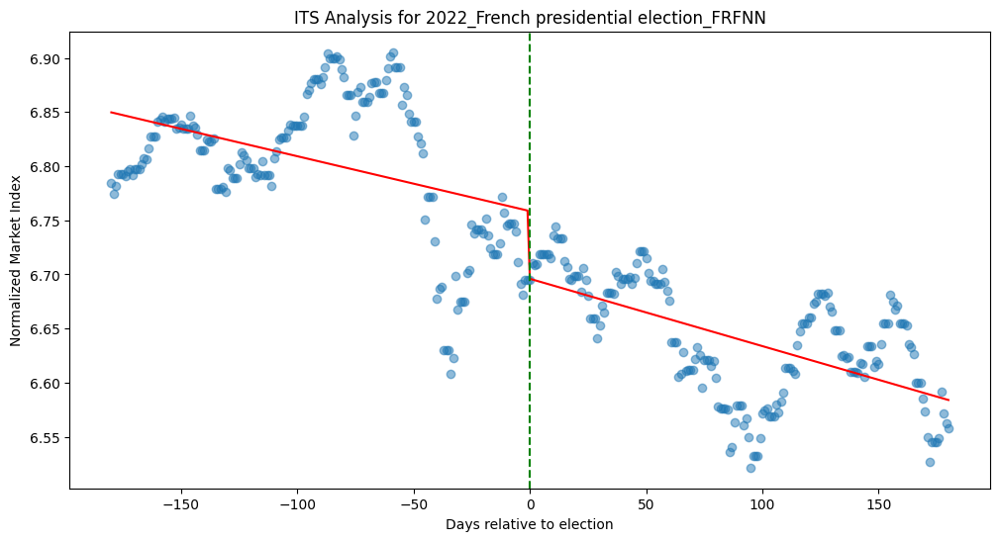


Interrupted Time Series Analysis for 2022_French legislative election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.760
Model:                            OLS   Adj. R-squared:                  0.758
Method:                 Least Squares   F-statistic:                     376.5
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          3.51e-110
Time:                        17:31:37   Log-Likelihood:                 586.17
No. Observations:                 361   AIC:                            -1164.
Df Residuals:                     357   BIC:                            -1149.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

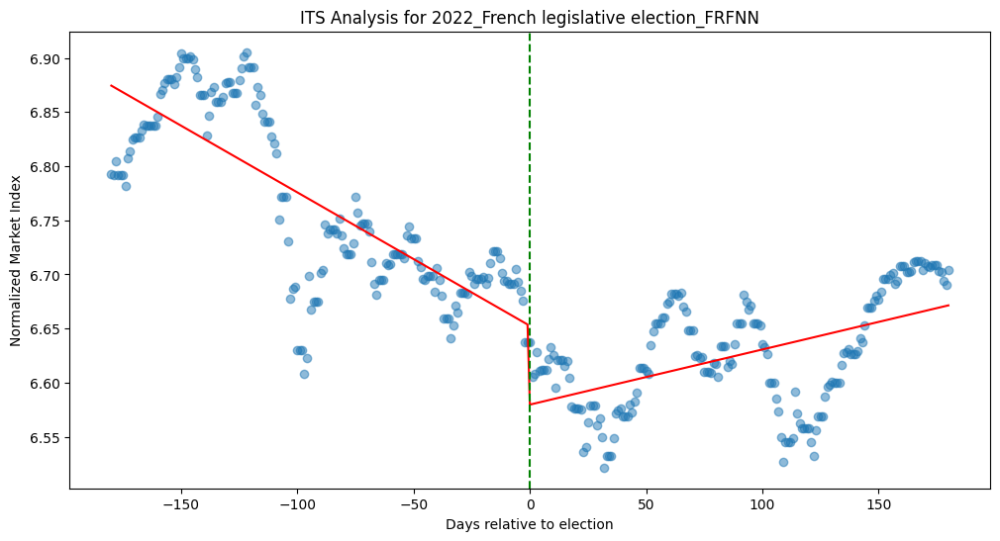


Interrupted Time Series Analysis for 2022_Swedish general election_SX3010GI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.896
Method:                 Least Squares   F-statistic:                     1037.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          7.78e-176
Time:                        17:31:37   Log-Likelihood:                 762.00
No. Observations:                 361   AIC:                            -1516.
Df Residuals:                     357   BIC:                            -1500.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

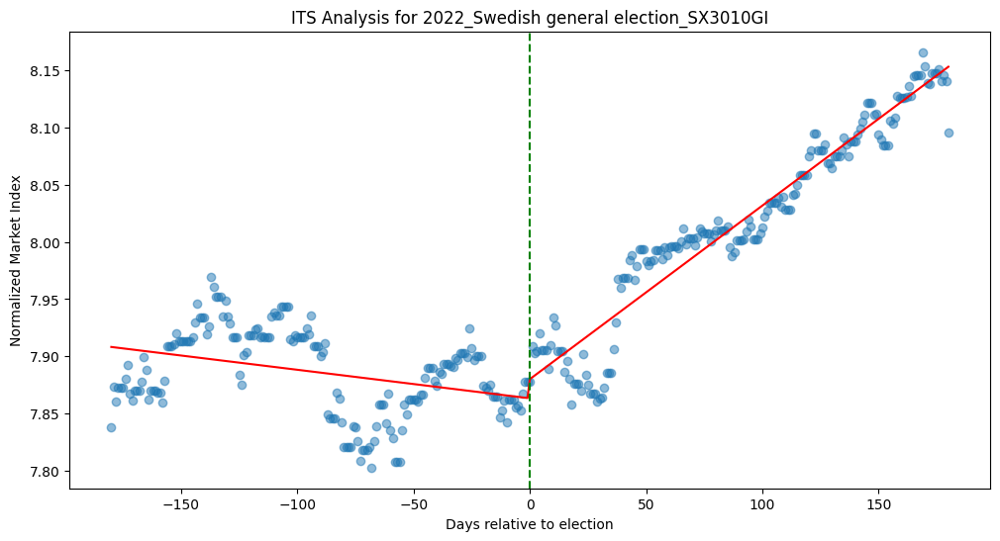


Interrupted Time Series Analysis for 2022_Italian general election_FTITLMS30
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.855
Method:                 Least Squares   F-statistic:                     711.1
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          3.69e-150
Time:                        17:31:37   Log-Likelihood:                 597.07
No. Observations:                 361   AIC:                            -1186.
Df Residuals:                     357   BIC:                            -1171.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

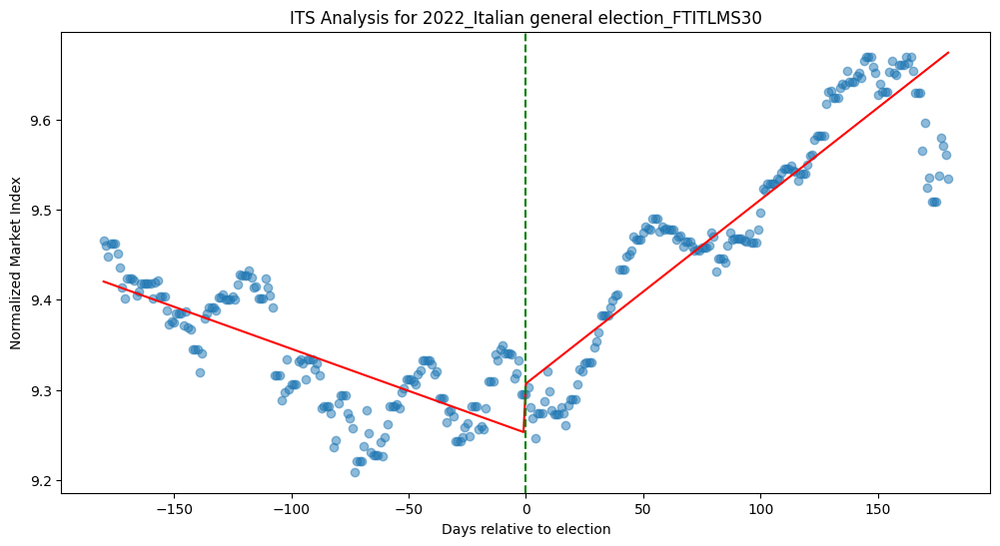


Interrupted Time Series Analysis for 2021_German federal election_CXPVX
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.730
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                     321.1
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          5.18e-101
Time:                        17:31:37   Log-Likelihood:                 836.29
No. Observations:                 361   AIC:                            -1665.
Df Residuals:                     357   BIC:                            -1649.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

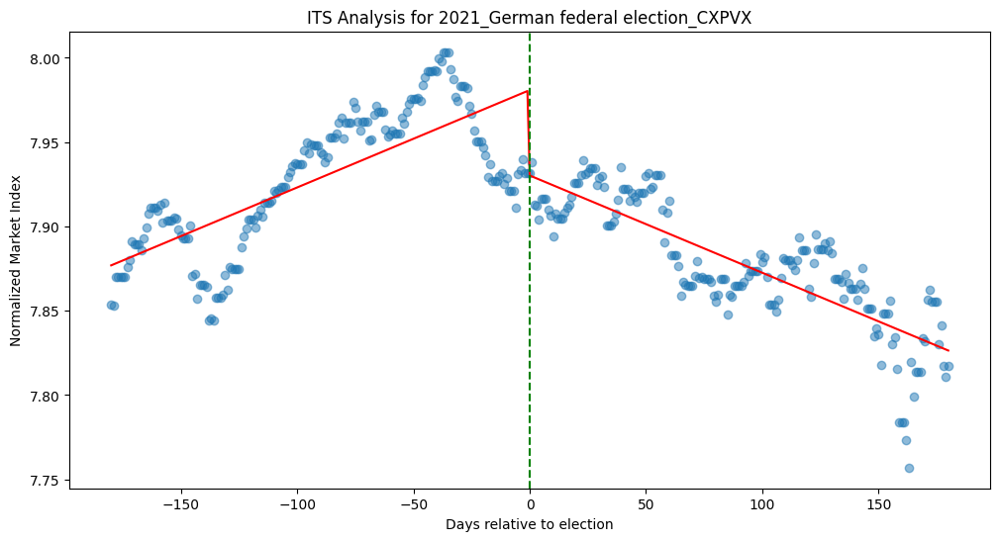


Interrupted Time Series Analysis for 2021_Canadian federal election_TRGSPTS40
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.427
Model:                            OLS   Adj. R-squared:                  0.422
Method:                 Least Squares   F-statistic:                     88.79
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           6.12e-43
Time:                        17:31:37   Log-Likelihood:                 1227.0
No. Observations:                 361   AIC:                            -2446.
Df Residuals:                     357   BIC:                            -2430.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

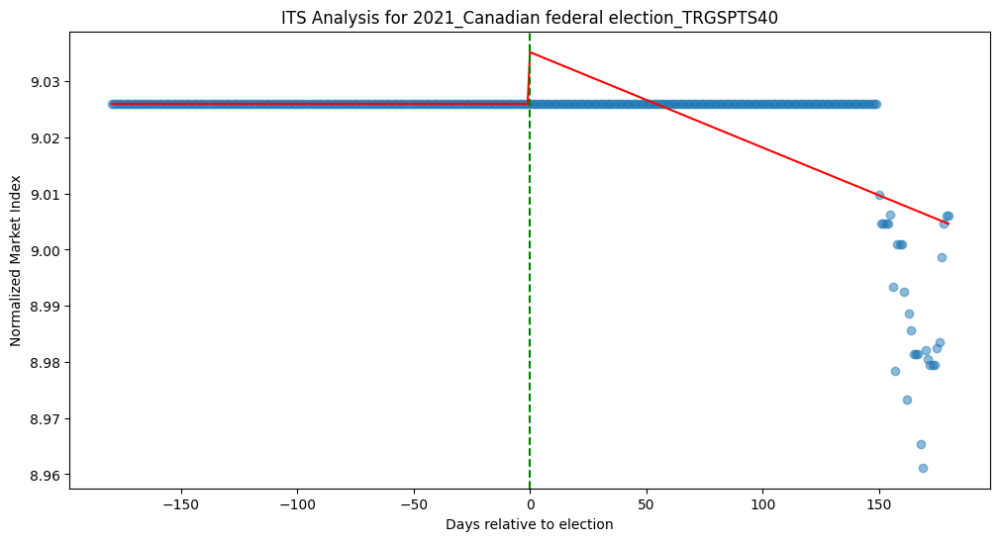


Interrupted Time Series Analysis for 2021_Norwegian parliamentary election_OFING
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     505.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          3.93e-128
Time:                        17:31:38   Log-Likelihood:                 744.19
No. Observations:                 361   AIC:                            -1480.
Df Residuals:                     357   BIC:                            -1465.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

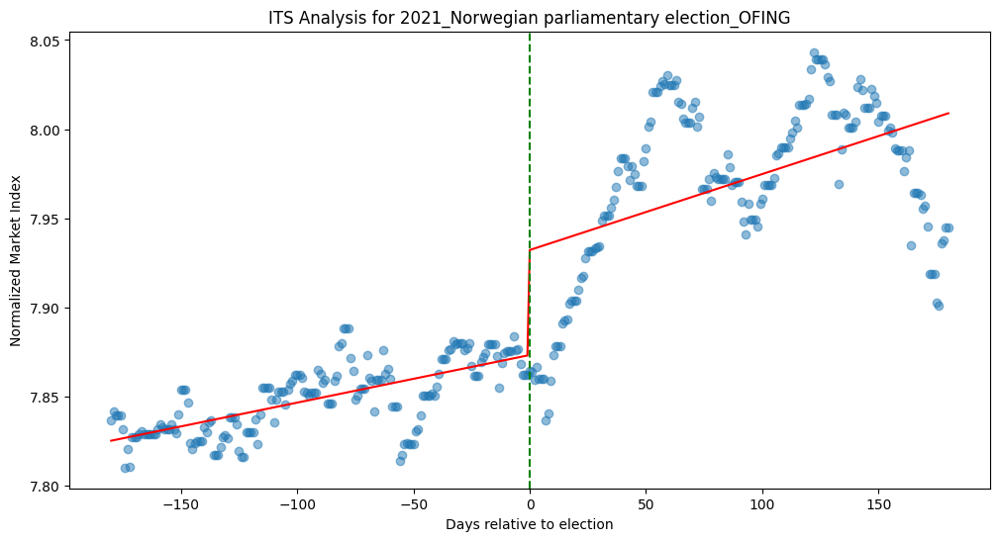


Interrupted Time Series Analysis for 2021_Dutch general election_NLFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.948
Method:                 Least Squares   F-statistic:                     2197.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.12e-229
Time:                        17:31:38   Log-Likelihood:                 732.56
No. Observations:                 361   AIC:                            -1457.
Df Residuals:                     357   BIC:                            -1442.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

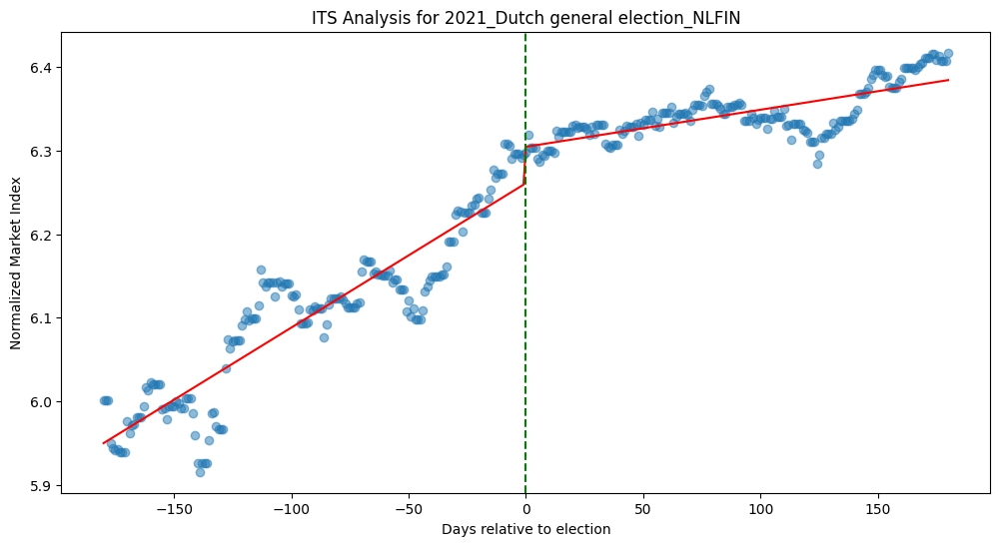


Interrupted Time Series Analysis for 2020_United States presidential election_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     2075.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.67e-225
Time:                        17:31:38   Log-Likelihood:                 749.32
No. Observations:                 361   AIC:                            -1491.
Df Residuals:                     357   BIC:                            -1475.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

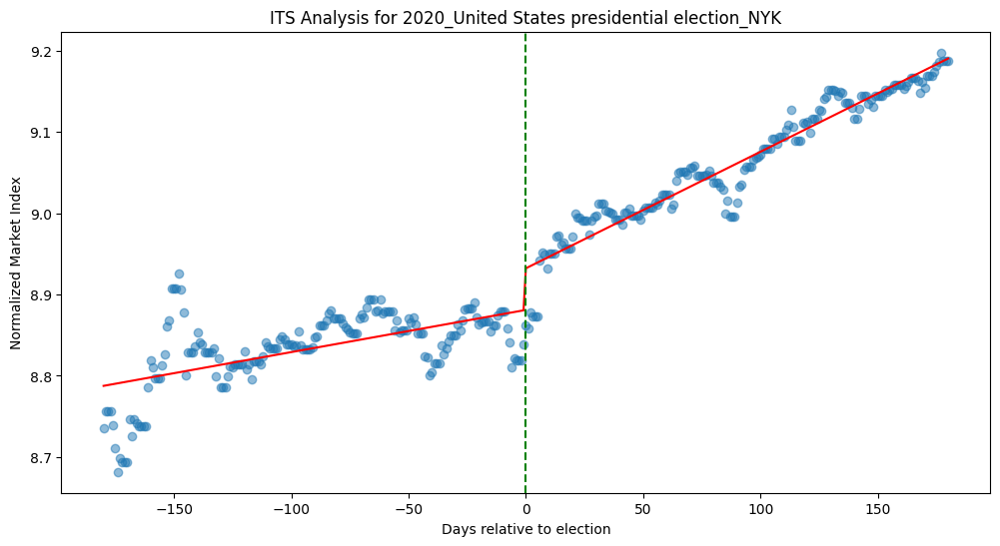


Interrupted Time Series Analysis for 2020_United States Senate elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     2075.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.67e-225
Time:                        17:31:39   Log-Likelihood:                 749.32
No. Observations:                 361   AIC:                            -1491.
Df Residuals:                     357   BIC:                            -1475.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

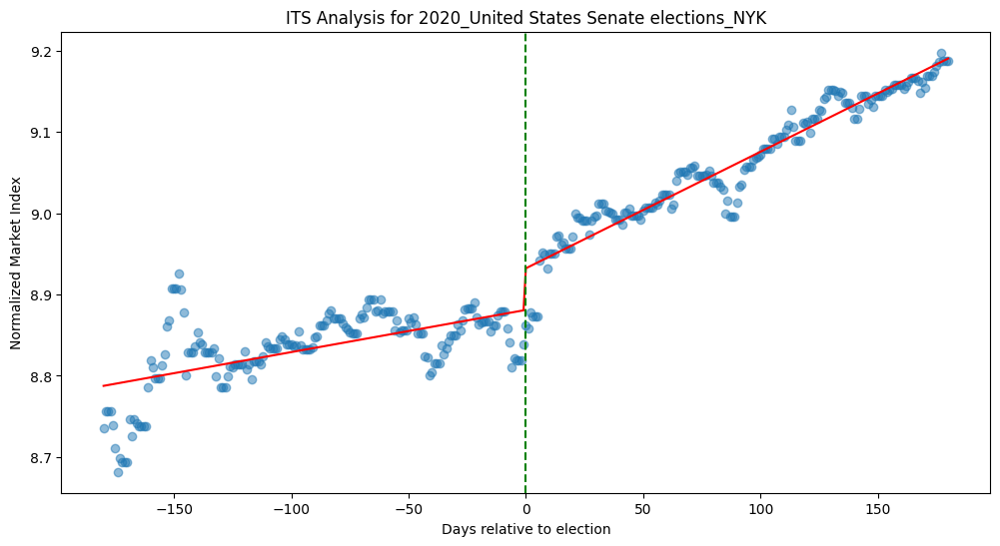


Interrupted Time Series Analysis for 2020_United States House of Representatives elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     2075.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.67e-225
Time:                        17:31:39   Log-Likelihood:                 749.32
No. Observations:                 361   AIC:                            -1491.
Df Residuals:                     357   BIC:                            -1475.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------

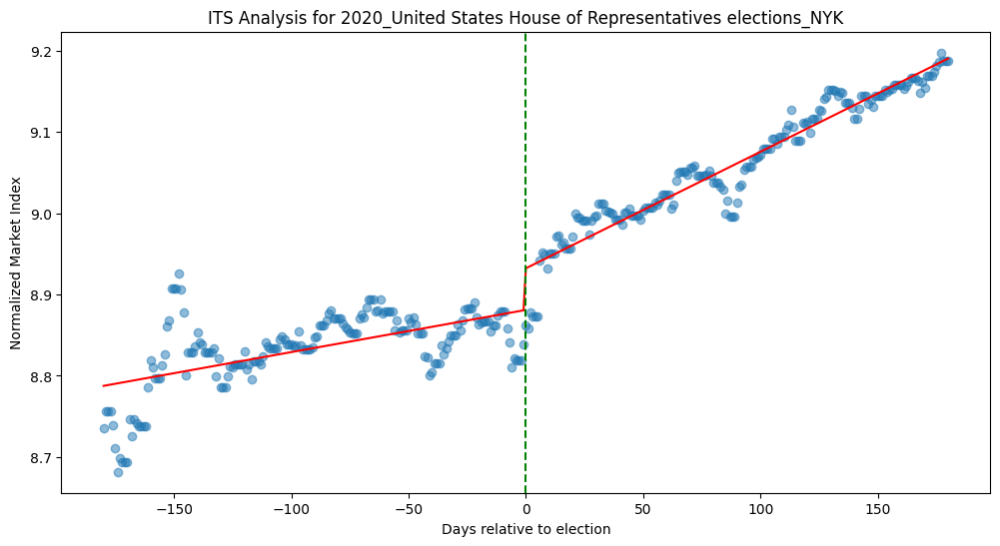


Interrupted Time Series Analysis for 2019_Spanish general election_IBEXIB_x
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.704
Model:                            OLS   Adj. R-squared:                  0.702
Method:                 Least Squares   F-statistic:                     283.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           4.08e-94
Time:                        17:31:39   Log-Likelihood:                 612.13
No. Observations:                 361   AIC:                            -1216.
Df Residuals:                     357   BIC:                            -1201.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

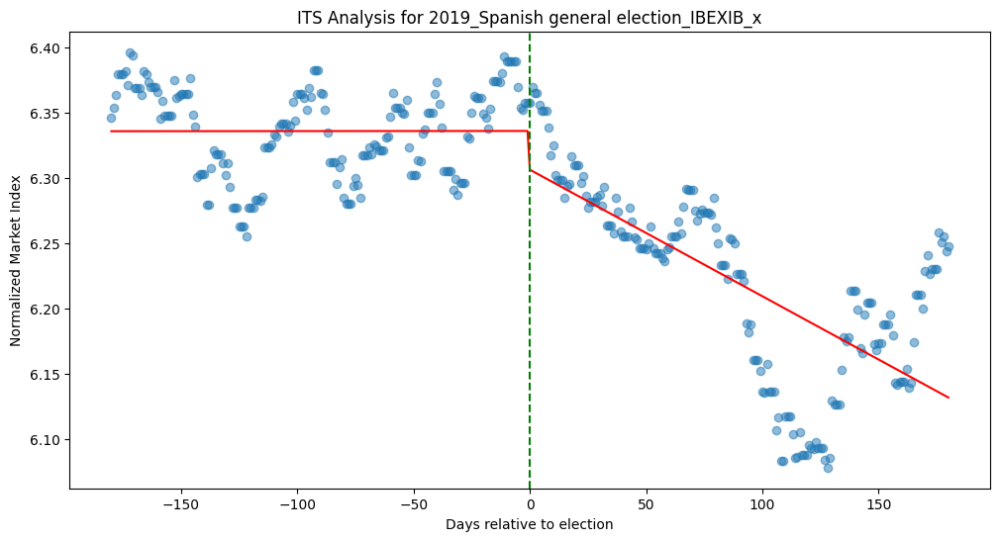


Interrupted Time Series Analysis for 2019_Spanish general election_IBEXIB_y
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.743
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     343.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          7.24e-105
Time:                        17:31:39   Log-Likelihood:                 296.57
No. Observations:                 361   AIC:                            -585.1
Df Residuals:                     357   BIC:                            -569.6
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

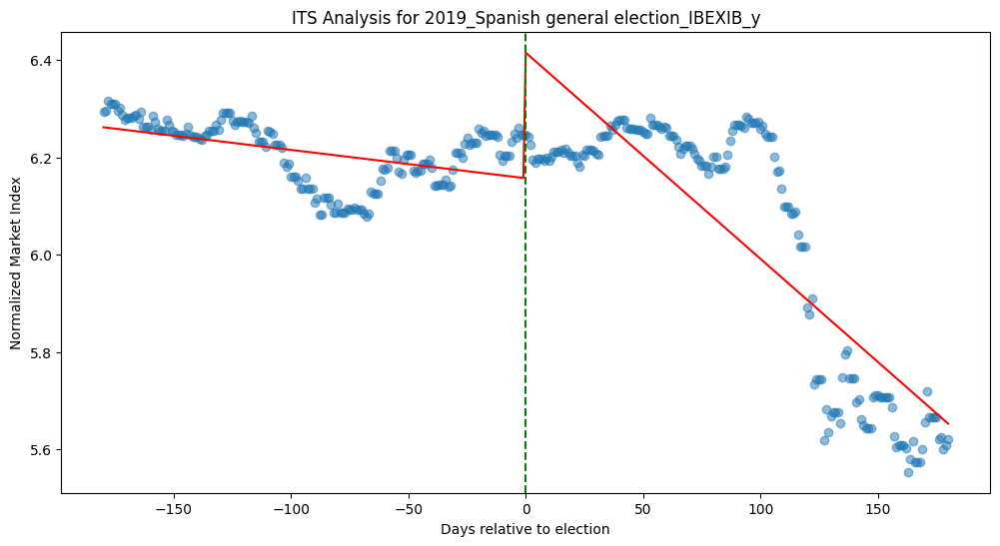


Interrupted Time Series Analysis for 2019_Portuguese legislative election_PTFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.673
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                     245.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.26e-86
Time:                        17:31:40   Log-Likelihood:                 232.33
No. Observations:                 361   AIC:                            -456.7
Df Residuals:                     357   BIC:                            -441.1
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

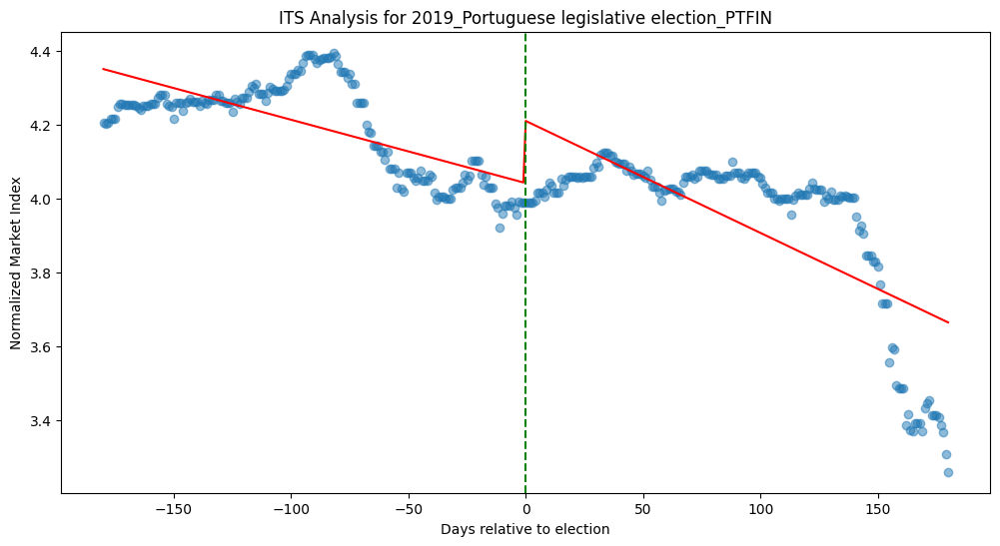


Interrupted Time Series Analysis for 2019_Greek legislative election_FTATBNK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.917
Method:                 Least Squares   F-statistic:                     1326.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.29e-193
Time:                        17:31:40   Log-Likelihood:                 445.16
No. Observations:                 361   AIC:                            -882.3
Df Residuals:                     357   BIC:                            -866.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

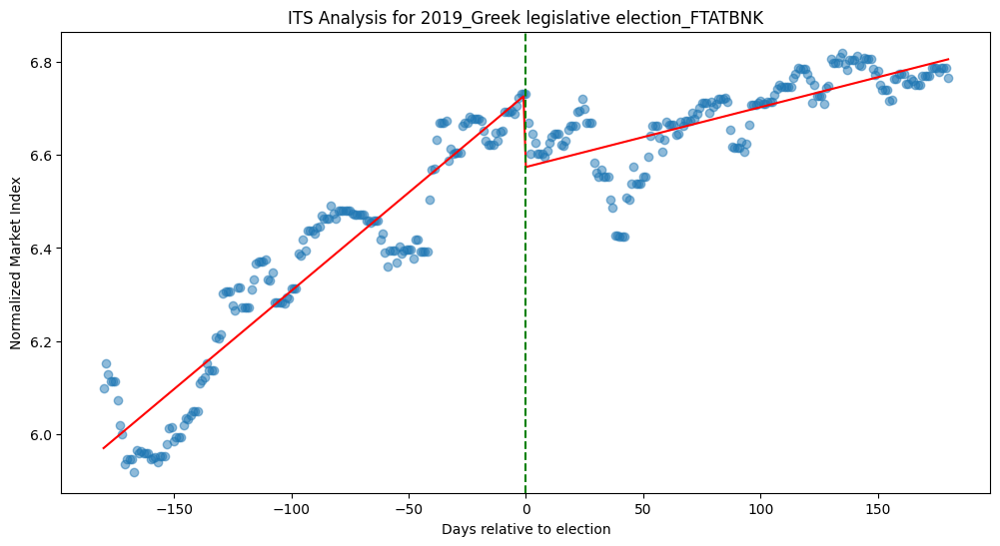


Interrupted Time Series Analysis for 2019_Belgian federal election_BEFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.600
Model:                            OLS   Adj. R-squared:                  0.597
Method:                 Least Squares   F-statistic:                     178.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           9.48e-71
Time:                        17:31:40   Log-Likelihood:                 716.15
No. Observations:                 361   AIC:                            -1424.
Df Residuals:                     357   BIC:                            -1409.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

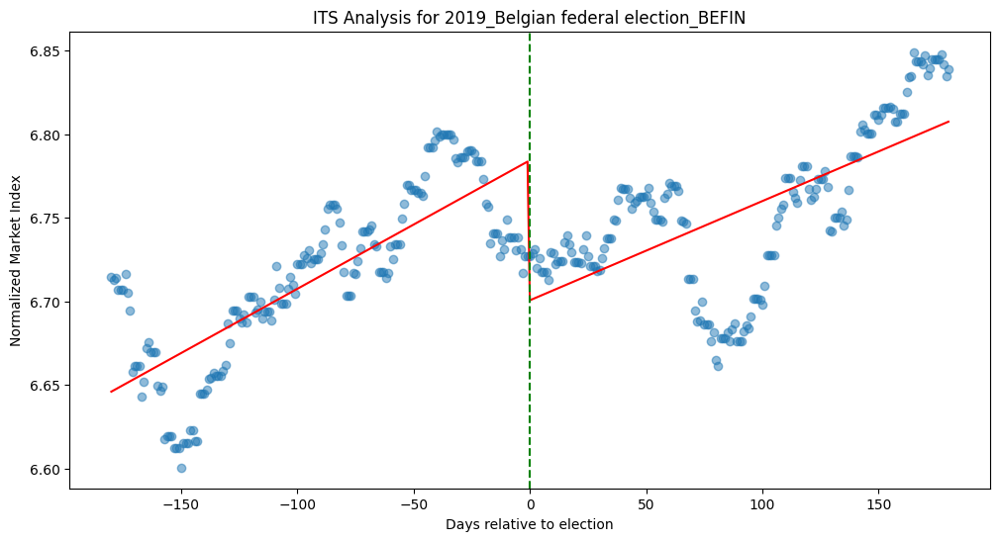


Interrupted Time Series Analysis for 2019_Danish general election_OMXC20
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.784
Method:                 Least Squares   F-statistic:                     436.2
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          5.39e-119
Time:                        17:31:41   Log-Likelihood:                 855.26
No. Observations:                 361   AIC:                            -1703.
Df Residuals:                     357   BIC:                            -1687.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

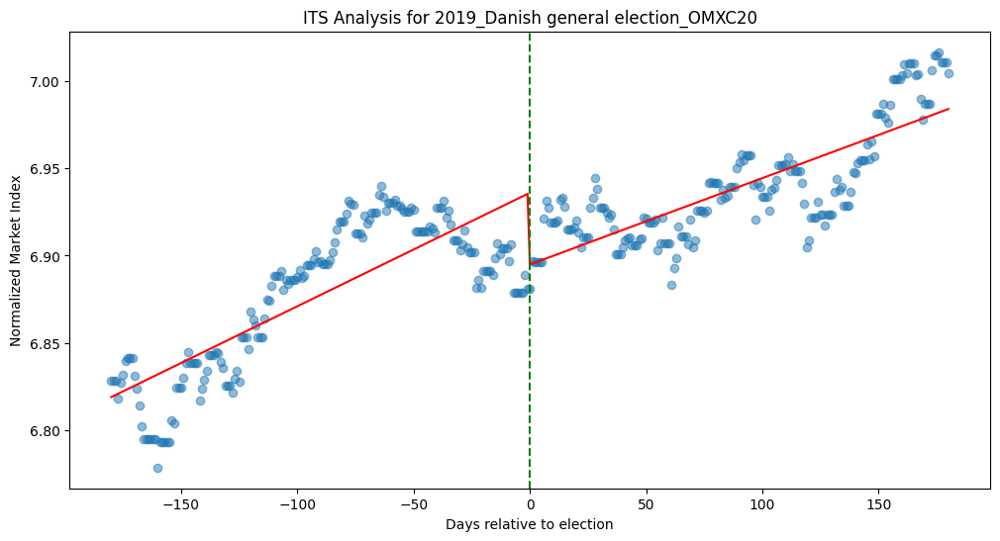


Interrupted Time Series Analysis for 2019_Finnish parliamentary election_N3020PI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.690
Model:                            OLS   Adj. R-squared:                  0.687
Method:                 Least Squares   F-statistic:                     265.0
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           1.94e-90
Time:                        17:31:41   Log-Likelihood:                 801.05
No. Observations:                 361   AIC:                            -1594.
Df Residuals:                     357   BIC:                            -1579.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

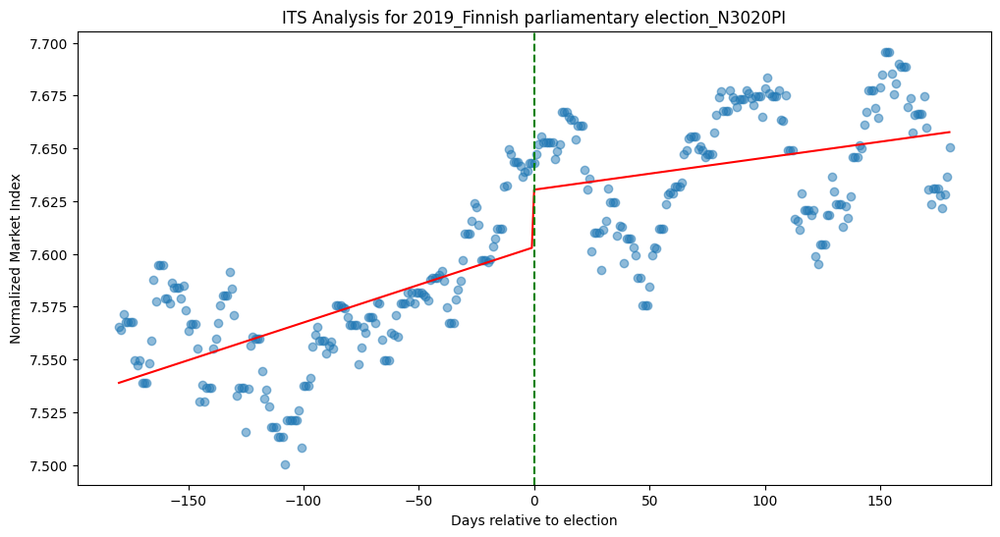


Interrupted Time Series Analysis for 2019_Spanish general election_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.704
Model:                            OLS   Adj. R-squared:                  0.702
Method:                 Least Squares   F-statistic:                     283.6
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           4.08e-94
Time:                        17:31:41   Log-Likelihood:                 612.13
No. Observations:                 361   AIC:                            -1216.
Df Residuals:                     357   BIC:                            -1201.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

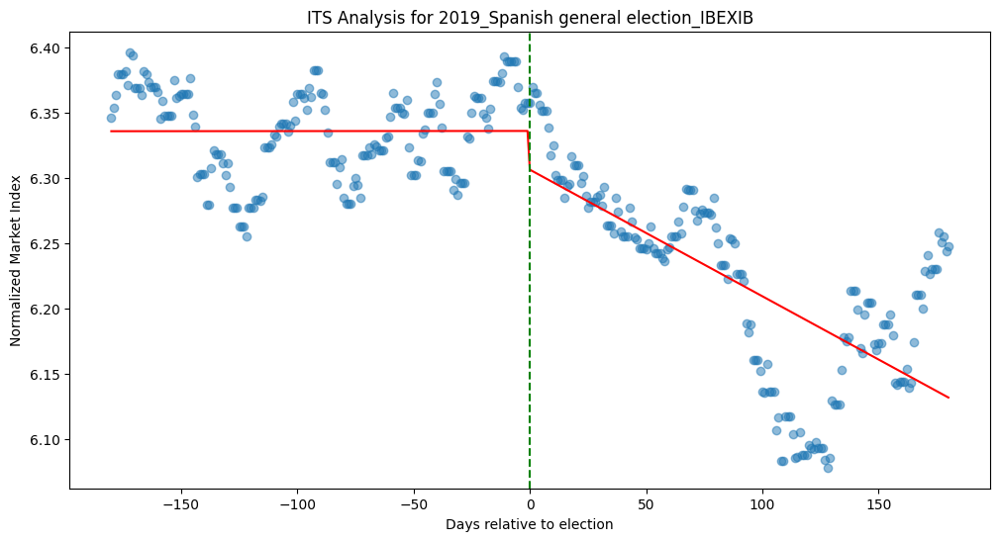


Interrupted Time Series Analysis for 2018_Swedish general election_SX3010GI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.398
Model:                            OLS   Adj. R-squared:                  0.393
Method:                 Least Squares   F-statistic:                     78.61
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           4.63e-39
Time:                        17:31:41   Log-Likelihood:                 700.37
No. Observations:                 361   AIC:                            -1393.
Df Residuals:                     357   BIC:                            -1377.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

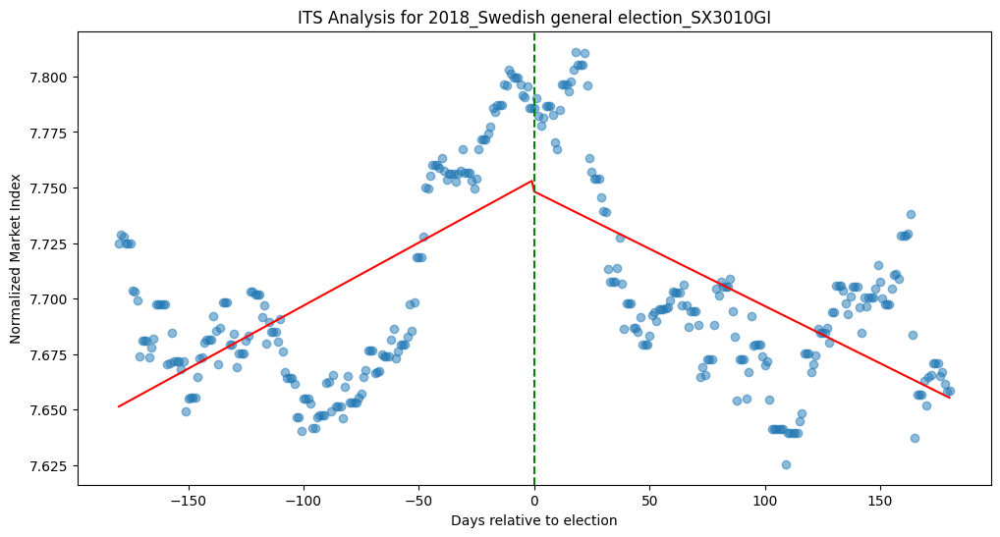


Interrupted Time Series Analysis for 2018_Italian general election_FTITLMS30
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.710
Method:                 Least Squares   F-statistic:                     295.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.49e-96
Time:                        17:31:42   Log-Likelihood:                 668.52
No. Observations:                 361   AIC:                            -1329.
Df Residuals:                     357   BIC:                            -1313.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

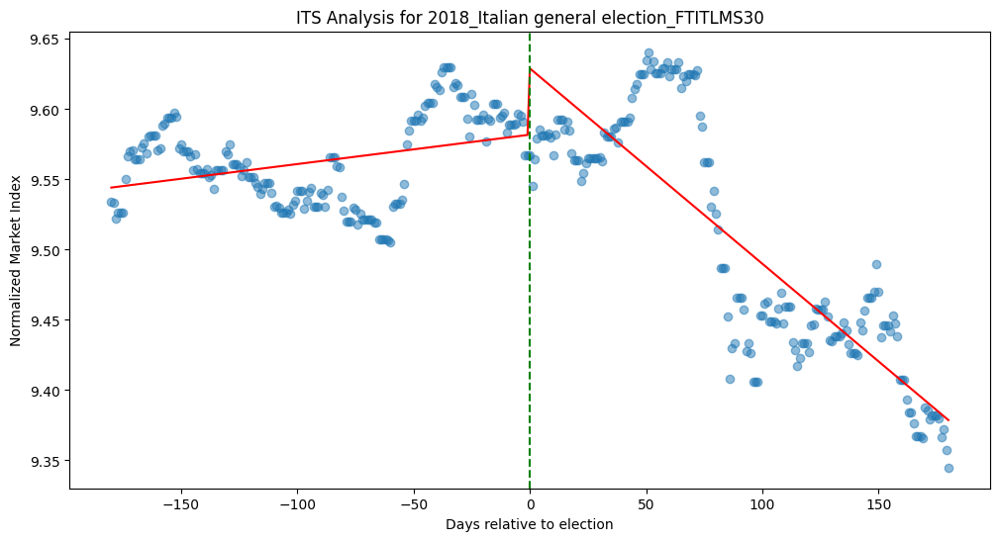


Interrupted Time Series Analysis for 2017_German federal election_CXPVX
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.871
Model:                            OLS   Adj. R-squared:                  0.870
Method:                 Least Squares   F-statistic:                     803.0
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.70e-158
Time:                        17:31:42   Log-Likelihood:                 867.14
No. Observations:                 361   AIC:                            -1726.
Df Residuals:                     357   BIC:                            -1711.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

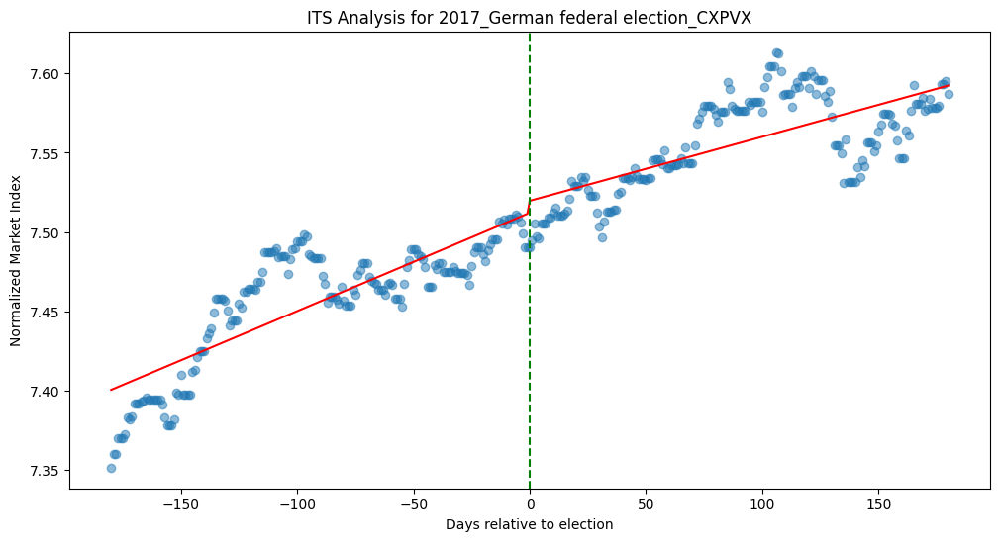


Interrupted Time Series Analysis for 2017_French presidential election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     967.8
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.87e-171
Time:                        17:31:42   Log-Likelihood:                 831.25
No. Observations:                 361   AIC:                            -1654.
Df Residuals:                     357   BIC:                            -1639.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

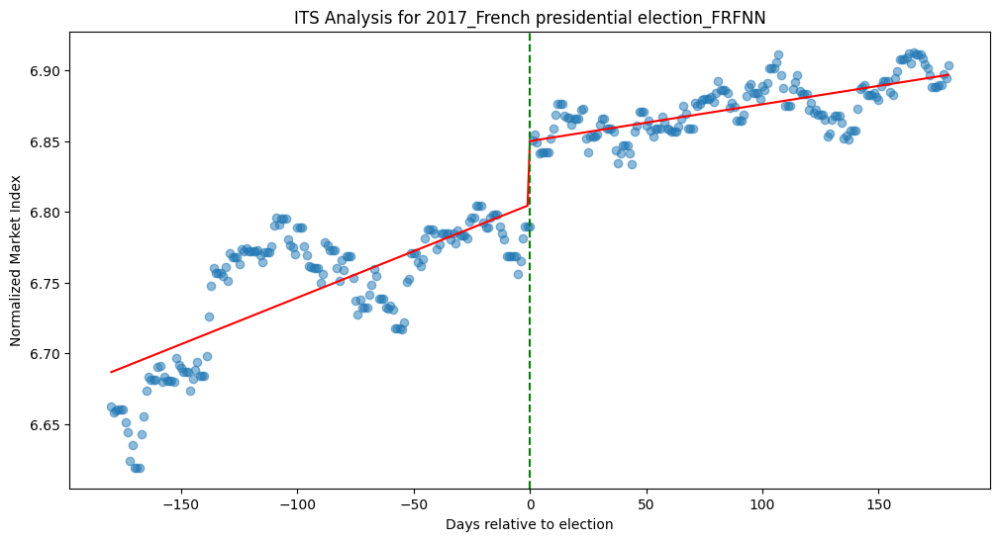


Interrupted Time Series Analysis for 2017_French legislative election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.822
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     550.9
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.53e-133
Time:                        17:31:42   Log-Likelihood:                 849.26
No. Observations:                 361   AIC:                            -1691.
Df Residuals:                     357   BIC:                            -1675.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

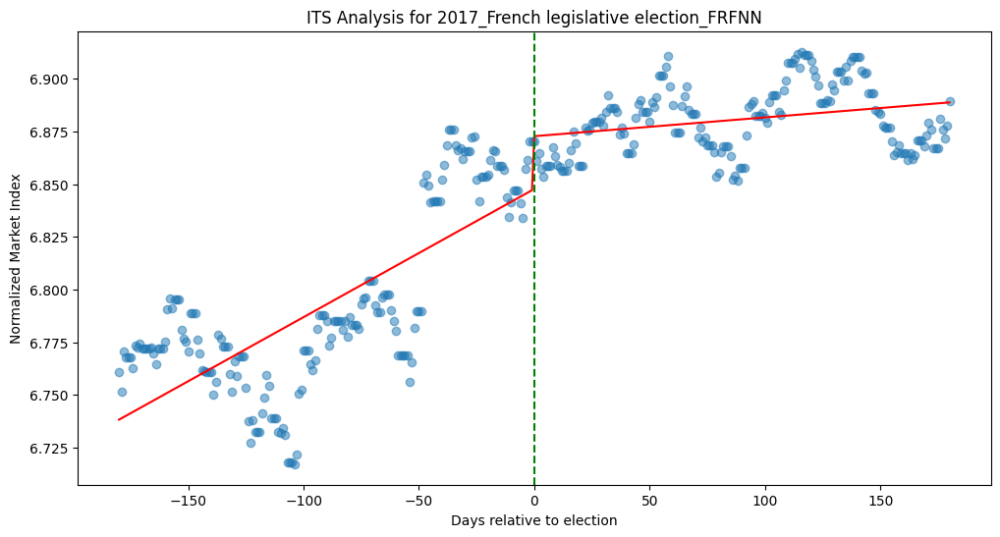


Interrupted Time Series Analysis for 2017_United Kingdom general election_TRINMX302020
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                     1978.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          5.62e-222
Time:                        17:31:43   Log-Likelihood:                 1014.1
No. Observations:                 361   AIC:                            -2020.
Df Residuals:                     357   BIC:                            -2005.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------

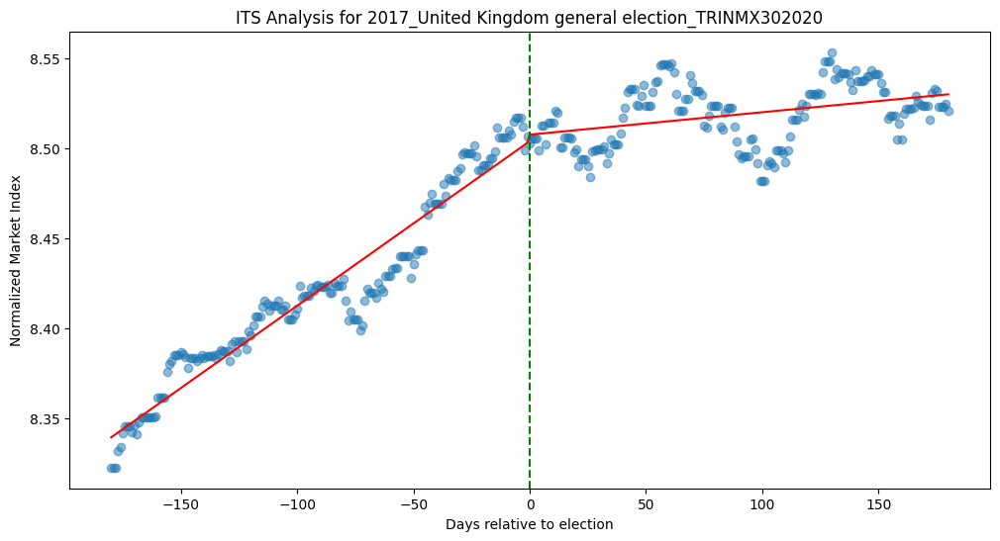


Interrupted Time Series Analysis for 2017_Dutch general election_NLFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.875
Method:                 Least Squares   F-statistic:                     841.8
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.73e-161
Time:                        17:31:43   Log-Likelihood:                 888.97
No. Observations:                 361   AIC:                            -1770.
Df Residuals:                     357   BIC:                            -1754.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

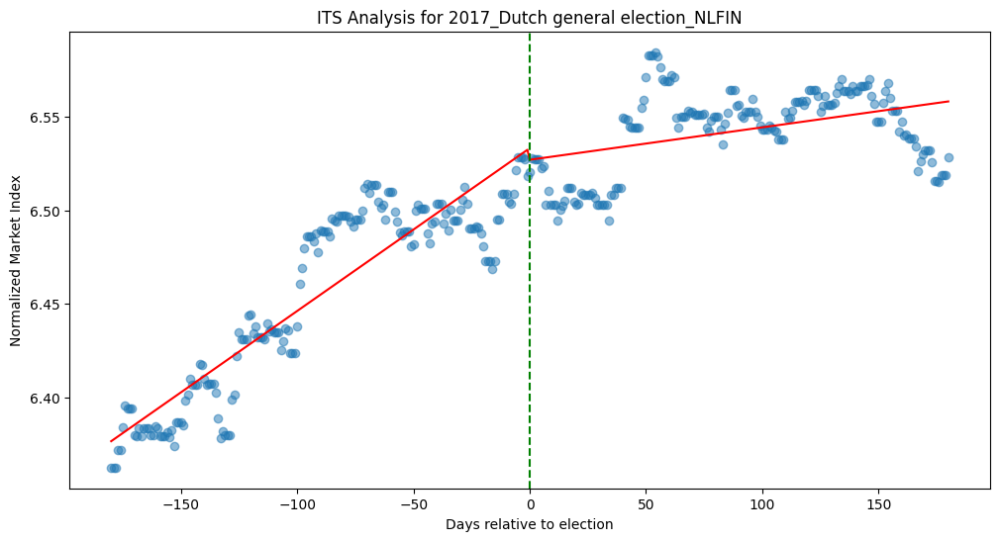


Interrupted Time Series Analysis for 2016_United States presidential election_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     1590.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.13e-206
Time:                        17:31:44   Log-Likelihood:                 894.35
No. Observations:                 361   AIC:                            -1781.
Df Residuals:                     357   BIC:                            -1765.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

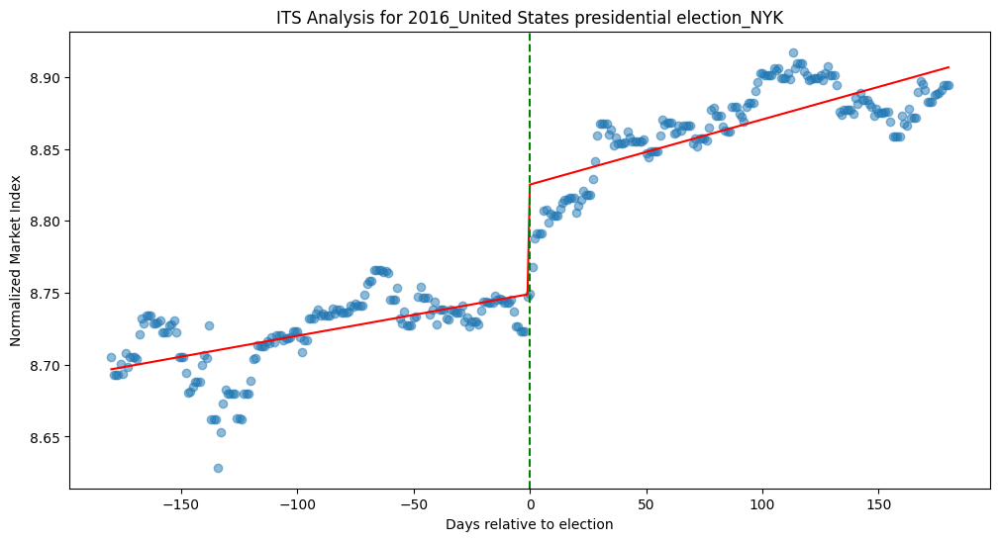


Interrupted Time Series Analysis for 2016_United States Senate elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     1590.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.13e-206
Time:                        17:31:44   Log-Likelihood:                 894.35
No. Observations:                 361   AIC:                            -1781.
Df Residuals:                     357   BIC:                            -1765.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

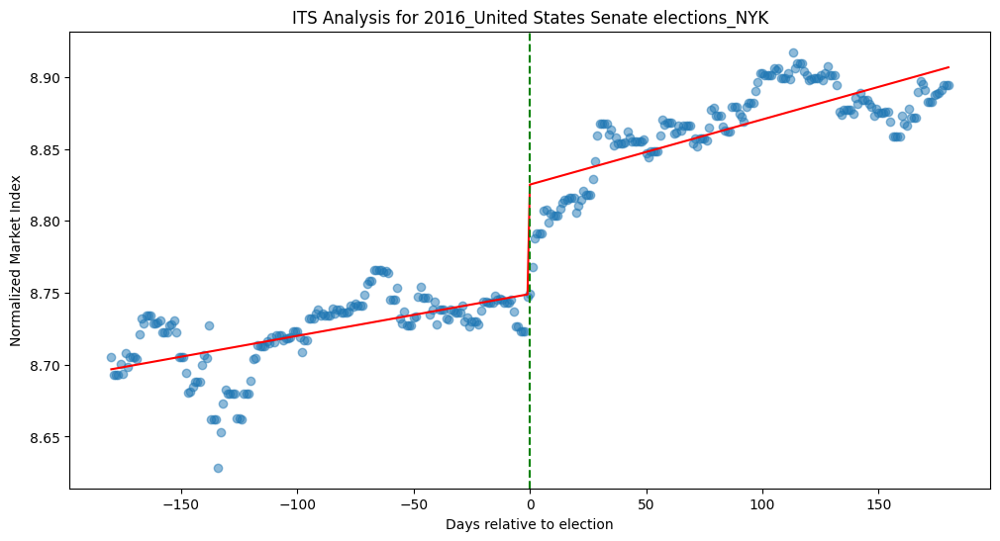


Interrupted Time Series Analysis for 2016_United States House of Representatives elections_NYK
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     1590.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.13e-206
Time:                        17:31:44   Log-Likelihood:                 894.35
No. Observations:                 361   AIC:                            -1781.
Df Residuals:                     357   BIC:                            -1765.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------

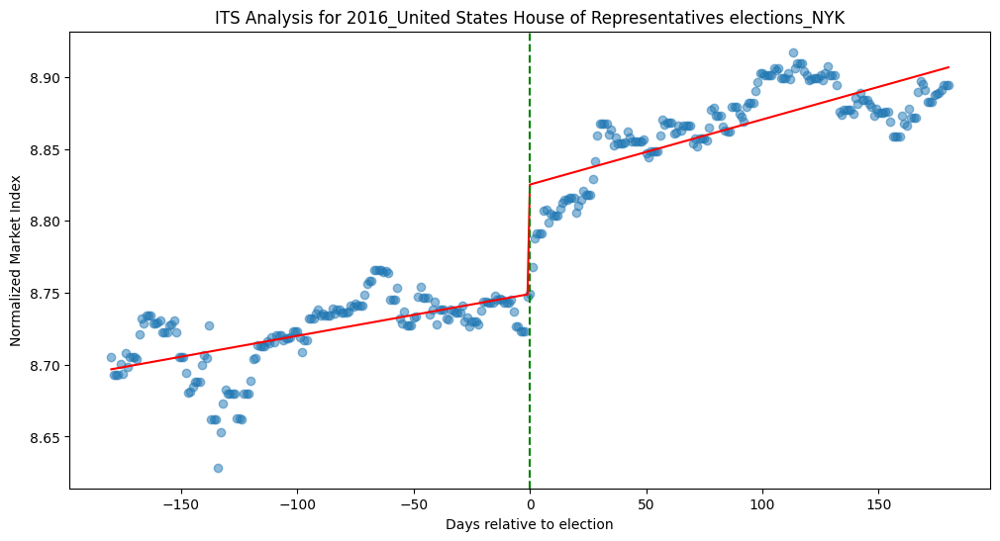


Interrupted Time Series Analysis for 2016_Spanish general election_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.566
Model:                            OLS   Adj. R-squared:                  0.562
Method:                 Least Squares   F-statistic:                     155.0
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.60e-64
Time:                        17:31:45   Log-Likelihood:                 541.56
No. Observations:                 361   AIC:                            -1075.
Df Residuals:                     357   BIC:                            -1060.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

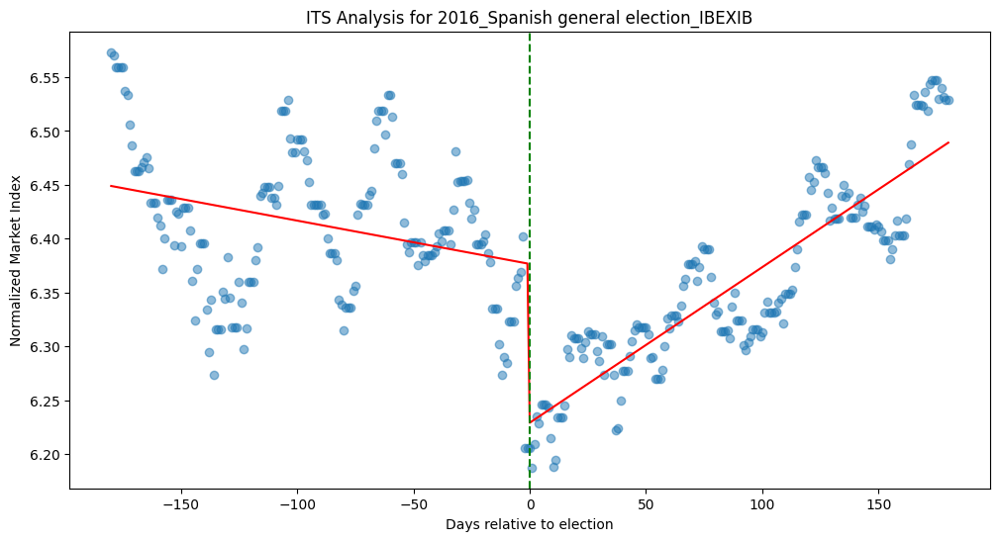


Interrupted Time Series Analysis for 2016_United Kingdom Brexit_TRINMX302020
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.502
Method:                 Least Squares   F-statistic:                     122.0
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.16e-54
Time:                        17:31:45   Log-Likelihood:                 650.64
No. Observations:                 361   AIC:                            -1293.
Df Residuals:                     357   BIC:                            -1278.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

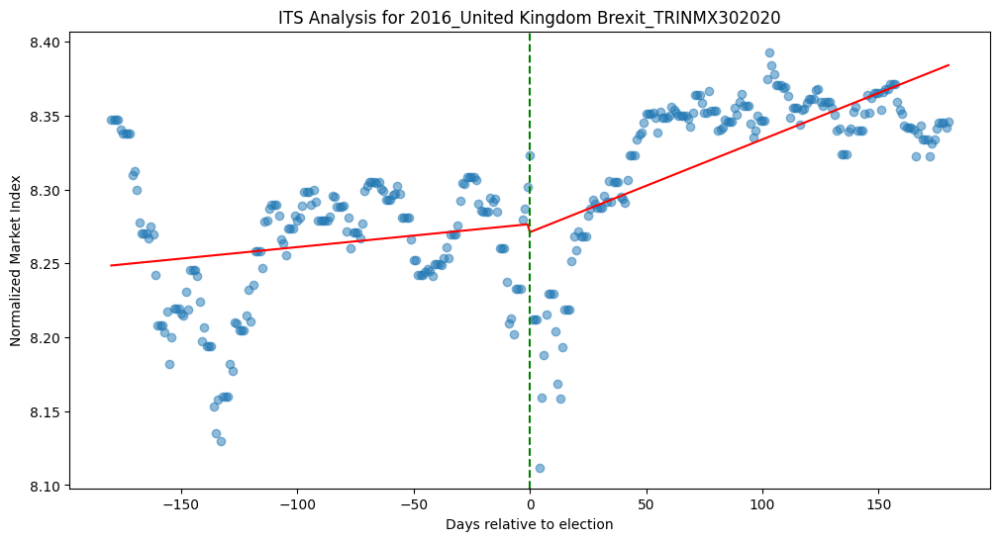


Interrupted Time Series Analysis for 2015_Portuguese legislative election_PTFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     888.4
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          3.69e-165
Time:                        17:31:45   Log-Likelihood:                 450.23
No. Observations:                 361   AIC:                            -892.5
Df Residuals:                     357   BIC:                            -876.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

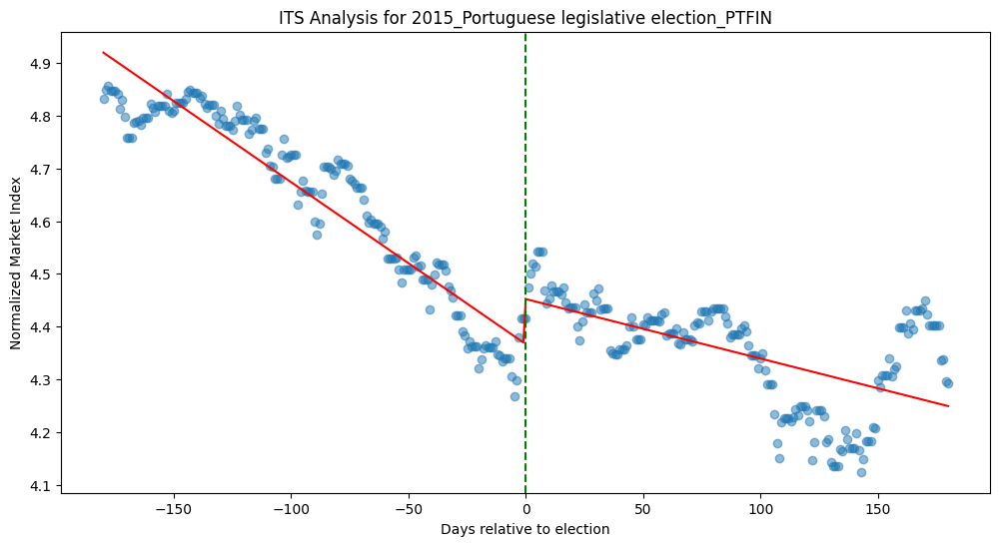


Interrupted Time Series Analysis for 2015_Spanish general election_IBEXIB
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.856
Method:                 Least Squares   F-statistic:                     714.2
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.89e-150
Time:                        17:31:46   Log-Likelihood:                 570.77
No. Observations:                 361   AIC:                            -1134.
Df Residuals:                     357   BIC:                            -1118.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

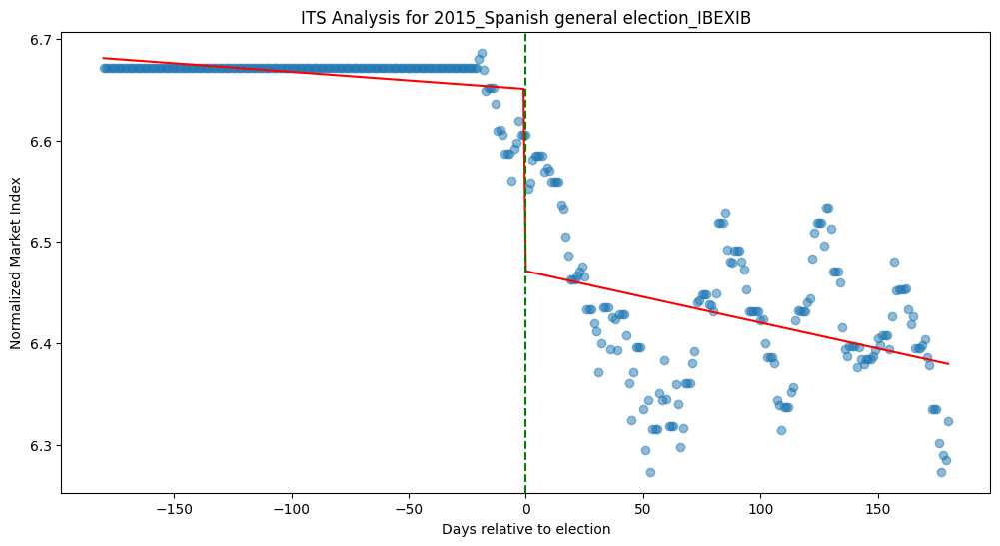


Interrupted Time Series Analysis for 2015_United Kingdom general election_TRINMX302020
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.865
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     765.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          4.23e-155
Time:                        17:31:46   Log-Likelihood:                 842.00
No. Observations:                 361   AIC:                            -1676.
Df Residuals:                     357   BIC:                            -1660.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------

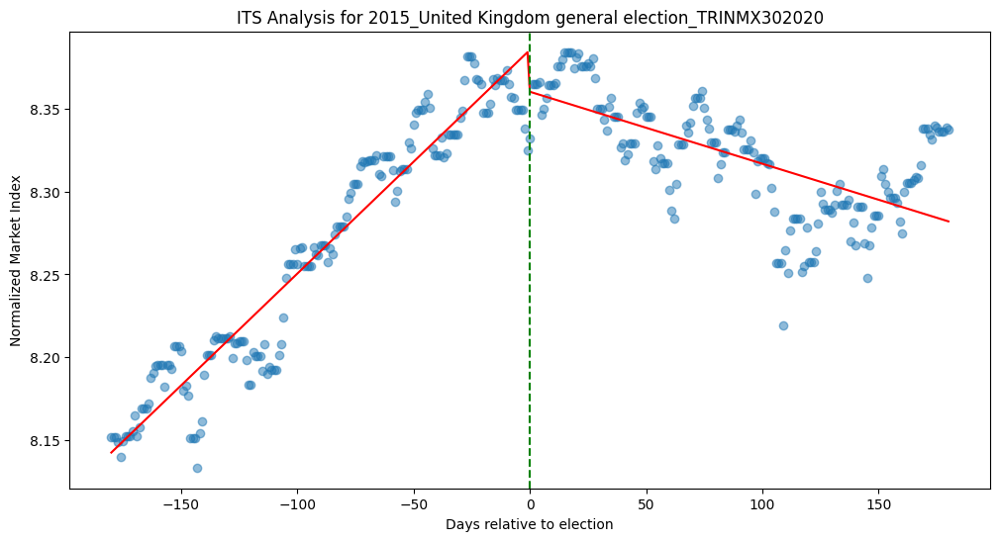


Interrupted Time Series Analysis for 2014_Swedish general election_SX3010GI
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     404.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          2.02e-114
Time:                        17:31:46   Log-Likelihood:                 773.63
No. Observations:                 361   AIC:                            -1539.
Df Residuals:                     357   BIC:                            -1524.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

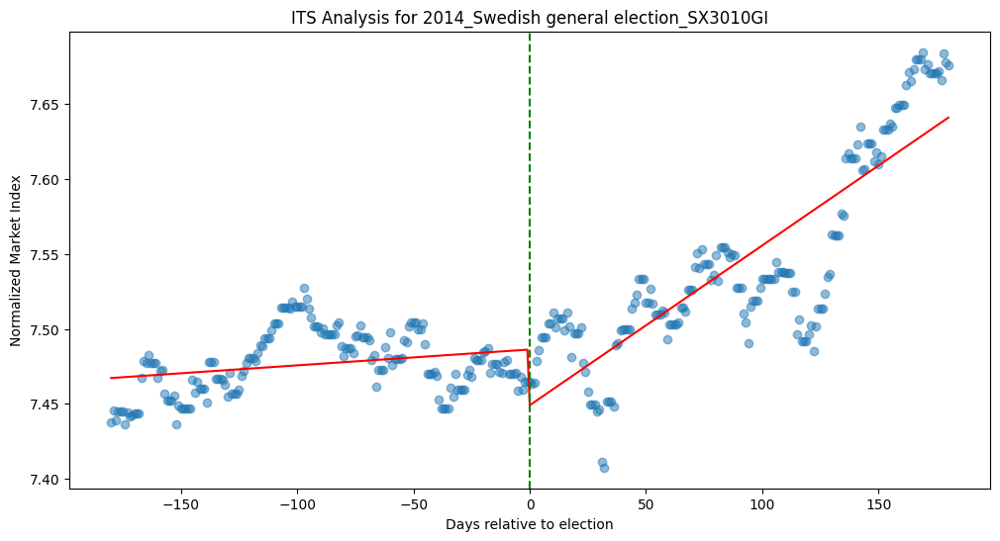


Interrupted Time Series Analysis for 2014_Belgian federal election_BEFIN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.405
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                     80.89
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           6.00e-40
Time:                        17:31:47   Log-Likelihood:                 799.01
No. Observations:                 361   AIC:                            -1590.
Df Residuals:                     357   BIC:                            -1574.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

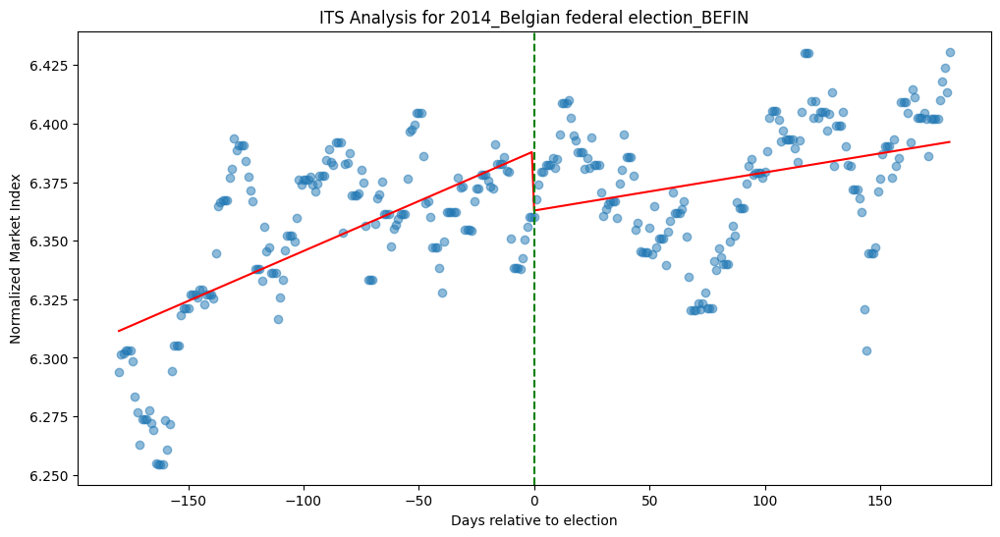


Interrupted Time Series Analysis for 2013_German federal election_CXPVX
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.896
Method:                 Least Squares   F-statistic:                     1034.
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.19e-175
Time:                        17:31:47   Log-Likelihood:                 947.25
No. Observations:                 361   AIC:                            -1886.
Df Residuals:                     357   BIC:                            -1871.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

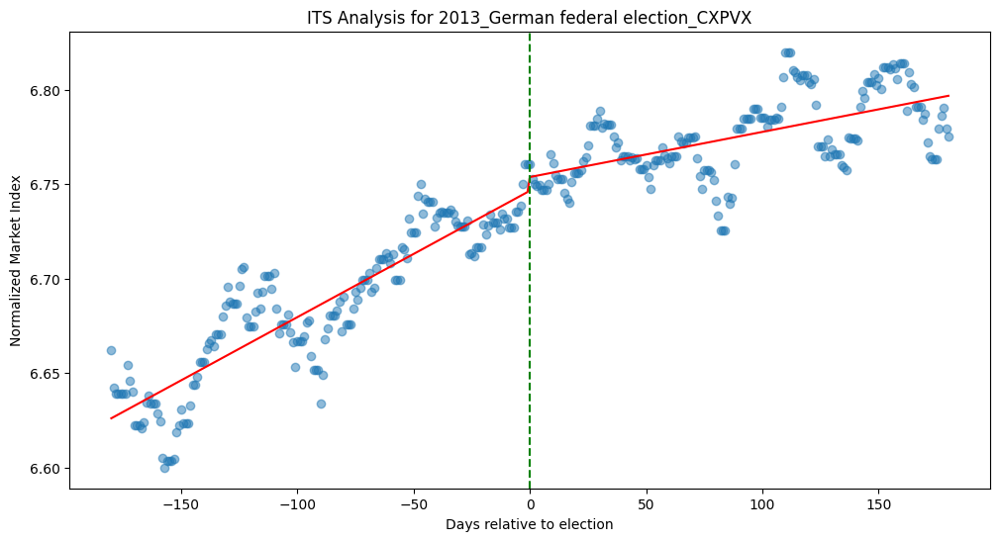


Interrupted Time Series Analysis for 2013_Italian general election_FTITLMS30
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.518
Model:                            OLS   Adj. R-squared:                  0.514
Method:                 Least Squares   F-statistic:                     127.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           3.23e-56
Time:                        17:31:47   Log-Likelihood:                 542.29
No. Observations:                 361   AIC:                            -1077.
Df Residuals:                     357   BIC:                            -1061.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

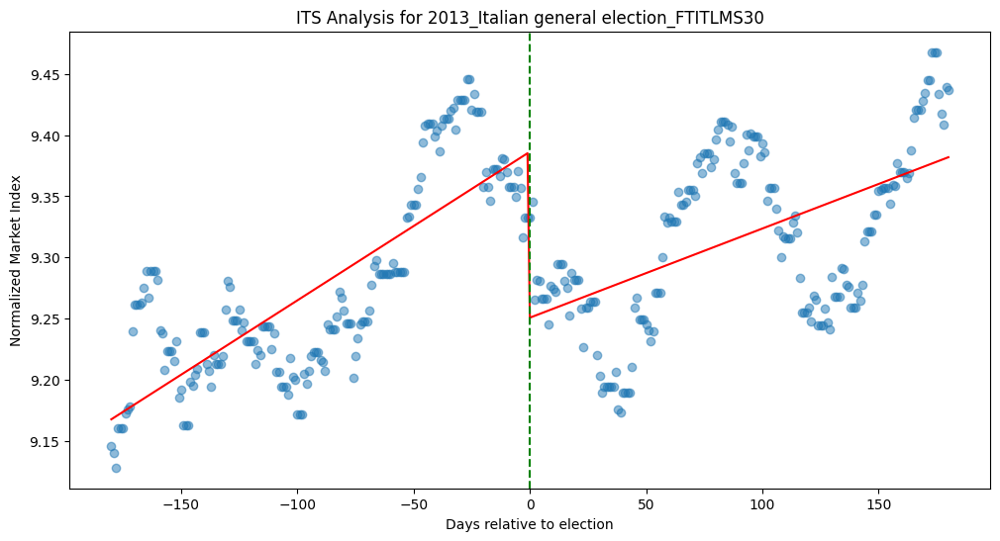


Interrupted Time Series Analysis for 2013_Norwegian parliamentary election_OFING
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.881
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     880.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):          1.57e-164
Time:                        17:31:47   Log-Likelihood:                 767.16
No. Observations:                 361   AIC:                            -1526.
Df Residuals:                     357   BIC:                            -1511.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

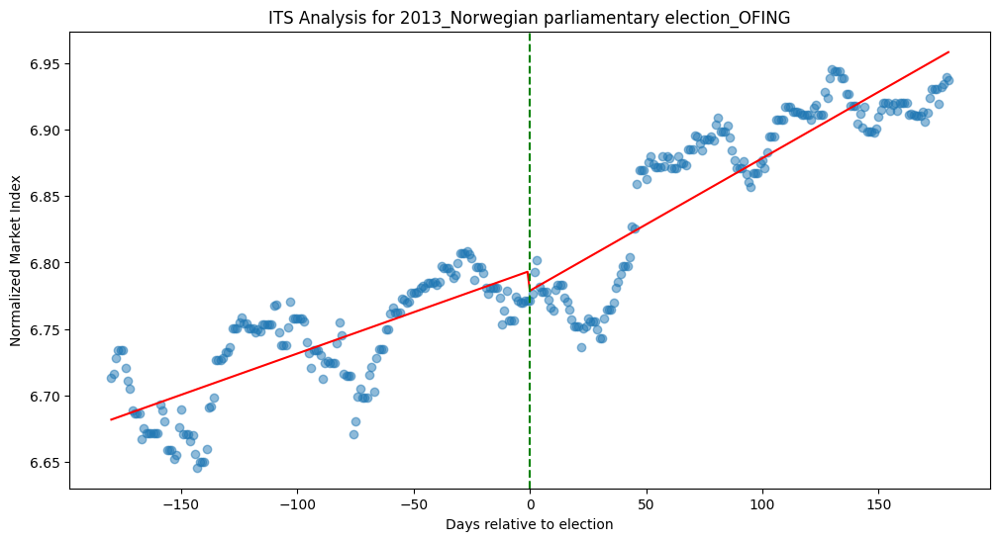

In [147]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt


def its_analysis(series, election_name):
    try:
        df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
        
        # Check for NaN values
        if df['index'].isnull().any():
            print(f"Warning: NaN values found in {election_name}")
            df = df.dropna()  # Remove NaN values
        
        if len(df) == 0:
            print(f"Error: No valid data for {election_name}")
            return None
        
        df = df.sort_values('date').reset_index(drop=True)
        df['time'] = range(len(df))
        df['intervention'] = (df['date'] >= 0).astype(int)
        df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
        
        X = sm.add_constant(df[['time', 'intervention', 'time_after_intervention']])
        model = sm.OLS(df['index'], X).fit()
        
        print(f"\nInterrupted Time Series Analysis for {election_name}")
        print(model.summary())
        
        plt.figure(figsize=(12, 6))
        plt.scatter(df['date'], df['index'], alpha=0.5)
        plt.plot(df['date'], model.predict(X), color='red')
        plt.axvline(x=0, color='green', linestyle='--')
        plt.title(f'ITS Analysis for {election_name}')
        plt.xlabel('Days relative to election')
        plt.ylabel('Normalized Market Index')
        plt.show()
        
        return model
    except Exception as e:
        print(f"Error processing {election_name}: {str(e)}")
        return None
    
elections = merged_df.columns[1:]  # Exclude 'NormalizedDate' column
# Perform ITS analysis for each election
for election in elections:
    model = its_analysis(merged_df[election], election)
    if model is None:
        print(f"Failed to process: {election}")

# Get the list of elections (columns) from merged_df


# Perform ITS analysis for each election
for election in elections:
    its_analysis(merged_df[election], election)


In [148]:
!pip install reportlab

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [149]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
from io import BytesIO

def its_analysis_to_pdf(merged_df, output_file='ITS_Analysis_Results.pdf'):
    c = canvas.Canvas(output_file, pagesize=letter)
    width, height = letter

    def save_plot_to_pdf(y_position):
        img_buffer = BytesIO()
        plt.savefig(img_buffer, format='png')
        img_buffer.seek(0)
        img = ImageReader(img_buffer)
        img_width, img_height = 500, 300
        if y_position - img_height < 50:  # Check if there's enough space
            c.showPage()  # Start a new page
            y_position = height - 50  # Reset y_position for the new page
        c.drawImage(img, 50, y_position - img_height, width=img_width, height=img_height)
        plt.close()
        return y_position - img_height - 20  # Return the new y_position after drawing the image

    def its_analysis(series, election_name):
        df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
        df = df.sort_values('date').reset_index(drop=True)
        df['time'] = range(len(df))
        df['intervention'] = (df['date'] >= 0).astype(int)
        df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
       
        X = sm.add_constant(df[['time', 'intervention', 'time_after_intervention']])
        model = sm.OLS(df['index'], X).fit()
       
        # Add results to PDF
        c.setFont("Helvetica-Bold", 16)
        c.drawString(50, height - 50, f"Interrupted Time Series Analysis for {election_name}")
       
        c.setFont("Helvetica", 10)
        summary_text = model.summary().as_text()
        y_position = height - 80
        for line in summary_text.split('\n'):
            if y_position < 50:
                c.showPage()
                y_position = height - 50
            c.drawString(50, y_position, line)
            y_position -= 12

        # Plot the results
        plt.figure(figsize=(10, 6))
        plt.scatter(df['date'], df['index'], alpha=0.5)
        plt.plot(df['date'], model.predict(X), color='red')
        plt.axvline(x=0, color='green', linestyle='--')
        plt.title(f'ITS Analysis for {election_name}')
        plt.xlabel('Days relative to election')
        plt.ylabel('Normalized Market Index')
       
        y_position = save_plot_to_pdf(y_position)
        
        return model

    # Get the list of elections (columns) from merged_df
    elections = merged_df.columns[1:]  # Exclude 'NormalizedDate' column

    # Perform ITS analysis for each election
    for election in elections:
        model = its_analysis(merged_df[election], election)
        print(f"\nInterrupted Time Series Analysis for {election}")
        print(model.summary())
        c.showPage()  # Start a new page for the next election

    c.save()
    print(f"ITS analysis results saved to {output_file}")

# Usage
# Assuming merged_df is your pivot table DataFrame
its_analysis_to_pdf(merged_df)


Interrupted Time Series Analysis for 2024_French Senate election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.626
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     199.3
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           6.48e-76
Time:                        17:31:52   Log-Likelihood:                 874.66
No. Observations:                 361   AIC:                            -1741.
Df Residuals:                     357   BIC:                            -1726.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

In [150]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
from io import BytesIO

def its_analysis_to_pdf(merged_df, output_file='Non_Linear_ITS_Analysis_Results.pdf'):
    c = canvas.Canvas(output_file, pagesize=letter)
    width, height = letter
    
    def save_plot_to_pdf(y_position):
        img_buffer = BytesIO()
        plt.savefig(img_buffer, format='png')
        img_buffer.seek(0)
        img = ImageReader(img_buffer)
        img_width, img_height = 500, 300
        if y_position - img_height < 50:  # Check if there's enough space
            c.showPage()  # Start a new page
            y_position = height - 50  # Reset y_position for the new page
        c.drawImage(img, 50, y_position - img_height, width=img_width, height=img_height)
        plt.close()
        return y_position - img_height - 20  # Return the new y_position after drawing the image

    def non_linear_its_analysis(series, election_name):
        df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
        df = df.sort_values('date').reset_index(drop=True)
        df['time'] = range(len(df))
        df['intervention'] = (df['date'] >= 0).astype(int)
        df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
        
        # Add polynomial terms
        df['time_squared'] = df['time'] ** 2
        df['time_after_intervention_squared'] = df['time_after_intervention'] ** 2
        
        X = sm.add_constant(df[['time', 'time_squared', 'intervention', 'time_after_intervention', 'time_after_intervention_squared']])
        model = sm.OLS(df['index'], X).fit()
        
        # Add results to PDF
        c.setFont("Helvetica-Bold", 16)
        c.drawString(50, height - 50, f"Non-Linear Interrupted Time Series Analysis for {election_name}")
        
        c.setFont("Helvetica", 10)
        summary_text = model.summary().as_text()
        y_position = height - 80
        for line in summary_text.split('\n'):
            if y_position < 50:
                c.showPage()
                y_position = height - 50
            c.drawString(50, y_position, line)
            y_position -= 12

        # Plot the results
        plt.figure(figsize=(10, 6))
        plt.scatter(df['date'], df['index'], alpha=0.5)
        plt.plot(df['date'], model.predict(X), color='red')
        plt.axvline(x=0, color='green', linestyle='--')
        plt.title(f'Non-Linear ITS Analysis for {election_name}')
        plt.xlabel('Days relative to election')
        plt.ylabel('Normalized Market Index')
        
        y_position = save_plot_to_pdf(y_position)
        
        return model

    # Get the list of elections (columns) from merged_df
    elections = merged_df.columns[1:]  # Exclude 'NormalizedDate' column

    # Perform non-linear ITS analysis for each election
    for election in elections:
        model = non_linear_its_analysis(merged_df[election], election)
        print(f"\nNon-Linear Second degree Interrupted Time Series Analysis for {election}")
        print(model.summary())
        c.showPage()  # Start a new page for the next election

    c.save()
    print(f"Non-linear ITS analysis results saved to {output_file}")

# Usage
# Assuming merged_df is your pivot table DataFrame
its_analysis_to_pdf(merged_df)


Non-Linear Second degree Interrupted Time Series Analysis for 2024_French Senate election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.639
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     125.7
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           2.68e-76
Time:                        17:32:04   Log-Likelihood:                 880.98
No. Observations:                 361   AIC:                            -1750.
Df Residuals:                     355   BIC:                            -1727.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
-------------

In [151]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
from io import BytesIO

def its_analysis_to_pdf(merged_df, output_file='Non_Linear_ITS_Analysis_Results.pdf'):
    c = canvas.Canvas(output_file, pagesize=letter)
    width, height = letter
    
    def save_plot_to_pdf(y_position):
        img_buffer = BytesIO()
        plt.savefig(img_buffer, format='png')
        img_buffer.seek(0)
        img = ImageReader(img_buffer)
        img_width, img_height = 500, 300
        if y_position - img_height < 50:  # Check if there's enough space
            c.showPage()  # Start a new page
            y_position = height - 50  # Reset y_position for the new page
        c.drawImage(img, 50, y_position - img_height, width=img_width, height=img_height)
        plt.close()
        return y_position - img_height - 20  # Return the new y_position after drawing the image

    def non_linear_its_analysis(series, election_name):
        df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
        df = df.sort_values('date').reset_index(drop=True)
        df['time'] = range(len(df))
        df['intervention'] = (df['date'] >= 0).astype(int)
        df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
        
        # Add polynomial terms
        df['time_squared'] = df['time'] ** 2
        df['time_after_intervention_squared'] = df['time_after_intervention'] ** 3
        df['time_3'] = df['time'] ** 2
        df['time_after_intervention_3'] = df['time_after_intervention'] ** 3
        
        X = sm.add_constant(df[['time', 'time_squared', 'intervention', 'time_after_intervention', 'time_after_intervention_squared','time_after_intervention_3','time_3']])
        model = sm.OLS(df['index'], X).fit()
        
        # Add results to PDF
        c.setFont("Helvetica-Bold", 16)
        c.drawString(50, height - 50, f"Non-Linear Interrupted Time Series Analysis for {election_name}")
        
        c.setFont("Helvetica", 10)
        summary_text = model.summary().as_text()
        y_position = height - 80
        for line in summary_text.split('\n'):
            if y_position < 50:
                c.showPage()
                y_position = height - 50
            c.drawString(50, y_position, line)
            y_position -= 12

        # Plot the results
        plt.figure(figsize=(10, 6))
        plt.scatter(df['date'], df['index'], alpha=0.5)
        plt.plot(df['date'], model.predict(X), color='red')
        plt.axvline(x=0, color='green', linestyle='--')
        plt.title(f'Non-Linear ITS Analysis for {election_name}')
        plt.xlabel('Days relative to election')
        plt.ylabel('Normalized Market Index')
        
        y_position = save_plot_to_pdf(y_position)
        
        return model

    # Get the list of elections (columns) from merged_df
    elections = merged_df.columns[1:]  # Exclude 'NormalizedDate' column

    # Perform non-linear ITS analysis for each election
    for election in elections:
        model = non_linear_its_analysis(merged_df[election], election)
        print(f"\nNon-Linear Third degree Interrupted Time Series Analysis for {election}")
        print(model.summary())
        c.showPage()  # Start a new page for the next election

    c.save()
    print(f"Non-linear Third degree ITS analysis results saved to {output_file}")

# Usage
# Assuming merged_df is your pivot table DataFrame
its_analysis_to_pdf(merged_df)


Non-Linear Third degree Interrupted Time Series Analysis for 2024_French Senate election_FRFNN
                            OLS Regression Results                            
Dep. Variable:                  index   R-squared:                       0.639
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     125.5
Date:                Thu, 11 Jul 2024   Prob (F-statistic):           3.19e-76
Time:                        17:32:17   Log-Likelihood:                 880.80
No. Observations:                 361   AIC:                            -1750.
Df Residuals:                     355   BIC:                            -1726.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------

In [152]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
from io import BytesIO

def its_analysis_to_pdf(merged_df, output_file='ARIMAX_ITS_Analysis_Results.pdf'):
    c = canvas.Canvas(output_file, pagesize=letter)
    width, height = letter
    
    def save_plot_to_pdf(y_position):
        img_buffer = BytesIO()
        plt.savefig(img_buffer, format='png')
        img_buffer.seek(0)
        img = ImageReader(img_buffer)
        img_width, img_height = 500, 300
        if y_position - img_height < 50:  # Check if there's enough space
            c.showPage()  # Start a new page
            y_position = height - 50  # Reset y_position for the new page
        c.drawImage(img, 50, y_position - img_height, width=img_width, height=img_height)
        plt.close()
        return y_position - img_height - 20  # Return the new y_position after drawing the image

    def arimax_analysis(series, election_name):
        # Prepare the data
        # At the start of the arimax_analysis function

        df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
        df = df.sort_values('date').reset_index(drop=True)
        print(f"First few rows of data for {election_name}:")
        print(df.head())
        print(f"Data range: from {df['date'].min()} to {df['date'].max()}")
        
        # Create exogenous variable for election (1 for election day and after, 0 before)
        df['election'] = (df['date'] >= 0).astype(int)
        
        # Determine optimal ARIMA order using auto_arima
        auto_model = auto_arima(df['index'], exogenous=df[['election']],
                                start_p=0, start_q=0, max_p=5, max_q=5, max_d=2,
                                seasonal=False, trace=True, error_action='ignore',
                                suppress_warnings=True, stepwise=True)
        
        best_order = auto_model.order
        
        # Fit ARIMAX model
        model = SARIMAX(df['index'], exog=df[['election']], order=best_order)
        results = model.fit()
        
        # Add results to PDF
        c.setFont("Helvetica-Bold", 16)
        c.drawString(50, height - 50, f"ARIMAX Analysis for {election_name}")
        
        c.setFont("Helvetica", 10)
        summary_text = results.summary().as_text()
        y_position = height - 80
        for line in summary_text.split('\n'):
            if y_position < 50:
                c.showPage()
                y_position = height - 50
            c.drawString(50, y_position, line)
            y_position -= 12

        # Plot only the correct graph (the detailed one)
        plt.figure(figsize=(10, 6))
        plt.plot(df['date'], df['index'], label='Observed', linewidth=0.8)
        plt.plot(df['date'], results.fittedvalues, color='red', label='ARIMAX Prediction', linewidth=0.8)
        plt.axvline(x=0, color='green', linestyle='--', label='Election Day')
        plt.title(f'ARIMAX Analysis for {election_name}')
        plt.xlabel('Days relative to election')
        plt.ylabel('Normalized Market Index')
        plt.legend()
        plt.xlim(df['date'].min(), df['date'].max())
        plt.ylim(df['index'].min() - 0.1, df['index'].max() + 0.1)  # Adjust y-axis limits
        
        y_position = save_plot_to_pdf(y_position)

        return results

    # Get the list of elections (columns) from merged_df
    elections = merged_df.columns[1:]  # Exclude 'NormalizedDate' column
    
    # Perform ARIMAX analysis for each election
    for election in elections:
        model = arimax_analysis(merged_df[election], election)
        print(f"\nARIMAX Analysis for {election}")
        print(model.summary())
        c.showPage()  # Start a new page for the next election

    c.save()
    print(f"ARIMAX analysis results saved to {output_file}")

# Usage
# Assuming merged_df is your pivot table DataFrame
its_analysis_to_pdf(merged_df)

First few rows of data for 2024_French Senate election_FRFNN:
   date     index
0  -180  6.922654
1  -179  6.922654
2  -178  6.922654
3  -177  6.922654
4  -176  6.922654
Data range: from -180 to 180
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-2716.589, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-2718.468, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-2718.589, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-2718.139, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-2716.503, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-2716.532, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-2714.586, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-2720.221, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-2718.125, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=-2718.142, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=-2720.103, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[

# Logarathmic data

### Reload the data for simplicity

In [7]:

# Function to normalize dates relative to an election date
import pandas as pd
import os
from datetime import datetime, timedelta
import numpy as np

# Load the elections data
elections_df = pd.read_csv('DATA/Initial Data.csv')
# Main processing
all_dfs = []
csv_directory = 'DATA/INDICES/'
output_directory = 'DATA/OUTPUT/'

# Function to normalize dates relative to an election date
def normalize_dates(df, election_date):
    df['NormalizedDate'] = (df['Date'] - election_date).dt.days
    return df[(df['NormalizedDate'] >= -90) & (df['NormalizedDate'] <= 90)]

# Function to clean price data
def clean_price(price):
    if isinstance(price, str):
        return np.log(float(price.replace(',', '')))
    return np.log(price)

# Function to load and process index data
def process_index(file_path, election_date, index_name, election_name):
    df = pd.read_csv(file_path)
    df['Date'] = pd.to_datetime(df['Date'])
    df['Price'] = df['Price'].apply(clean_price)
    df = df.sort_values('Date')
    
    normalized_df = normalize_dates(df, election_date)
    if not normalized_df.empty:
        column_name = f"{election_name}_{index_name}"
        return normalized_df[['NormalizedDate', 'Price']].rename(columns={'Price': column_name})
    return None


for _, election in elections_df.iterrows():
    index_name = election['Index']
    election_date = pd.to_datetime(election['Date 1'])
    election_name = f"{election['Year']}_{election['Elections']}"
    filep = csv_directory + index_name + ".csv"
    file_path = os.path.abspath(filep)
    print(file_path)
    if os.path.exists(file_path):
        processed_df = process_index(file_path, election_date, index_name, election_name)
        if processed_df is not None:
            all_dfs.append(processed_df)
    else:
        print(f"Warning: File not found for index {index_name}")

if all_dfs:
    merged_df = all_dfs[0]
    for df in all_dfs[1:]:
        merged_df = pd.merge(merged_df, df, on='NormalizedDate', how='outer')
    
    # Sort by NormalizedDate
    merged_df = merged_df.sort_values('NormalizedDate')
    
    # Fill NaN values using forward fill and then backward fill
    merged_df = merged_df.ffill().bfill()
    
    # Save the final dataframe to a CSV file
    merged_df.to_csv('log_norm_election_data.csv', index=False)
    print("Processing complete. Data saved to 'log_norm_election_data.csv'")
else:
    print("No data processed. Check your input files and paths.")

c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\NLFIN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\BNKI.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FTATBNK.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\N3020PI.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FTITLMS30.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\NYK.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political 

In [8]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from reportlab.lib.pagesizes import letter
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle
from reportlab.lib.styles import getSampleStyleSheet
from reportlab.lib import colors

def create_pdf_report(results_df, recovery_times, avg_recovery_time, warnings, filename="summary.pdf"):
    doc = SimpleDocTemplate(filename, pagesize=letter)
    styles = getSampleStyleSheet()
    elements = []

    # Title
    elements.append(Paragraph("Election Analysis Summary", styles['Title']))
    elements.append(Spacer(1, 12))

    # Overall results
    elements.append(Paragraph("Overall Results", styles['Heading2']))
    overall_data = [
        ["Metric", "Value"],
        ["Linear Model", f"{linear_weighted_avg:.6f}"],
        ["Non-Linear 2nd Degree Model", f"{non_linear_2nd_weighted_avg:.6f}"],
        ["Non-Linear 3rd Degree Model", f"{non_linear_3rd_weighted_avg:.6f}"],
        ["Non-Linear 4th Degree Model", f"{non_linear_4th_weighted_avg:.6f}"],
        ["Overall Mean Effect", f"{overall_mean_effect:.6f}"],
    ]
    overall_table = Table(overall_data)
    overall_table.setStyle(TableStyle([
        ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
        ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        ('FONTSIZE', (0, 0), (-1, 0), 14),
        ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        ('TEXTCOLOR', (0, 1), (-1, -1), colors.black),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 1), (-1, -1), 'Helvetica'),
        ('FONTSIZE', (0, 1), (-1, -1), 12),
        ('TOPPADDING', (0, 1), (-1, -1), 6),
        ('BOTTOMPADDING', (0, 1), (-1, -1), 6),
        ('GRID', (0, 0), (-1, -1), 1, colors.black)
    ]))
    elements.append(overall_table)
    elements.append(Spacer(1, 12))

    # Negative impact elections (sorted by Mean Effect)
    elements.append(Paragraph("Elections with Negative Impact", styles['Heading2']))
    elements.append(Paragraph(f"Number of elections: {len(negative_elections)}", styles['Normal']))
    elements.append(Paragraph(f"Average coefficient: {avg_negative_coeff:.6f}", styles['Normal']))
    elements.append(Spacer(1, 12))

    sorted_negative = negative_elections.sort_values('Mean_Effect')
    neg_data = [["Election", "Mean Effect"]] + [[index, f"{row['Mean_Effect']:.6f}"] for index, row in sorted_negative.iterrows()]
    neg_table = Table(neg_data)
    neg_table.setStyle(TableStyle([
        ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
        ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        ('FONTSIZE', (0, 0), (-1, 0), 12),
        ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        ('TEXTCOLOR', (0, 1), (-1, -1), colors.black),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 1), (-1, -1), 'Helvetica'),
        ('FONTSIZE', (0, 1), (-1, -1), 10),
        ('TOPPADDING', (0, 1), (-1, -1), 6),
        ('BOTTOMPADDING', (0, 1), (-1, -1), 6),
        ('GRID', (0, 0), (-1, -1), 1, colors.black)
    ]))
    elements.append(neg_table)
    elements.append(Spacer(1, 12))

    # Positive impact elections (sorted by Mean Effect)
    elements.append(Paragraph("Elections with Positive Impact", styles['Heading2']))
    elements.append(Paragraph(f"Number of elections: {len(positive_elections)}", styles['Normal']))
    elements.append(Paragraph(f"Average coefficient: {avg_positive_coeff:.6f}", styles['Normal']))
    elements.append(Spacer(1, 12))

    sorted_positive = positive_elections.sort_values('Mean_Effect', ascending=False)
    pos_data = [["Election", "Mean Effect"]] + [[index, f"{row['Mean_Effect']:.6f}"] for index, row in sorted_positive.iterrows()]
    pos_table = Table(pos_data)
    pos_table.setStyle(TableStyle([
        ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
        ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        ('FONTSIZE', (0, 0), (-1, 0), 12),
        ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        ('TEXTCOLOR', (0, 1), (-1, -1), colors.black),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 1), (-1, -1), 'Helvetica'),
        ('FONTSIZE', (0, 1), (-1, -1), 10),
        ('TOPPADDING', (0, 1), (-1, -1), 6),
        ('BOTTOMPADDING', (0, 1), (-1, -1), 6),
        ('GRID', (0, 0), (-1, -1), 1, colors.black)
    ]))
    elements.append(pos_table)
    elements.append(Spacer(1, 12))

    # Recovery Time Analysis (sorted by recovery time)
    elements.append(Paragraph("Recovery Time Analysis", styles['Heading2']))
    elements.append(Paragraph(f"Average recovery time: {avg_recovery_time:.2f} days", styles['Normal']))
    elements.append(Spacer(1, 12))

    sorted_recovery_times = sorted(recovery_times, key=lambda x: x[1])
    recovery_data = [["Election", "Recovery Time (days)"]] + [[election, f"{time:.2f}"] for election, time in sorted_recovery_times]
    recovery_table = Table(recovery_data)
    recovery_table.setStyle(TableStyle([
        ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
        ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        ('FONTSIZE', (0, 0), (-1, 0), 12),
        ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        ('TEXTCOLOR', (0, 1), (-1, -1), colors.black),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 1), (-1, -1), 'Helvetica'),
        ('FONTSIZE', (0, 1), (-1, -1), 10),
        ('TOPPADDING', (0, 1), (-1, -1), 6),
        ('BOTTOMPADDING', (0, 1), (-1, -1), 6),
        ('GRID', (0, 0), (-1, -1), 1, colors.black)
    ]))
    elements.append(recovery_table)
    elements.append(Spacer(1, 12))

    # Warnings
    elements.append(Paragraph("Warnings", styles['Heading2']))
    for warning in warnings:
        elements.append(Paragraph(warning, styles['Normal']))

    # Build the PDF
    doc.build(elements)
    print(f"PDF report saved as {filename}")
    

def extract_model_info(df, model_func):
    results = {}
    for election in df.columns[1:]:  # Exclude 'NormalizedDate'
        model = model_func(df[election], election)
        intervention_coeff = model.params['intervention']
        r_squared = model.rsquared
        results[election] = {'intervention_coeff': intervention_coeff, 'r_squared': r_squared}
    return results

def linear_its_analysis(series, election_name):
    df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
    df = df.sort_values('date').reset_index(drop=True)
    df['time'] = range(len(df))
    df['intervention'] = (df['date'] >= 0).astype(int)
    df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
    
    X = sm.add_constant(df[['time', 'intervention', 'time_after_intervention']])
    return sm.OLS(df['index'], X).fit()

def non_linear_its_analysis_2nd_degree(series, election_name):
    df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
    df = df.sort_values('date').reset_index(drop=True)
    df['time'] = range(len(df))
    df['intervention'] = (df['date'] >= 0).astype(int)
    df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
    
    df['time_squared'] = df['time'] ** 2
    df['time_after_intervention_squared'] = df['time_after_intervention'] ** 2
    
    X = sm.add_constant(df[['time', 'time_squared', 'intervention', 'time_after_intervention', 'time_after_intervention_squared']])
    return sm.OLS(df['index'], X).fit()

def non_linear_its_analysis_3rd_degree(series, election_name):
    df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
    df = df.sort_values('date').reset_index(drop=True)
    df['time'] = range(len(df))
    df['intervention'] = (df['date'] >= 0).astype(int)
    df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
    
    df['time_squared'] = df['time'] ** 2
    df['time_after_intervention_squared'] = df['time_after_intervention'] ** 2
    df['time_3'] = df['time'] ** 3
    df['time_after_intervention_3'] = df['time_after_intervention'] ** 3
    
    X = sm.add_constant(df[['time', 'time_squared', 'time_3', 'intervention', 'time_after_intervention', 'time_after_intervention_squared', 'time_after_intervention_3']])
    return sm.OLS(df['index'], X).fit()


def non_linear_its_analysis_4th_degree(series, election_name):
    df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
    df = df.sort_values('date').reset_index(drop=True)
    df['time'] = range(len(df))
    df['intervention'] = (df['date'] >= 0).astype(int)
    df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
    
    df['time_squared'] = df['time'] ** 2
    df['time_after_intervention_squared'] = df['time_after_intervention'] ** 2
    df['time_3'] = df['time'] ** 3
    df['time_after_intervention_3'] = df['time_after_intervention'] ** 3
    df['time_4'] = df['time'] ** 4
    df['time_after_intervention_4'] = df['time_after_intervention'] ** 4
    
    X = sm.add_constant(df[['time', 'time_squared', 'time_3', 'intervention', 'time_after_intervention', 'time_after_intervention_squared', 'time_after_intervention_3','time_4','time_after_intervention_4']])
    return sm.OLS(df['index'], X).fit()

def analyze_recovery_time(df):
    elections = df.columns[1:]  # Exclude 'NormalizedDate'
    recovery_times = []
    warnings = []
    for election in elections:
        # Get pre-election price (at day 0 or the closest day before)
        pre_election_price = df[df['NormalizedDate'] <= 0][election].iloc[-1]
        
        # Check if there was a negative impact (price dropped after election)
        post_election_prices = df[df['NormalizedDate'] > 0][election]
        if post_election_prices.iloc[0] < pre_election_price:
            # Find the first day the price returns to or exceeds the pre-election price
            recovery_day = post_election_prices[post_election_prices >= pre_election_price].index.min()
            
            if pd.notna(recovery_day):
                recovery_time = df.loc[recovery_day, 'NormalizedDate']
                recovery_times.append((election, recovery_time))
            else:
                warning = f"Warning: {election} did not recover within the analyzed period"
                warnings.append(warning)
                print(warning)
    return recovery_times, warnings

# Extract information for all three models
linear_results = extract_model_info(merged_df, linear_its_analysis)
non_linear_2nd_results = extract_model_info(merged_df, non_linear_its_analysis_2nd_degree)
non_linear_3rd_results = extract_model_info(merged_df, non_linear_its_analysis_3rd_degree)
non_linear_4th_results = extract_model_info(merged_df, non_linear_its_analysis_4th_degree)

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Linear_Intervention': [linear_results[e]['intervention_coeff'] for e in linear_results],
    'Linear_R2': [linear_results[e]['r_squared'] for e in linear_results],
    'NonLinear_2nd_Intervention': [non_linear_2nd_results[e]['intervention_coeff'] for e in non_linear_2nd_results],
    'NonLinear_2nd_R2': [non_linear_2nd_results[e]['r_squared'] for e in non_linear_2nd_results],
    'NonLinear_3rd_Intervention': [non_linear_3rd_results[e]['intervention_coeff'] for e in non_linear_3rd_results],
    'NonLinear_3rd_R2': [non_linear_3rd_results[e]['r_squared'] for e in non_linear_3rd_results],
    'NonLinear_4th_Intervention': [non_linear_4th_results[e]['intervention_coeff'] for e in non_linear_4th_results],
    'NonLinear_4th_R2': [non_linear_4th_results[e]['r_squared'] for e in non_linear_4th_results]
}, index=linear_results.keys())

# Calculate mean effect for each election
results_df['Mean_Effect'] = results_df[['Linear_Intervention', 'NonLinear_2nd_Intervention', 'NonLinear_3rd_Intervention','NonLinear_4th_Intervention']].mean(axis=1)

# Calculate weighted averages
def weighted_average(values, weights):
    return np.average(values, weights=weights)

linear_weighted_avg = weighted_average(results_df['Linear_Intervention'], results_df['Linear_R2'])
non_linear_2nd_weighted_avg = weighted_average(results_df['NonLinear_2nd_Intervention'], results_df['NonLinear_2nd_R2'])
non_linear_3rd_weighted_avg = weighted_average(results_df['NonLinear_3rd_Intervention'], results_df['NonLinear_3rd_R2'])
non_linear_4th_weighted_avg = weighted_average(results_df['NonLinear_4th_Intervention'], results_df['NonLinear_4th_R2'])

# Calculate overall mean effect
overall_mean_effect = np.mean([linear_weighted_avg, non_linear_2nd_weighted_avg, non_linear_3rd_weighted_avg,non_linear_4th_weighted_avg])
negative_elections = results_df[results_df['Mean_Effect'] < 0]
avg_negative_coeff = negative_elections['Mean_Effect'].mean()

positive_elections = results_df[results_df['Mean_Effect'] > 0]
avg_positive_coeff = positive_elections['Mean_Effect'].mean()


print("Results DataFrame (sorted by Mean Effect):")
print(results_df.sort_values('Mean_Effect', ascending=False))

print("\nWeighted Averages:")
print(f"Linear Model: {linear_weighted_avg}")
print(f"Non-Linear 2nd Degree Model: {non_linear_2nd_weighted_avg}")
print(f"Non-Linear 3rd Degree Model: {non_linear_3rd_weighted_avg}")
print(f"Non-Linear 4th Degree Model: {non_linear_4th_weighted_avg}")
print(f"\nOverall Mean Effect: {overall_mean_effect}")

print(f"\nNumber of elections with negative impact: {len(negative_elections)}")
print(f"Average coefficient for elections with negative impact: {avg_negative_coeff:.6f}")
print("\nElections with negative impact (sorted by Mean Effect):")
print(negative_elections[['Mean_Effect']].sort_values('Mean_Effect'))

print(f"\nNumber of elections with positive impact: {len(positive_elections)}")
print(f"Average coefficient for elections with positive impact: {avg_positive_coeff:.6f}")
print("\nElections with positive impact (sorted by Mean Effect, descending):")
print(positive_elections[['Mean_Effect']].sort_values('Mean_Effect', ascending=False))

df = pd.read_csv('log_norm_election_data.csv')
# Perform recovery time analysis
recovery_times, warnings = analyze_recovery_time(df)
if recovery_times:
    avg_recovery_time = np.mean([time for _, time in recovery_times])
    print(f"\nAverage recovery time: {avg_recovery_time:.2f} days")
    print("\nRecovery times for each negatively impacted election (sorted by recovery time):")
    for election, time in sorted(recovery_times, key=lambda x: x[1]):
        print(f"{election}: {time:.2f} days")
else:
    avg_recovery_time = 0
    print("No elections with negative impact and subsequent recovery were found.")

# Create the PDF report with the new recovery time analysis and warnings
create_pdf_report(results_df, recovery_times, avg_recovery_time, warnings, 'log_summary.pdf')

# Create the PDF report with the new recovery time analysis

# Sort elections by mean effect
sorted_elections = results_df.sort_values('Mean_Effect', ascending=False)
print("\nAll Elections Sorted by Mean Effect (descending):")
print(sorted_elections[['Mean_Effect']])


Results DataFrame (sorted by Mean Effect):
                                                    Linear_Intervention  \
2015_Portuguese legislative election_PTFIN                     0.161573   
2023_Greek legislative election_FTATBNK                        0.177344   
2023_Polish parliamentary election_BNKI                        0.189943   
2017_French presidential election_FRFNN                        0.057047   
2020_United States House of Representatives ele...             0.086553   
2020_United States Senate elections_NYK                        0.086553   
2020_United States presidential election_NYK                   0.086553   
2016_United States Senate elections_NYK                        0.066584   
2016_United States presidential election_NYK                   0.066584   
2016_United States House of Representatives ele...             0.066584   
2023_Finnish parliamentary election_N3020PI                    0.038741   
2019_Portuguese legislative election_PTFIN               

In [4]:
def average(input):
    return np.average(input)

linear_weighted_avg_r2 = average(results_df['Linear_R2'])
non_linear_2nd_weighted_avg_r2 = average(results_df['NonLinear_2nd_R2'])
non_linear_3rd_weighted_avg_r2 = average(results_df['NonLinear_3rd_R2'])
non_linear_4th_weighted_avg_r2 = average(results_df['NonLinear_4th_R2'])
overall_mean_effect_r2 = np.mean([linear_weighted_avg_r2, non_linear_2nd_weighted_avg_r2, non_linear_3rd_weighted_avg_r2,non_linear_4th_weighted_avg_r2])
overall_mean_effect_r2


0.7923600897135856

In [3]:
df = pd.read_csv('log_norm_election_data.csv')
df.head(10)

,NormalizedDate,2024_French Senate election_FRFNN,2023_Spanish general election_IBEXIB,2023_Dutch general election_NLFIN,2023_Polish parliamentary election_BNKI,2023_Greek legislative election_FTATBNK,2023_Finnish parliamentary election_N3020PI,2023_Italian local elections_FTITLMS30,2023_Spanish local elections_IBEXIB,2023_Spanish regional elections_IBEXIB,...,2016_Spanish general election_IBEXIB,2016_United Kingdom Brexit_TRINMX302020,2015_Portuguese legislative election_PTFIN,2015_Spanish general election_IBEXIB,2015_United Kingdom general election_TRINMX302020,2014_Swedish general election_SX3010GI,2014_Belgian federal election_BEFIN,2013_German federal election_CXPVX,2013_Italian general election_FTITLMS30,2013_Norwegian parliamentary election_OFING
0,-90,6.831878,6.405063,6.367106,9.054387,6.814894,8.011003,9.548411,6.459748,6.459748,...,6.422760,8.281539,4.598649,6.671526,8.267359,7.497623,6.384283,6.633950,9.216052,6.730397
1,-89,6.825330,6.366642,6.366488,9.075743,6.823863,8.019955,9.548411,6.491179,6.491179,...,6.422760,8.281539,4.574711,6.671526,8.267359,7.500413,6.389082,6.649244,9.214293,6.712579
2,-88,6.818968,6.361648,6.366488,9.074802,6.781069,8.031756,9.548411,6.478202,6.478202,...,6.423572,8.281539,4.595625,6.671526,8.267359,7.496442,6.383642,6.668139,9.206822,6.724433
3,-87,6.818968,6.375876,6.366488,9.070154,6.805590,8.027695,9.542984,6.478510,6.478510,...,6.400424,8.281539,4.652435,6.671526,8.257406,7.496192,6.382307,6.673715,9.245151,6.725634
4,-86,6.818968,6.335763,6.377356,9.062664,6.804260,8.027695,9.541585,6.503090,6.503090,...,6.386206,8.281539,4.702478,6.671526,8.265887,7.496192,6.391850,6.680328,9.240972,6.724613
5,-85,6.844869,6.335763,6.388528,9.062664,6.804260,8.027695,9.532011,6.503090,6.503090,...,6.386206,8.296018,4.702478,6.671526,8.262476,7.496192,6.391850,6.680328,9.240972,6.724613
6,-84,6.840183,6.335763,6.387199,9.062664,6.804260,8.027695,9.539694,6.503090,6.503090,...,6.386206,8.294962,4.702478,6.671526,8.274036,7.496192,6.391850,6.680328,9.240972,6.724613
7,-83,6.859237,6.335763,6.374087,9.070309,6.804260,8.053238,9.539694,6.517080,6.517080,...,6.380461,8.288650,4.700299,6.671526,8.278791,7.502242,6.353256,6.682910,9.251789,6.739502
8,-82,6.875779,6.305180,6.373695,9.068069,6.835120,8.046959,9.539694,6.495870,6.495870,...,6.343529,8.288650,4.687211,6.671526,8.278791,7.504105,6.382746,6.687632,9.271524,6.754627
9,-81,6.874354,6.298214,6.373695,9.065039,6.838480,8.067572,9.550371,6.506382,6.506382,...,6.338947,8.288650,4.694828,6.671526,8.278791,7.488165,6.383186,6.672084,9.266921,6.745178


In [5]:
import pandas as pd
import numpy as np

# Load the normalized data
df = pd.read_csv('log_norm_election_data.csv')

def analyze_recovery_time(df):
    elections = df.columns[1:]  # Exclude 'NormalizedDate'
    recovery_times = []

    for election in elections:
        # Get pre-election price (at day 0 or the closest day before)
        pre_election_price = df[df['NormalizedDate'] <= 0][election].iloc[-1]
        
        # Check if there was a negative impact (price dropped after election)
        post_election_prices = df[df['NormalizedDate'] > 0][election]
        if post_election_prices.iloc[0] < pre_election_price:
            # Find the first day the price returns to or exceeds the pre-election price
            recovery_day = post_election_prices[post_election_prices > pre_election_price ].index.min()
            
            if pd.notna(recovery_day):
                recovery_time = df.loc[recovery_day, 'NormalizedDate']
                recovery_times.append((election, recovery_time))
            else:
                print(f"Warning: {election} did not recover within the analyzed period")

    return recovery_times

recovery_times = analyze_recovery_time(df)

if recovery_times:
    avg_recovery_time = np.mean([time for _, time in recovery_times])
    print(f"Average recovery time: {avg_recovery_time:.2f} days")
    
    print("\nRecovery times for each negatively impacted election:")
    for election, time in recovery_times:
        print(f"{election}: {time:.2f} days")
else:
    print("No elections with negative impact and subsequent recovery were found.")

No elections with negative impact and subsequent recovery were found.


In [17]:
import pandas as pd
import numpy as np
from arch import arch_model
import warnings
warnings.filterwarnings('ignore')

# Load the data
data = pd.read_csv('log_norm_election_data.csv')
data.set_index('NormalizedDate', inplace=True)

def fit_figarch_and_get_volatility(series):
    # Remove NaN values
    series = series.dropna()
    
    # Reverse the series for FIGARCH modeling
    
    # Fit FIGARCH(1,d,1) model
    model = arch_model(series, vol='FIGARCH', p=1, o=0 ,q=0)
    
    try:
        results = model.fit(disp='off')
        # Extract conditional volatility
        volatility = np.sqrt(results.conditional_volatility)
        # Reverse the volatility series back to original order
        return pd.Series(volatility, index=series.index)
    except:
        print(f"Failed to fit EGARCH model for {series.name}")
        return pd.Series(index=series.index)

# Apply FIGARCH to each election time series and store results
volatilitydf = pd.DataFrame()
for column in data.columns:
    if column != 'NormalizedDate':
        volatility_column = f"{column}_volatility"
        volatilitydf[volatility_column] = fit_figarch_and_get_volatility(data[column])

# Save the results
volatilitydf.to_csv('election_data_with_figarch_volatility_corrected.csv')
print("Corrected FIGARCH volatility analysis complete. Results saved to 'election_data_with_figarch_volatility_corrected.csv'")

Corrected FIGARCH volatility analysis complete. Results saved to 'election_data_with_figarch_volatility_corrected.csv'


In [18]:
volatilitydf.count()

2024_French Senate election_FRFNN_volatility                            181
2023_Spanish general election_IBEXIB_volatility                         181
2023_Dutch general election_NLFIN_volatility                            181
2023_Polish parliamentary election_BNKI_volatility                      181
2023_Greek legislative election_FTATBNK_volatility                      181
2023_Finnish parliamentary election_N3020PI_volatility                  181
2023_Italian local elections_FTITLMS30_volatility                       181
2023_Spanish local elections_IBEXIB_volatility                          181
2023_Spanish regional elections_IBEXIB_volatility                       181
2022_United States elections_NYK_volatility                             181
2022_French presidential election_FRFNN_volatility                      181
2022_French legislative election_FRFNN_volatility                       181
2022_Swedish general election_SX3010GI_volatility                       181
2022_Italian

In [27]:
import pandas as pd
import numpy as np
from arch import arch_model
import warnings
warnings.filterwarnings('ignore')

# Load the data
volatilitydf = pd.read_csv('election_data_with_figarch_volatility_corrected.csv')
volatilitydf.set_index('NormalizedDate', inplace=True)

# Function to calculate average volatility for 10 days prior to election
def calculate_pre_election_volatility(df):
    volatility_data = {}
    
    for column in df.columns:
        if column.endswith('_volatility'):
            # Extract the election name (remove '_volatility' suffix)
            election_name = column[:-11]
            
            # Select data for 10 days prior to election (-10 to -1)
            pre_election_data = df.loc[-10:-1, column]
            
            # Calculate average volatility
            avg_volatility = pre_election_data.mean()
            
            volatility_data[election_name] = avg_volatility
    
    return pd.Series(volatility_data)

# Calculate pre-election volatility for each election
volatility_data = calculate_pre_election_volatility(volatilitydf)

# Display results
print("Average volatility for 10 days prior to each election:")
print(volatility_data)
volatility_data.to_csv("pre_election_volatility.csv")


Average volatility for 10 days prior to each election:
2024_French Senate election_FRFNN                            0.089542
2023_Spanish general election_IBEXIB                         0.138591
2023_Dutch general election_NLFIN                            0.165871
2023_Polish parliamentary election_BNKI                      0.250429
2023_Greek legislative election_FTATBNK                      0.402735
2023_Finnish parliamentary election_N3020PI                  0.213641
2023_Italian local elections_FTITLMS30                       0.171585
2023_Spanish local elections_IBEXIB                          0.202884
2023_Spanish regional elections_IBEXIB                       0.202884
2022_United States elections_NYK                             0.176038
2022_French presidential election_FRFNN                      0.196732
2022_French legislative election_FRFNN                       0.121106
2022_Swedish general election_SX3010GI                       0.154320
2022_Italian general election_FTITL

In [20]:
binary_effect_data = pd.DataFrame(index=results_df.index)
binary_effect_data['Effect'] = (results_df['Mean_Effect'] < 0).astype(int)
print("\nBinary Classification of Election Effects:")
print(binary_effect_data)
binary_effect_data.to_csv('election_effect_classification.csv')

print("\nBinary classification dataset saved as 'election_effect_classification.csv'")


Binary Classification of Election Effects:
                                                    Effect
2024_French Senate election_FRFNN                        0
2023_Spanish general election_IBEXIB                     0
2023_Dutch general election_NLFIN                        0
2023_Polish parliamentary election_BNKI                  0
2023_Greek legislative election_FTATBNK                  0
2023_Finnish parliamentary election_N3020PI              0
2023_Italian local elections_FTITLMS30                   0
2023_Spanish local elections_IBEXIB                      0
2023_Spanish regional elections_IBEXIB                   0
2022_United States elections_NYK                         0
2022_French presidential election_FRFNN                  0
2022_French legislative election_FRFNN                   1
2022_Swedish general election_SX3010GI                   0
2022_Italian general election_FTITLMS30                  1
2021_German federal election_CXPVX                       1
2021_Norwegi

In [21]:
def analyze_election_prices(data):
    # Convert the 'NormalizedDate' column to integer
    data['NormalizedDate'] = data['NormalizedDate'].astype(int)

    # Initialize a dictionary to store results
    results = {}

    # Iterate through all columns except 'NormalizedDate'
    for column in data.columns[1:]:
        # Filter data for the range [-90, -1]
        pre_election_data = data[(data['NormalizedDate'] >= -90) & (data['NormalizedDate'] <= -1)][['NormalizedDate', column]]
        
        # Calculate the median for the range [-90, -1]
        median_90_to_1 = pre_election_data[column].median()
        
        # Calculate the average for the range [-10, -1]
        avg_10_to_1 = pre_election_data[
            (pre_election_data['NormalizedDate'] >= -10) & 
            (pre_election_data['NormalizedDate'] <= -1)
        ][column].mean()
        
        # Calculate the spread
        spread = avg_10_to_1 - median_90_to_1
        
        # Store the result
        results[column] = spread

    # Create a DataFrame from the results
    result_df = pd.DataFrame.from_dict(results, orient='index', columns=['Spread'])
    return result_df

# Load the data
result_df = pd.read_csv('log_norm_election_data.csv')

# Run the analysis
spread_data = analyze_election_prices(result_df)


spread_data.to_csv('election_price_spread_analysis.csv')



# Display the results
print(spread_data.count)

<bound method DataFrame.count of                                                       Spread
2024_French Senate election_FRFNN                   0.000000
2023_Spanish general election_IBEXIB                0.082518
2023_Dutch general election_NLFIN                   0.008645
2023_Polish parliamentary election_BNKI             0.011162
2023_Greek legislative election_FTATBNK             0.063145
2023_Finnish parliamentary election_N3020PI        -0.064800
2023_Italian local elections_FTITLMS30              0.000187
2023_Spanish local elections_IBEXIB                -0.031617
2023_Spanish regional elections_IBEXIB             -0.031617
2022_United States elections_NYK                   -0.006084
2022_French presidential election_FRFNN            -0.071794
2022_French legislative election_FRFNN             -0.022760
2022_Swedish general election_SX3010GI             -0.000697
2022_Italian general election_FTITLMS30             0.044366
2021_German federal election_CXPVX                 -

In [5]:

# Load the data
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('pre_election_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)



In [43]:
binary_effect_data

,Effect
2024_French Senate election_FRFNN,0
2023_Spanish general election_IBEXIB,0
2023_Dutch general election_NLFIN,0
2023_Polish parliamentary election_BNKI,0
2023_Greek legislative election_FTATBNK,0
2023_Finnish parliamentary election_N3020PI,0
2023_Italian local elections_FTITLMS30,0
2023_Spanish local elections_IBEXIB,0
2023_Spanish regional elections_IBEXIB,0
2022_United States elections_NYK,0


## Forecasting the effect of the direction of the election using Volatility and Price

In [6]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

# Load the data
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('pre_election_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)

# Reset index for volatility_data to match the other datasets
volatility_data = volatility_data.reset_index()
volatility_data.index = spread_data.index
volatility_data = volatility_data.drop(columns=['index'])

# Combine spread and volatility
X = pd.merge(spread_data, volatility_data, left_index=True, right_index=True, how='inner')

# Ensure all datasets have the same index
common_index = X.index.intersection(binary_effect_data.index)
X = X.loc[common_index]
y = binary_effect_data.loc[common_index, 'Effect']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the logistic regression model
model = LogisticRegression(random_state=42)
model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Print model coefficients
print("\nModel Coefficients:")
for feature, coef in zip(X.columns, model.coef_[0]):
    print(f"{feature}: {coef}")

# Print model intercept
print(f"\nIntercept: {model.intercept_[0]}")

# Calculate and print odds ratios
print("\nOdds Ratios:")
odds_ratios = np.exp(model.coef_[0])
for feature, odds_ratio in zip(X.columns, odds_ratios):
    print(f"{feature}: {odds_ratio}")
    


Confusion Matrix:
[[10  2]
 [ 1  2]]

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       0.50      0.67      0.57         3

    accuracy                           0.80        15
   macro avg       0.70      0.75      0.72        15
weighted avg       0.83      0.80      0.81        15


Model Coefficients:
Spread: 0.597252573715465
0: 0.3183827715732305

Intercept: -0.17757547558236816

Odds Ratios:
Spread: 1.8171195340073873
0: 1.3749024340868643


In [54]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score

# Load the data
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('pre_election_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)

# Reset index for volatility_data to match the other datasets
volatility_data = volatility_data.reset_index()
volatility_data.index = spread_data.index
volatility_data = volatility_data.drop(columns=['index'])

# Combine spread and volatility
X = pd.merge(spread_data, volatility_data, left_index=True, right_index=True, how='inner')
y = binary_effect_data['Effect']

# Create the logistic regression model
model = LogisticRegression(random_state=42)

# Define the scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

# Perform cross-validation
cv_results = cross_validate(model, X, y, cv=5, scoring=scoring)

# Print the results
for metric, scores in cv_results.items():
    if metric.startswith('test_'):
        print(f"{metric[5:].capitalize()} score: {scores.mean():.2f} (+/- {scores.std() * 2:.2f})")

# Fit the model on the entire dataset to get coefficients and odds ratios
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
model.fit(X_scaled, y)

# Print model coefficients
print("\nModel Coefficients:")
for feature, coef in zip(X.columns, model.coef_[0]):
    print(f"{feature}: {coef}")

# Print model intercept
print(f"\nIntercept: {model.intercept_[0]}")

# Calculate and print odds ratios
print("\nOdds Ratios:")
odds_ratios = np.exp(model.coef_[0])
for feature, odds_ratio in zip(X.columns, odds_ratios):
    print(f"{feature}: {odds_ratio}")

Accuracy score: 0.63 (+/- 0.07)
Precision score: 0.39 (+/- 0.08)
Recall score: 0.63 (+/- 0.07)
F1 score: 0.48 (+/- 0.08)

Model Coefficients:
Spread: 0.6297239634750756
0: 0.22446178245025747

Intercept: -0.5336859537513987

Odds Ratios:
Spread: 1.8770923616916613
0: 1.2516488754807833


In [58]:
!pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [62]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler

# Load the data
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('pre_election_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)

# Reset index for volatility_data to match the other datasets
volatility_data = volatility_data.reset_index()
volatility_data.index = spread_data.index
volatility_data = volatility_data.drop(columns=['index'])

# Combine spread and volatility
X = pd.merge(spread_data, volatility_data, left_index=True, right_index=True, how='inner')
y = binary_effect_data['Effect']

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create the Random Forest model with increased randomness
rf_model = RandomForestClassifier(
    n_estimators=95,  # Reduced number of trees
    max_features='sqrt',  # Use sqrt(n_features) features in each split
    bootstrap=True,  # Use bootstrap samples
    max_depth=5,  # Limit tree depth to prevent overfitting
    min_samples_leaf=2,  # Minimum number of samples required at a leaf node
    random_state=42
)

# Define the scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

# Perform cross-validation
cv_results = cross_validate(rf_model, X_scaled, y, cv=5, scoring=scoring)

# Print the cross-validation results
for metric, scores in cv_results.items():
    if metric.startswith('test_'):
        print(f"{metric[5:].capitalize()} score: {scores.mean():.2f} (+/- {scores.std() * 2:.2f})")

# Fit the model on the entire dataset to get feature importance
rf_model.fit(X_scaled, y)

# Print feature importance
print("\nFeature Importance:")
for feature, importance in zip(X.columns, rf_model.feature_importances_):
    print(f"{feature}: {importance:.4f}")

# Make predictions on the entire dataset
y_pred = rf_model.predict(X_scaled)

# Print confusion matrix
from sklearn.metrics import confusion_matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred))

# Print classification report
from sklearn.metrics import classification_report
print("\nClassification Report:")
print(classification_report(y, y_pred))

Accuracy score: 0.50 (+/- 0.36)
Precision score: 0.49 (+/- 0.33)
Recall score: 0.50 (+/- 0.36)
F1 score: 0.49 (+/- 0.35)

Feature Importance:
Spread: 0.5328
0: 0.4672

Confusion Matrix:
[[28  2]
 [ 4 14]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90        30
           1       0.88      0.78      0.82        18

    accuracy                           0.88        48
   macro avg       0.88      0.86      0.86        48
weighted avg       0.88      0.88      0.87        48



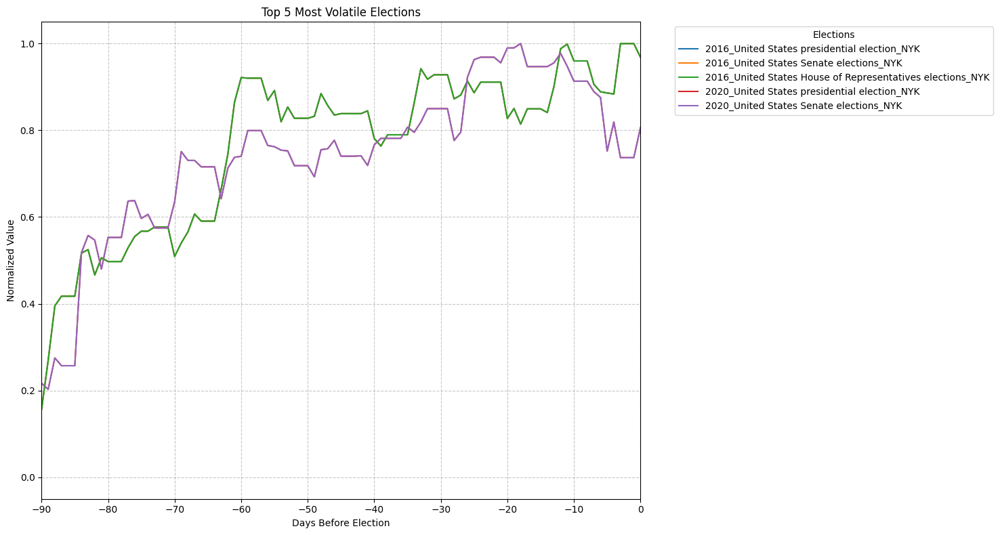

Top 5 most volatile elections:
1. 2016_United States presidential election_NYK: 0.9058
2. 2016_United States Senate elections_NYK: 0.9058
3. 2016_United States House of Representatives elections_NYK: 0.9058
4. 2020_United States presidential election_NYK: 0.8188
5. 2020_United States Senate elections_NYK: 0.8188
2016_United States presidential election_NYK:
  Min: 0.0
  Max: 1.0
  Unique values: 123

2016_United States Senate elections_NYK:
  Min: 0.0
  Max: 1.0
  Unique values: 123

2016_United States House of Representatives elections_NYK:
  Min: 0.0
  Max: 1.0
  Unique values: 123

2020_United States presidential election_NYK:
  Min: 0.0
  Max: 1.0
  Unique values: 124

2020_United States Senate elections_NYK:
  Min: 0.0
  Max: 1.0
  Unique values: 124



In [170]:
import pandas as pd
import numpy as np
from arch import arch_model
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
volatilitydf = pd.read_csv('log_norm_election_data.csv')
volatilitydf['NormalizedDate'] = pd.to_numeric(volatilitydf['NormalizedDate'])  # Ensure NormalizedDate is numeric
volatilitydf.set_index('NormalizedDate', inplace=True)
volatilitydf.index = range(-len(df) + 1, 1)


def fit_figarch_and_get_volatility(series):
    # Remove NaN values
    series = series.dropna()
    
    # Fit FIGARCH(1,d,1) model
    model = arch_model(series, vol='FIGARCH', p=1, q=1)
    
    try:
        results = model.fit(disp='off')
        # Extract conditional volatility
        volatility = np.sqrt(results.conditional_volatility)
        return pd.Series(volatility, index=series.index)
    except:
        print(f"Failed to fit FIGARCH model for {series.name}")
        return pd.Series(index=series.index)

# Calculate pre-election volatility for each election
pre_election_volatility = {}
for column in volatilitydf.columns:
    if column != 'NormalizedDate':
        volatility = fit_figarch_and_get_volatility(volatilitydf[column])
        # Calculate average volatility for the last 30 days before the election
        pre_election_vol = volatility.iloc[-30:].mean()
        pre_election_volatility[column] = pre_election_vol

# Rank elections by volatility
ranked_elections = sorted(pre_election_volatility.items(), key=lambda x: x[1], reverse=True)

# Select top 5 most volatile elections
top_5_elections = ranked_elections[:5]

# Plot the top 5 most volatile elections
plt.figure(figsize=(15, 8))
for election, _ in top_5_elections:
    data = volatilitydf[election].dropna()
    plt.plot(data.index, data.values, label=election)

plt.title("Top 5 Most Volatile Elections")
plt.xlabel("Days Before Election")
plt.ylabel("Normalized Value")
plt.legend(title="Elections", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim(-90, 0)  # Set the x-axis limits from -90 to 0)  # Invert the x-axis
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("Top 5 most volatile elections:")
for i, (election, volatility) in enumerate(top_5_elections, 1):
    print(f"{i}. {election}: {volatility:.4f}")
    
for election, _ in top_5_elections:
    data = volatilitydf[election]
    print(f"{election}:")
    print(f"  Min: {data.min()}")
    print(f"  Max: {data.max()}")
    print(f"  Unique values: {data.nunique()}")
    print()


<Axes: >

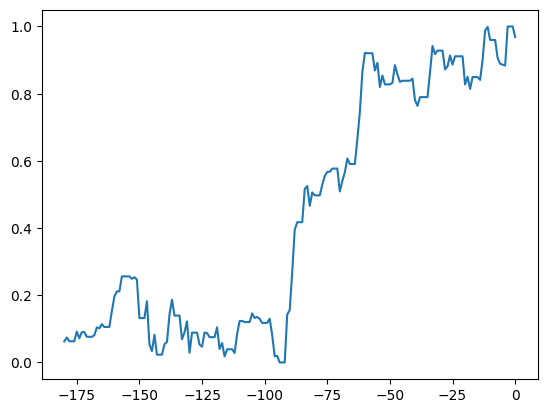

In [172]:
volatilitydf['2016_United States presidential election_NYK'].plot()

In [160]:
election = top_5_elections[0][0]  # Get the name of the first election
print(f"Data for {election}:")
print(df[election].head())
print(f"Number of data points: {df[election].count()}")

Data for 2015_Spanish general election_IBEXIB:
0    6.671526
1    6.671526
2    6.671526
3    6.671526
4    6.671526
Name: 2015_Spanish general election_IBEXIB, dtype: float64
Number of data points: 181


## Min Max normalization

In [1]:
import pandas as pd
import os
from datetime import datetime, timedelta
import numpy as np

# Load the elections data
elections_df = pd.read_csv('DATA/Initial Data.csv')

# Function to normalize dates relative to an election date
def normalize_dates(df, election_date):
    df['NormalizedDate'] = (df['Date'] - election_date).dt.days
    return df[(df['NormalizedDate'] >= -90) & (df['NormalizedDate'] <= 90)].copy()

# Function to clean price data
def clean_price(price):
    if isinstance(price, str):
        return float(price.replace(',', ''))
    return float(price)

# Function to perform min-max normalization
def min_max_normalize(series):
    min_val = series.min()
    max_val = series.max()
    return (series - min_val) / (max_val - min_val)

# Function to load and process index data
def process_index(file_path, election_date, index_name, election_name):
    df = pd.read_csv(file_path)
    df['Date'] = pd.to_datetime(df['Date'])
    df['Price'] = df['Price'].apply(clean_price)
    df = df.sort_values('Date')
    
    normalized_df = normalize_dates(df, election_date)
    if not normalized_df.empty:
        # Apply min-max normalization to the Price column
        normalized_df.loc[:, 'Price'] = min_max_normalize(normalized_df['Price'])
        column_name = f"{election_name}_{index_name}"
        return normalized_df[['NormalizedDate', 'Price']].rename(columns={'Price': column_name})
    return None

# Main processing
all_dfs = []
csv_directory = 'DATA/INDICES/'

for _, election in elections_df.iterrows():
    index_name = election['Index']
    election_date = pd.to_datetime(election['Date 1'])
    election_name = f"{election['Year']}_{election['Elections']}"
    filep = csv_directory + index_name + ".csv"
    file_path = os.path.abspath(filep)
    print(file_path)
    if os.path.exists(file_path):
        processed_df = process_index(file_path, election_date, index_name, election_name)
        if processed_df is not None:
            all_dfs.append(processed_df)
    else:
        print(f"Warning: File not found for index {index_name}")

if all_dfs:
    merged_df = all_dfs[0]
    for df in all_dfs[1:]:
        merged_df = pd.merge(merged_df, df, on='NormalizedDate', how='outer')
    
    # Sort by NormalizedDate
    merged_df = merged_df.sort_values('NormalizedDate')
    
    # Fill NaN values using forward fill and then backward fill
    merged_df = merged_df.ffill().bfill()
    
    # Save the final dataframe to a CSV file
    merged_df.to_csv('minmax_norm_election_data.csv', index=False)
    print("Processing complete. Data saved to 'minmax_norm_election_data.csv'")
else:
    print("No data processed. Check your input files and paths.")

c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\NLFIN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\BNKI.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FTATBNK.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\N3020PI.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FTITLMS30.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\IBEXIB.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\NYK.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political Risk\UPDATE\DATA\INDICES\FRFNN.csv
c:\Users\apuza\iCloudDrive\Intesa\Political 

In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from reportlab.lib.pagesizes import letter
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle
from reportlab.lib.styles import getSampleStyleSheet
from reportlab.lib import colors

def create_pdf_report(results_df, recovery_times, avg_recovery_time, warnings, filename="summary.pdf"):
    doc = SimpleDocTemplate(filename, pagesize=letter)
    styles = getSampleStyleSheet()
    elements = []

    # Title
    elements.append(Paragraph("Election Analysis Summary", styles['Title']))
    elements.append(Spacer(1, 12))

    # Overall results
    elements.append(Paragraph("Overall Results", styles['Heading2']))
    overall_data = [
        ["Metric", "Value"],
        ["Linear Model", f"{linear_weighted_avg:.6f}"],
        ["Non-Linear 2nd Degree Model", f"{non_linear_2nd_weighted_avg:.6f}"],
        ["Non-Linear 3rd Degree Model", f"{non_linear_3rd_weighted_avg:.6f}"],
        ["Non-Linear 4th Degree Model", f"{non_linear_4th_weighted_avg:.6f}"],
        ["Overall Mean Effect", f"{overall_mean_effect:.6f}"],
    ]
    overall_table = Table(overall_data)
    overall_table.setStyle(TableStyle([
        ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
        ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        ('FONTSIZE', (0, 0), (-1, 0), 14),
        ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        ('TEXTCOLOR', (0, 1), (-1, -1), colors.black),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 1), (-1, -1), 'Helvetica'),
        ('FONTSIZE', (0, 1), (-1, -1), 12),
        ('TOPPADDING', (0, 1), (-1, -1), 6),
        ('BOTTOMPADDING', (0, 1), (-1, -1), 6),
        ('GRID', (0, 0), (-1, -1), 1, colors.black)
    ]))
    elements.append(overall_table)
    elements.append(Spacer(1, 12))

    # Negative impact elections (sorted by Mean Effect)
    elements.append(Paragraph("Elections with Negative Impact", styles['Heading2']))
    elements.append(Paragraph(f"Number of elections: {len(negative_elections)}", styles['Normal']))
    elements.append(Paragraph(f"Average coefficient: {avg_negative_coeff:.6f}", styles['Normal']))
    elements.append(Spacer(1, 12))

    sorted_negative = negative_elections.sort_values('Mean_Effect')
    neg_data = [["Election", "Mean Effect"]] + [[index, f"{row['Mean_Effect']:.6f}"] for index, row in sorted_negative.iterrows()]
    neg_table = Table(neg_data)
    neg_table.setStyle(TableStyle([
        ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
        ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        ('FONTSIZE', (0, 0), (-1, 0), 12),
        ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        ('TEXTCOLOR', (0, 1), (-1, -1), colors.black),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 1), (-1, -1), 'Helvetica'),
        ('FONTSIZE', (0, 1), (-1, -1), 10),
        ('TOPPADDING', (0, 1), (-1, -1), 6),
        ('BOTTOMPADDING', (0, 1), (-1, -1), 6),
        ('GRID', (0, 0), (-1, -1), 1, colors.black)
    ]))
    elements.append(neg_table)
    elements.append(Spacer(1, 12))

    # Positive impact elections (sorted by Mean Effect)
    elements.append(Paragraph("Elections with Positive Impact", styles['Heading2']))
    elements.append(Paragraph(f"Number of elections: {len(positive_elections)}", styles['Normal']))
    elements.append(Paragraph(f"Average coefficient: {avg_positive_coeff:.6f}", styles['Normal']))
    elements.append(Spacer(1, 12))

    sorted_positive = positive_elections.sort_values('Mean_Effect', ascending=False)
    pos_data = [["Election", "Mean Effect"]] + [[index, f"{row['Mean_Effect']:.6f}"] for index, row in sorted_positive.iterrows()]
    pos_table = Table(pos_data)
    pos_table.setStyle(TableStyle([
        ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
        ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        ('FONTSIZE', (0, 0), (-1, 0), 12),
        ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        ('TEXTCOLOR', (0, 1), (-1, -1), colors.black),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 1), (-1, -1), 'Helvetica'),
        ('FONTSIZE', (0, 1), (-1, -1), 10),
        ('TOPPADDING', (0, 1), (-1, -1), 6),
        ('BOTTOMPADDING', (0, 1), (-1, -1), 6),
        ('GRID', (0, 0), (-1, -1), 1, colors.black)
    ]))
    elements.append(pos_table)
    elements.append(Spacer(1, 12))

    # Recovery Time Analysis (sorted by recovery time)
    elements.append(Paragraph("Recovery Time Analysis", styles['Heading2']))
    elements.append(Paragraph(f"Average recovery time: {avg_recovery_time:.2f} days", styles['Normal']))
    elements.append(Spacer(1, 12))

    sorted_recovery_times = sorted(recovery_times, key=lambda x: x[1])
    recovery_data = [["Election", "Recovery Time (days)"]] + [[election, f"{time:.2f}"] for election, time in sorted_recovery_times]
    recovery_table = Table(recovery_data)
    recovery_table.setStyle(TableStyle([
        ('BACKGROUND', (0, 0), (-1, 0), colors.grey),
        ('TEXTCOLOR', (0, 0), (-1, 0), colors.whitesmoke),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),
        ('FONTSIZE', (0, 0), (-1, 0), 12),
        ('BOTTOMPADDING', (0, 0), (-1, 0), 12),
        ('BACKGROUND', (0, 1), (-1, -1), colors.beige),
        ('TEXTCOLOR', (0, 1), (-1, -1), colors.black),
        ('ALIGN', (0, 0), (-1, -1), 'CENTER'),
        ('FONTNAME', (0, 1), (-1, -1), 'Helvetica'),
        ('FONTSIZE', (0, 1), (-1, -1), 10),
        ('TOPPADDING', (0, 1), (-1, -1), 6),
        ('BOTTOMPADDING', (0, 1), (-1, -1), 6),
        ('GRID', (0, 0), (-1, -1), 1, colors.black)
    ]))
    elements.append(recovery_table)
    elements.append(Spacer(1, 12))

    # Warnings
    elements.append(Paragraph("Warnings", styles['Heading2']))
    for warning in warnings:
        elements.append(Paragraph(warning, styles['Normal']))

    # Build the PDF
    doc.build(elements)
    print(f"PDF report saved as {filename}")
    

def extract_model_info(df, model_func):
    results = {}
    for election in df.columns[1:]:  # Exclude 'NormalizedDate'
        model = model_func(df[election], election)
        intervention_coeff = model.params['intervention']
        r_squared = model.rsquared
        results[election] = {'intervention_coeff': intervention_coeff, 'r_squared': r_squared}
    return results

def linear_its_analysis(series, election_name):
    df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
    df = df.sort_values('date').reset_index(drop=True)
    df['time'] = range(len(df))
    df['intervention'] = (df['date'] >= 0).astype(int)
    df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
    
    X = sm.add_constant(df[['time', 'intervention', 'time_after_intervention']])
    return sm.OLS(df['index'], X).fit()

def non_linear_its_analysis_2nd_degree(series, election_name):
    df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
    df = df.sort_values('date').reset_index(drop=True)
    df['time'] = range(len(df))
    df['intervention'] = (df['date'] >= 0).astype(int)
    df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
    
    df['time_squared'] = df['time'] ** 2
    df['time_after_intervention_squared'] = df['time_after_intervention'] ** 2
    
    X = sm.add_constant(df[['time', 'time_squared', 'intervention', 'time_after_intervention', 'time_after_intervention_squared']])
    return sm.OLS(df['index'], X).fit()

def non_linear_its_analysis_3rd_degree(series, election_name):
    df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
    df = df.sort_values('date').reset_index(drop=True)
    df['time'] = range(len(df))
    df['intervention'] = (df['date'] >= 0).astype(int)
    df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
    
    df['time_squared'] = df['time'] ** 2
    df['time_after_intervention_squared'] = df['time_after_intervention'] ** 2
    df['time_3'] = df['time'] ** 3
    df['time_after_intervention_3'] = df['time_after_intervention'] ** 3
    
    X = sm.add_constant(df[['time', 'time_squared', 'time_3', 'intervention', 'time_after_intervention', 'time_after_intervention_squared', 'time_after_intervention_3']])
    return sm.OLS(df['index'], X).fit()


def non_linear_its_analysis_4th_degree(series, election_name):
    df = pd.DataFrame({'date': merged_df['NormalizedDate'], 'index': series})
    df = df.sort_values('date').reset_index(drop=True)
    df['time'] = range(len(df))
    df['intervention'] = (df['date'] >= 0).astype(int)
    df['time_after_intervention'] = np.where(df['date'] >= 0, df['time'] - df[df['date'] >= 0]['time'].min(), 0)
    
    df['time_squared'] = df['time'] ** 2
    df['time_after_intervention_squared'] = df['time_after_intervention'] ** 2
    df['time_3'] = df['time'] ** 3
    df['time_after_intervention_3'] = df['time_after_intervention'] ** 3
    df['time_4'] = df['time'] ** 4
    df['time_after_intervention_4'] = df['time_after_intervention'] ** 4
    
    X = sm.add_constant(df[['time', 'time_squared', 'time_3', 'intervention', 'time_after_intervention', 'time_after_intervention_squared', 'time_after_intervention_3','time_4','time_after_intervention_4']])
    return sm.OLS(df['index'], X).fit()

def analyze_recovery_time(df):
    elections = df.columns[1:]  # Exclude 'NormalizedDate'
    recovery_times = []
    warnings = []
    for election in elections:
        # Get pre-election price (at day 0 or the closest day before)
        pre_election_price = df[df['NormalizedDate'] <= 0][election].iloc[-1]
        
        # Check if there was a negative impact (price dropped after election)
        post_election_prices = df[df['NormalizedDate'] > 0][election]
        if post_election_prices.iloc[0] < pre_election_price:
            # Find the first day the price returns to or exceeds the pre-election price
            recovery_day = post_election_prices[post_election_prices >= pre_election_price].index.min()
            
            if pd.notna(recovery_day):
                recovery_time = df.loc[recovery_day, 'NormalizedDate']
                recovery_times.append((election, recovery_time))
            else:
                warning = f"Warning: {election} did not recover within the analyzed period"
                warnings.append(warning)
                print(warning)
    return recovery_times, warnings

# Extract information for all three models
linear_results = extract_model_info(merged_df, linear_its_analysis)
non_linear_2nd_results = extract_model_info(merged_df, non_linear_its_analysis_2nd_degree)
non_linear_3rd_results = extract_model_info(merged_df, non_linear_its_analysis_3rd_degree)
non_linear_4th_results = extract_model_info(merged_df, non_linear_its_analysis_4th_degree)

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Linear_Intervention': [linear_results[e]['intervention_coeff'] for e in linear_results],
    'Linear_R2': [linear_results[e]['r_squared'] for e in linear_results],
    'NonLinear_2nd_Intervention': [non_linear_2nd_results[e]['intervention_coeff'] for e in non_linear_2nd_results],
    'NonLinear_2nd_R2': [non_linear_2nd_results[e]['r_squared'] for e in non_linear_2nd_results],
    'NonLinear_3rd_Intervention': [non_linear_3rd_results[e]['intervention_coeff'] for e in non_linear_3rd_results],
    'NonLinear_3rd_R2': [non_linear_3rd_results[e]['r_squared'] for e in non_linear_3rd_results],
    'NonLinear_4th_Intervention': [non_linear_4th_results[e]['intervention_coeff'] for e in non_linear_4th_results],
    'NonLinear_4th_R2': [non_linear_4th_results[e]['r_squared'] for e in non_linear_4th_results]
}, index=linear_results.keys())

# Calculate mean effect for each election
results_df['Mean_Effect'] = results_df[['Linear_Intervention', 'NonLinear_2nd_Intervention', 'NonLinear_3rd_Intervention','NonLinear_4th_Intervention']].mean(axis=1)

# Calculate weighted averages
def weighted_average(values, weights):
    return np.average(values, weights=weights)

linear_weighted_avg = weighted_average(results_df['Linear_Intervention'], results_df['Linear_R2'])
non_linear_2nd_weighted_avg = weighted_average(results_df['NonLinear_2nd_Intervention'], results_df['NonLinear_2nd_R2'])
non_linear_3rd_weighted_avg = weighted_average(results_df['NonLinear_3rd_Intervention'], results_df['NonLinear_3rd_R2'])
non_linear_4th_weighted_avg = weighted_average(results_df['NonLinear_4th_Intervention'], results_df['NonLinear_4th_R2'])

# Calculate overall mean effect
overall_mean_effect = np.mean([linear_weighted_avg, non_linear_2nd_weighted_avg, non_linear_3rd_weighted_avg,non_linear_4th_weighted_avg])
negative_elections = results_df[results_df['Mean_Effect'] < 0]
avg_negative_coeff = negative_elections['Mean_Effect'].mean()

positive_elections = results_df[results_df['Mean_Effect'] > 0]
avg_positive_coeff = positive_elections['Mean_Effect'].mean()




#####---- --- --- --- --
print("Results DataFrame (sorted by Mean Effect):")
print(results_df.sort_values('Mean_Effect', ascending=False))

print("\nWeighted Averages:")
print(f"Linear Model: {linear_weighted_avg}")
print(f"Non-Linear 2nd Degree Model: {non_linear_2nd_weighted_avg}")
print(f"Non-Linear 3rd Degree Model: {non_linear_3rd_weighted_avg}")
print(f"Non-Linear 4th Degree Model: {non_linear_4th_weighted_avg}")
print(f"\nOverall Mean Effect: {overall_mean_effect}")

print(f"\nNumber of elections with negative impact: {len(negative_elections)}")
print(f"Average coefficient for elections with negative impact: {avg_negative_coeff:.6f}")
print("\nElections with negative impact (sorted by Mean Effect):")
print(negative_elections[['Mean_Effect']].sort_values('Mean_Effect'))

print(f"\nNumber of elections with positive impact: {len(positive_elections)}")
print(f"Average coefficient for elections with positive impact: {avg_positive_coeff:.6f}")
print("\nElections with positive impact (sorted by Mean Effect, descending):")
print(positive_elections[['Mean_Effect']].sort_values('Mean_Effect', ascending=False))
df = pd.read_csv('minmax_norm_election_data.csv')
# Perform recovery time analysis
recovery_times, warnings = analyze_recovery_time(df)
if recovery_times:
    avg_recovery_time = np.mean([time for _, time in recovery_times])
    print(f"\nAverage recovery time: {avg_recovery_time:.2f} days")
    print("\nRecovery times for each negatively impacted election (sorted by recovery time):")
    for election, time in sorted(recovery_times, key=lambda x: x[1]):
        print(f"{election}: {time:.2f} days")
else:
    avg_recovery_time = 0
    print("No elections with negative impact and subsequent recovery were found.")

# Create the PDF report with the new recovery time analysis and warnings
create_pdf_report(results_df, recovery_times, avg_recovery_time, warnings, 'minmax_summary.pdf')

# Create the PDF report with the new recovery time analysis

# Sort elections by mean effect
sorted_elections = results_df.sort_values('Mean_Effect', ascending=False)
print("\nAll Elections Sorted by Mean Effect (descending):")
print(sorted_elections[['Mean_Effect']])


Results DataFrame (sorted by Mean Effect):
                                                    Linear_Intervention  \
2017_French presidential election_FRFNN                        0.330859   
2015_Portuguese legislative election_PTFIN                     0.353312   
2014_Belgian federal election_BEFIN                            0.369210   
2016_United States presidential election_NYK                   0.414174   
2016_United States House of Representatives ele...             0.414174   
2016_United States Senate elections_NYK                        0.414174   
2023_Greek legislative election_FTATBNK                        0.422068   
2019_Danish general election_OMXC20                            0.170420   
2023_Finnish parliamentary election_N3020PI                    0.234294   
2023_Italian local elections_FTITLMS30                         0.063928   
2020_United States Senate elections_NYK                        0.322467   
2020_United States presidential election_NYK             

In [3]:
import pandas as pd
import numpy as np

# Load the normalized data
df = pd.read_csv('minmax_norm_election_data.csv')

def analyze_recovery_time(df):
    elections = df.columns[1:]  # Exclude 'NormalizedDate'
    recovery_times = []

    for election in elections:
        # Get pre-election price (at day 0 or the closest day before)
        pre_election_price = df[df['NormalizedDate'] <= 0][election].iloc[-1]
        
        # Check if there was a negative impact (price dropped after election)
        post_election_prices = df[df['NormalizedDate'] > 0][election]
        if post_election_prices.iloc[0] < pre_election_price:
            # Find the first day the price returns to or exceeds the pre-election price
            recovery_day = post_election_prices[post_election_prices >= pre_election_price].index.min()
            
            if pd.notna(recovery_day):
                recovery_time = df.loc[recovery_day, 'NormalizedDate']
                recovery_times.append((election, recovery_time))
            else:
                print(f"Warning: {election} did not recover within the analyzed period")

    return recovery_times

recovery_times = analyze_recovery_time(df)

if recovery_times:
    avg_recovery_time = np.mean([time for _, time in recovery_times])
    print(f"Average recovery time: {avg_recovery_time:.2f} days")
    
    print("\nRecovery times for each negatively impacted election:")
    for election, time in recovery_times:
        print(f"{election}: {time:.2f} days")
else:
    print("No elections with negative impact and subsequent recovery were found.")

Average recovery time: 10.89 days

Recovery times for each negatively impacted election:
2023_Spanish general election_IBEXIB: 2.00 days
2023_Dutch general election_NLFIN: 2.00 days
2023_Finnish parliamentary election_N3020PI: 2.00 days
2023_Spanish local elections_IBEXIB: 5.00 days
2023_Spanish regional elections_IBEXIB: 5.00 days
2022_United States elections_NYK: 2.00 days
2022_French legislative election_FRFNN: 53.00 days
2021_Norwegian parliamentary election_OFING: 3.00 days
2020_United States presidential election_NYK: 2.00 days
2020_United States Senate elections_NYK: 2.00 days
2020_United States House of Representatives elections_NYK: 2.00 days
2019_Spanish general election_IBEXIB_y: 36.00 days
2018_Italian general election_FTITLMS30: 3.00 days
2017_French legislative election_FRFNN: 17.00 days
2016_Spanish general election_IBEXIB: 2.00 days
2016_United Kingdom Brexit_TRINMX302020: 46.00 days
2014_Swedish general election_SX3010GI: 3.00 days
2013_German federal election_CXPVX: 9

In [4]:
import pandas as pd
import numpy as np
from arch import arch_model
import warnings
warnings.filterwarnings('ignore')

# Load the data
data = pd.read_csv('minmax_norm_election_data.csv')
data.set_index('NormalizedDate', inplace=True)

def fit_figarch_and_get_volatility(series):
    # Remove NaN values
    series = series.dropna()
    
    # Reverse the series for FIGARCH modeling
    
    # Fit FIGARCH(1,d,1) model
    model = arch_model(series, vol='FIGARCH', p=1, o=0 ,q=0)
    
    try:
        results = model.fit(disp='off')
        # Extract conditional volatility
        volatility = np.sqrt(results.conditional_volatility)
        # Reverse the volatility series back to original order
        return pd.Series(volatility, index=series.index)
    except:
        print(f"Failed to fit EGARCH model for {series.name}")
        return pd.Series(index=series.index)

# Apply FIGARCH to each election time series and store results
volatilitydf = pd.DataFrame()
for column in data.columns:
    if column != 'NormalizedDate':
        volatility_column = f"{column}_volatility"
        volatilitydf[volatility_column] = fit_figarch_and_get_volatility(data[column])

# Save the results
volatilitydf.to_csv('election_data_with_figarch_volatility_corrected.csv')
print("Corrected FIGARCH volatility analysis complete. Results saved to 'election_data_with_figarch_volatility_corrected.csv'")

C:\Users\apuza\AppData\Roaming\Python\Python310\site-packages\arch\univariate\base.py:766: ConvergenceWarning: The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


Corrected FIGARCH volatility analysis complete. Results saved to 'election_data_with_figarch_volatility_corrected.csv'


In [12]:
volatilitydf.columns

Index(['2024_French Senate election_FRFNN_volatility',
       '2023_Spanish general election_IBEXIB_volatility',
       '2023_Dutch general election_NLFIN_volatility',
       '2023_Polish parliamentary election_BNKI_volatility',
       '2023_Greek legislative election_FTATBNK_volatility',
       '2023_Finnish parliamentary election_N3020PI_volatility',
       '2023_Italian local elections_FTITLMS30_volatility',
       '2023_Spanish local elections_IBEXIB_volatility',
       '2023_Spanish regional elections_IBEXIB_volatility',
       '2022_United States elections_NYK_volatility',
       '2022_French presidential election_FRFNN_volatility',
       '2022_French legislative election_FRFNN_volatility',
       '2022_Swedish general election_SX3010GI_volatility',
       '2022_Italian general election_FTITLMS30_volatility',
       '2021_German federal election_CXPVX_volatility',
       '2021_Norwegian parliamentary election_OFING_volatility',
       '2021_Dutch general election_NLFIN_volatilit

<Axes: xlabel='NormalizedDate'>

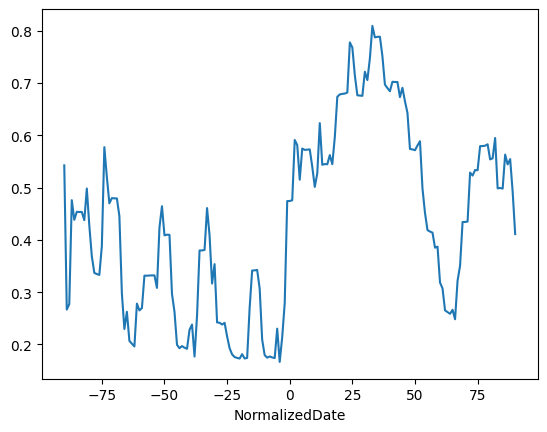

In [17]:
volatilitydf['2022_French legislative election_FRFNN_volatility'].plot()

In [18]:
import pandas as pd
import numpy as np
from arch import arch_model
import warnings
warnings.filterwarnings('ignore')

# Load the data
volatilitydf = pd.read_csv('election_data_with_figarch_volatility_corrected.csv')
volatilitydf.set_index('NormalizedDate', inplace=True)

# Function to calculate average volatility for 10 days prior to election
def calculate_pre_election_volatility(df):
    volatility_data = {}
    
    for column in df.columns:
        if column.endswith('_volatility'):
            # Extract the election name (remove '_volatility' suffix)
            election_name = column[:-11]
            
            # Select data for 10 days prior to election (-10 to -1)
            pre_election_data = df.loc[-10:-1, column]
            
            # Calculate average volatility
            avg_volatility = pre_election_data.mean()
            
            volatility_data[election_name] = avg_volatility
    
    return pd.Series(volatility_data)

# Calculate pre-election volatility for each election
volatility_data = calculate_pre_election_volatility(volatilitydf)

# Display results
print("Average volatility for 10 days prior to each election:")
print(volatility_data.sort_values())
volatility_data.to_csv("pre_election_volatility.csv")


Average volatility for 10 days prior to each election:
2017_German federal election_CXPVX                           0.194235
2021_Norwegian parliamentary election_OFING                  0.204210
2013_Norwegian parliamentary election_OFING                  0.204491
2018_Italian general election_FTITLMS30                      0.217345
2022_French legislative election_FRFNN                       0.224463
2024_French Senate election_FRFNN                            0.232038
2023_Spanish general election_IBEXIB                         0.234906
2016_United States presidential election_NYK                 0.243735
2016_United States Senate elections_NYK                      0.243735
2016_United States House of Representatives elections_NYK    0.243735
2021_German federal election_CXPVX                           0.246233
2017_United Kingdom general election_TRINMX302020            0.251999
2019_Belgian federal election_BEFIN                          0.271787
2017_French presidential election_F

In [19]:
binary_effect_data = pd.DataFrame(index=results_df.index)
binary_effect_data['Effect'] = (results_df['Mean_Effect'] < 0).astype(int)
print("\nBinary Classification of Election Effects:")
print(binary_effect_data)
binary_effect_data.to_csv('election_effect_classification.csv')

print("\nBinary classification dataset saved as 'election_effect_classification.csv'")


Binary Classification of Election Effects:
                                                    Effect
2024_French Senate election_FRFNN                        0
2023_Spanish general election_IBEXIB                     0
2023_Dutch general election_NLFIN                        0
2023_Polish parliamentary election_BNKI                  0
2023_Greek legislative election_FTATBNK                  0
2023_Finnish parliamentary election_N3020PI              0
2023_Italian local elections_FTITLMS30                   0
2023_Spanish local elections_IBEXIB                      0
2023_Spanish regional elections_IBEXIB                   0
2022_United States elections_NYK                         0
2022_French presidential election_FRFNN                  0
2022_French legislative election_FRFNN                   1
2022_Swedish general election_SX3010GI                   0
2022_Italian general election_FTITLMS30                  1
2021_German federal election_CXPVX                       1
2021_Norwegi

In [21]:
def analyze_election_prices(data):
    # Convert the 'NormalizedDate' column to integer
    data['NormalizedDate'] = data['NormalizedDate'].astype(int)

    # Initialize a dictionary to store results
    results = {}

    # Iterate through all columns except 'NormalizedDate'
    for column in data.columns[1:]:
        # Filter data for the range [-90, -1]
        pre_election_data = data[(data['NormalizedDate'] >= -90) & (data['NormalizedDate'] <= -1)][['NormalizedDate', column]]
        
        # Calculate the median for the range [-90, -1]
        median_90_to_1 = pre_election_data[column].median()
        
        # Calculate the average for the range [-10, -1]
        avg_10_to_1 = pre_election_data[
            (pre_election_data['NormalizedDate'] >= -10) & 
            (pre_election_data['NormalizedDate'] <= -1)
        ][column].mean()
        
        # Calculate the spread
        spread = avg_10_to_1 - median_90_to_1
        
        # Store the result
        results[column] = spread

    # Create a DataFrame from the results
    result_df = pd.DataFrame.from_dict(results, orient='index', columns=['Spread'])
    return result_df

# Load the data
result_df = pd.read_csv('minmax_norm_election_data.csv')

# Run the analysis
spread_data = analyze_election_prices(result_df)


spread_data.to_csv('election_price_spread_analysis.csv')



# Display the results
print(spread_data.sort_values())

<bound method DataFrame.sort_values of                                                       Spread
2024_French Senate election_FRFNN                   0.000000
2023_Spanish general election_IBEXIB                0.423004
2023_Dutch general election_NLFIN                   0.057914
2023_Polish parliamentary election_BNKI             0.025398
2023_Greek legislative election_FTATBNK             0.142220
2023_Finnish parliamentary election_N3020PI        -0.401861
2023_Italian local elections_FTITLMS30              0.001524
2023_Spanish local elections_IBEXIB                -0.126802
2023_Spanish regional elections_IBEXIB             -0.126802
2022_United States elections_NYK                   -0.027706
2022_French presidential election_FRFNN            -0.199708
2022_French legislative election_FRFNN             -0.093892
2022_Swedish general election_SX3010GI             -0.002829
2022_Italian general election_FTITLMS30             0.150826
2021_German federal election_CXPVX            

In [3]:

#
# Load the data
import pandas as pd
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('election_data_with_figarch_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)



In [5]:
volatility_data.columns

Index(['2024_French Senate election_FRFNN',
       '2023_Spanish general election_IBEXIB',
       '2023_Dutch general election_NLFIN',
       '2023_Polish parliamentary election_BNKI',
       '2023_Greek legislative election_FTATBNK',
       '2023_Finnish parliamentary election_N3020PI',
       '2023_Italian local elections_FTITLMS30',
       '2023_Spanish local elections_IBEXIB',
       '2023_Spanish regional elections_IBEXIB',
       '2022_United States elections_NYK',
       '2022_French presidential election_FRFNN',
       '2022_French legislative election_FRFNN',
       '2022_Swedish general election_SX3010GI',
       '2022_Italian general election_FTITLMS30',
       '2021_German federal election_CXPVX',
       '2021_Norwegian parliamentary election_OFING',
       '2021_Dutch general election_NLFIN',
       '2020_United States presidential election_NYK',
       '2020_United States Senate elections_NYK',
       '2020_United States House of Representatives elections_NYK',
       '20

<Axes: xlabel='NormalizedDate'>

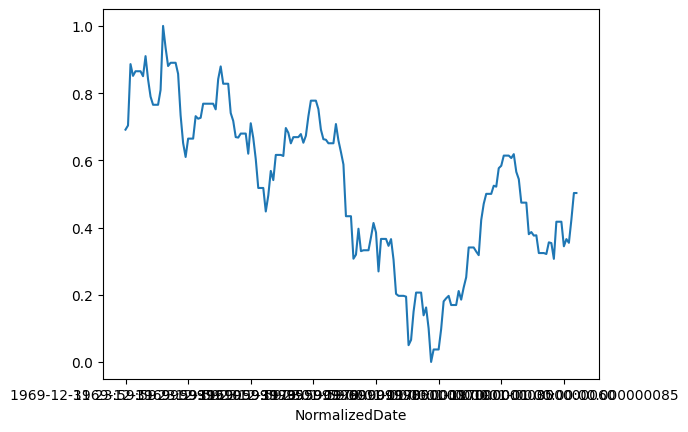

In [8]:
volatility_data['2022_French legislative election_FRFNN'].plot()

In [28]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

# Load the data
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('pre_election_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)

# Reset index for volatility_data to match the other datasets
volatility_data = volatility_data.reset_index()
volatility_data.index = spread_data.index
volatility_data = volatility_data.drop(columns=['index'])

# Combine spread and volatility
X = pd.merge(spread_data, volatility_data, left_index=True, right_index=True, how='inner')

# Ensure all datasets have the same index
common_index = X.index.intersection(binary_effect_data.index)
X = X.loc[common_index]
y = binary_effect_data.loc[common_index, 'Effect']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the logistic regression model
model = LogisticRegression(random_state=42)
model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Print model coefficients
print("\nModel Coefficients:")
for feature, coef in zip(X.columns, model.coef_[0]):
    print(f"{feature}: {coef}")

# Print model intercept
print(f"\nIntercept: {model.intercept_[0]}")

# Calculate and print odds ratios
print("\nOdds Ratios:")
odds_ratios = np.exp(model.coef_[0])
for feature, odds_ratio in zip(X.columns, odds_ratios):
    print(f"{feature}: {odds_ratio}")
    


Confusion Matrix:
[[10  2]
 [ 1  2]]

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       0.50      0.67      0.57         3

    accuracy                           0.80        15
   macro avg       0.70      0.75      0.72        15
weighted avg       0.83      0.80      0.81        15


Model Coefficients:
Spread: 0.597252573715465
0: 0.3183827715732305

Intercept: -0.17757547558236816

Odds Ratios:
Spread: 1.8171195340073873
0: 1.3749024340868643


In [31]:
X.columns

Index(['Spread', '0'], dtype='object')

In [49]:
from scipy.stats import pearsonr
from scipy.stats import spearmanr
corr, sign = pearsonr(y,X['Spread'])
spear, sp_ = spearmanr(y,X['Spread'])
print('Pearsons correlation: %.3f' % corr, "and significance of:  %.4f" % sign)
print('Spearman correlation: %.3f' % spear, "and significance of:  %.4f" % sp_)


Pearsons correlation: 0.337 and significance of:  0.0192
Spearman correlation: 0.305 and significance of:  0.0354


In [48]:
from scipy.stats import pearsonr
corr, sign = pearsonr(y,X['0'])
spear, sp_ = spearmanr(y,X['0'])
print('Pearsons correlation: %.3f' % corr, "and significance of:  %.4f" % sign)
print('Spearman correlation: %.3f' % spear, "and significance of:  %.4f" % sp_)

Pearsons correlation: 0.144 and significance of:  0.3282
Spearman correlation: 0.031 and significance of:  0.8339


In [47]:
from scipy.stats import pearsonr
corr, sign = pearsonr(X['0'],X['Spread'])
spear, sp_ = spearmanr(X['0'],X['Spread'])
print('Pearsons correlation: %.3f' % corr, "and significance of:  %.4f" % sign)
print('Spearman correlation: %.3f' % spear, "and significance of:  %.4f" % sp_)

Pearsons correlation: 0.062 and significance of:  0.6755
Spearman correlation: -0.041 and significance of:  0.7846


In [24]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score

# Load the data
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('pre_election_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)

# Reset index for volatility_data to match the other datasets
volatility_data = volatility_data.reset_index()
volatility_data.index = spread_data.index
volatility_data = volatility_data.drop(columns=['index'])

# Combine spread and volatility
X = pd.merge(spread_data, volatility_data, left_index=True, right_index=True, how='inner')
y = binary_effect_data['Effect']

# Create the logistic regression model
model = LogisticRegression(random_state=42)

# Define the scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

# Perform cross-validation
cv_results = cross_validate(model, X, y, cv=5, scoring=scoring)

# Print the results
for metric, scores in cv_results.items():
    if metric.startswith('test_'):
        print(f"{metric[5:].capitalize()} score: {scores.mean():.2f} (+/- {scores.std() * 2:.2f})")

# Fit the model on the entire dataset to get coefficients and odds ratios
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
model.fit(X_scaled, y)

# Print model coefficients
print("\nModel Coefficients:")
for feature, coef in zip(X.columns, model.coef_[0]):
    print(f"{feature}: {coef}")

# Print model intercept
print(f"\nIntercept: {model.intercept_[0]}")

# Calculate and print odds ratios
print("\nOdds Ratios:")
odds_ratios = np.exp(model.coef_[0])
for feature, odds_ratio in zip(X.columns, odds_ratios):
    print(f"{feature}: {odds_ratio}")

Accuracy score: 0.60 (+/- 0.07)
Precision score: 0.39 (+/- 0.07)
Recall score: 0.60 (+/- 0.07)
F1 score: 0.47 (+/- 0.06)

Model Coefficients:
Spread: 0.6519169703221663
0: 0.23498527077370315

Intercept: -0.5477912407252817

Odds Ratios:
Spread: 1.9192163857750575
0: 1.2648901377426025


In [51]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler

# Load the data
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('pre_election_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)

# Reset index for volatility_data to match the other datasets
volatility_data = volatility_data.reset_index()
volatility_data.index = spread_data.index
volatility_data = volatility_data.drop(columns=['index'])

# Combine spread and volatility
X = pd.merge(spread_data, volatility_data, left_index=True, right_index=True, how='inner')
y = binary_effect_data['Effect']

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create the Random Forest model with increased randomness
rf_model = RandomForestClassifier(
    n_estimators=95,  # Reduced number of trees
    max_features='sqrt',  # Use sqrt(n_features) features in each split
    bootstrap=True,  # Use bootstrap samples
    max_depth=5,  # Limit tree depth to prevent overfitting
    min_samples_leaf=2,  # Minimum number of samples required at a leaf node
    random_state=42
)

# Define the scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

# Perform cross-validation
cv_results = cross_validate(rf_model, X_scaled, y, cv=5, scoring=scoring)

# Print the cross-validation results
for metric, scores in cv_results.items():
    if metric.startswith('test_'):
        print(f"{metric[5:].capitalize()} score: {scores.mean():.2f} (+/- {scores.std() * 2:.2f})")

# Fit the model on the entire dataset to get feature importance
rf_model.fit(X_scaled, y)

# Print feature importance
print("\nFeature Importance:")
for feature, importance in zip(X.columns, rf_model.feature_importances_):
    print(f"{feature}: {importance:.4f}")

# Make predictions on the entire dataset
y_pred = rf_model.predict(X_scaled)

# Print confusion matrix
from sklearn.metrics import confusion_matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred))

# Print classification report
from sklearn.metrics import classification_report
print("\nClassification Report:")
print(classification_report(y, y_pred))

Accuracy score: 0.68 (+/- 0.32)
Precision score: 0.66 (+/- 0.37)
Recall score: 0.68 (+/- 0.32)
F1 score: 0.66 (+/- 0.34)

Feature Importance:
Spread: 0.5853
0: 0.4147

Confusion Matrix:
[[27  3]
 [ 1 17]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93        30
           1       0.85      0.94      0.89        18

    accuracy                           0.92        48
   macro avg       0.91      0.92      0.91        48
weighted avg       0.92      0.92      0.92        48



In [53]:
import statsmodels.api as sm
logit_model=sm.Logit(y_train,X_train)
result=logit_model.fit()
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.641478
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                 Effect   No. Observations:                   33
Model:                          Logit   Df Residuals:                       31
Method:                           MLE   Df Model:                            1
Date:                Tue, 23 Jul 2024   Pseudo R-squ.:                 0.06899
Time:                        14:55:57   Log-Likelihood:                -21.169
converged:                       True   LL-Null:                       -22.737
Covariance Type:            nonrobust   LLR p-value:                   0.07653
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Spread         3.2110      1.896      1.693      0.090      -0.505       6.927
0             -0.4528      0.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler

# Load the data
spread_data = pd.read_csv('election_price_spread_analysis.csv', index_col=0)
volatility_data = pd.read_csv('pre_election_volatility.csv', index_col=0)
binary_effect_data = pd.read_csv('election_effect_classification.csv', index_col=0)

# Reset index for volatility_data to match the other datasets
volatility_data = volatility_data.reset_index()
volatility_data.index = spread_data.index
volatility_data = volatility_data.drop(columns=['index'])

# Combine spread and volatility
X = pd.merge(spread_data, volatility_data, left_index=True, right_index=True, how='inner')
y = binary_effect_data['Effect']

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create the Random Forest model with increased randomness
rf_model = RandomForestClassifier(
    n_estimators=95,  # Reduced number of trees
    max_features='sqrt',  # Use sqrt(n_features) features in each split
    bootstrap=True,  # Use bootstrap samples
    max_depth=5,  # Limit tree depth to prevent overfitting
    min_samples_leaf=2,  # Minimum number of samples required at a leaf node
    random_state=42
)

# Define the scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

# Perform cross-validation
cv_results = cross_validate(rf_model, X_scaled, y, cv=5, scoring=scoring)

# Print the cross-validation results
for metric, scores in cv_results.items():
    if metric.startswith('test_'):
        print(f"{metric[5:].capitalize()} score: {scores.mean():.2f} (+/- {scores.std() * 2:.2f})")

# Fit the model on the entire dataset to get feature importance
rf_model.fit(X_scaled, y)

# Print feature importance
print("\nFeature Importance:")
for feature, importance in zip(X.columns, rf_model.feature_importances_):
    print(f"{feature}: {importance:.4f}")

# Make predictions on the entire dataset
y_pred = rf_model.predict(X_scaled)

# Print confusion matrix
from sklearn.metrics import confusion_matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y, y_pred))

# Print classification report
from sklearn.metrics import classification_report
print("\nClassification Report:")
print(classification_report(y, y_pred))